In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy.io as sio
from scipy.signal import correlate
from scipy.interpolate import interp1d
from scipy.ndimage import uniform_filter1d
import h5py
from scipy.stats import pearsonr

In [2]:
def extract_data(folder):
    """Extract data from .mat files in the specified folder"""
    data_dict = {}

    for filename in os.listdir(folder):
        if filename.endswith('.mat'):
            file_path = os.path.join(folder, filename)
            file_key = os.path.splitext(filename)[0]

            try:
                # Try loading with scipy.io (for most MATLAB files)
                mat_data = sio.loadmat(file_path)
                clean_data = {k: v for k, v in mat_data.items() if not k.startswith('__')}

            except NotImplementedError:
                # If it's a v7.3 (HDF5-based) file, use h5py
                with h5py.File(file_path, 'r') as f:
                    clean_data = {}
                    def recursively_load(name, obj):
                        if isinstance(obj, h5py.Dataset):
                            clean_data[name] = np.array(obj)
                    f.visititems(recursively_load)

            # Extract 'dataArray' key from file structure
            if 'dataArray' in clean_data:
                arr = clean_data['dataArray']
                if arr.ndim == 2 and arr.shape[1] >= 2:
                    HN_data = arr[:, 0]
                    WL_data = arr[:, 1]

                    data_dict[f'{file_key}_HN_data'] = HN_data
                    data_dict[f'{file_key}_WL_data'] = WL_data

            # Metadata stored here in case it is needed later
            meta = {}
            for key in ['runTime', 'xCenCorrection', 'xLinear', 'xLinearStage']:
                if key in clean_data:
                    meta[key] = clean_data[key]
            data_dict[f'{file_key}_meta'] = meta

    return data_dict

In [3]:
def nfft(a, axis=0):
    """Numpy equivalent of MATLAB's ifftshift(fft(fftshift(a)))"""
    return np.fft.ifftshift(np.fft.fft(np.fft.fftshift(a, axes=axis), axis=axis), axes=axis)


def nifft(a, axis=0):
    """Numpy equivalent of MATLAB's fftshift(ifft(ifftshift(a)))"""
    return np.fft.fftshift(np.fft.ifft(np.fft.ifftshift(a, axes=axis), axis=axis), axes=axis)

In [4]:
def smooth(data, window_size):
    """Simple moving average smoothing"""
    return uniform_filter1d(data, size=window_size, mode='nearest')


def calibrateDelayAxis(heneData, xL):
    """
    Calibrate the delay axis using HeNe data
    This is a simplified version - you may need to adjust based on your specific calibration needs
    """
    # For now, return xL unchanged. You can implement full calibration if needed
    # The original MATLAB function likely does interferometric calibration
    return xL


def removeLinearTerm(w, phase):
    """Remove linear term from phase using polynomial fit"""
    idx = ~np.isnan(phase)
    if np.sum(idx) < 2:
        return phase
    
    nanPhase = phase[idx]
    nanW = w[idx]
    
    # Fit linear polynomial
    p = np.polyfit(nanW, nanPhase, 1)
    phase = phase - p[0] * w - p[1]
    
    return phase


def calculateZeroDelayCorrection(w, dw, xL, wl_data):
    """Calculate zero delay correction from white light data"""
    wlSpec = nfft(wl_data - np.median(wl_data))
    wlSpec[w < 0] = 0
    
    # Calculate center of mass in frequency domain
    wCen = np.sum(w * np.abs(wlSpec)**2) / np.sum(np.abs(wlSpec)**2)
    wCenPx = int(np.round(wCen / dw))
    wlSpec = np.roll(wlSpec, -wCenPx)
    
    wlTemp = smooth(np.abs(nifft(smooth(wlSpec, 5)))**2, 5)
    
    xCen = np.sum(xL * wlTemp) / np.sum(wlTemp)
    
    return xCen, wlSpec

In [5]:
def WLI_processData(dataArray, xL, start_idx=None, end_idx=None):
    """
    Process WLI data to extract spectrum and phase
    
    Parameters:
    -----------
    dataArray : 2D array with columns [HeNe, WhiteLight]
    xL : Linear delay axis
    start_idx, end_idx : Optional indices to slice the data
    
    Returns:
    --------
    xCen : Zero delay correction
    spectrum : Processed spectrum (HeNe and WL)
    wLPhase : Unwrapped white light phase
    lambda_vals : Wavelength array
    """
    
    # Slice data if indices provided
    if start_idx is not None and end_idx is not None:
        dataArray = dataArray[start_idx:end_idx, :]
        xL = xL[start_idx:end_idx]
    
    N = len(dataArray)
    heneData = dataArray[:, 0]
    
    # Calibrate delay axis (simplified - keeping linear for now)
    xNL = calibrateDelayAxis(heneData, xL)
    
    # Interpolate data onto calibrated axis
    f_hene = interp1d(xNL, heneData, kind='cubic', fill_value=0, bounds_error=False)
    f_wl = interp1d(xNL, dataArray[:, 1], kind='cubic', fill_value=0, bounds_error=False)
    dataArray_interp = np.column_stack([f_hene(xL), f_wl(xL)])
    
    # Calculate frequency axis
    c_mm_ps = 0.3  # Speed of light in mm/ps
    t = 2 * xL / c_mm_ps
    dw = 2 * np.pi / (np.max(np.abs(t)) - np.min(np.abs(t)))
    wMax = dw * N
    w = np.arange(-wMax/2, wMax/2, dw)
    
    # Ensure w and data have same length
    if len(w) > N:
        w = w[:N]
    elif len(w) < N:
        # Pad or trim as needed
        w = np.linspace(-wMax/2, wMax/2, N)
    
    # Convert to wavelength (in microns)
    lambda_vals = (2 * np.pi * c_mm_ps / w) * 1000
    idx = (lambda_vals > 0.2) & (lambda_vals < 1.5)
    lambda_vals = lambda_vals[idx]
    
    # Calculate zero delay correction
    xCen = calculateZeroDelayCorrection(w, dw, xL, dataArray_interp[:, 1])[0]
    
    # Process field - subtract baseline
    field = dataArray_interp - dataArray_interp[N//4, :]  # Equivalent to dataArray(256,:) for N=1024
    field[field < -0.03] = 0
    field = nfft(field, axis=0)
    
    # Calculate spectrum
    spectrum = np.abs(field)**2
    
    # Extract white light phase
    wLPhase = np.unwrap(np.angle(field[idx, 1]))
    
    # Smooth and normalize spectrum
    spectrum = spectrum[idx, :]
    spectrum[:, 0] = smooth(spectrum[:, 0], 5)
    spectrum = (spectrum - np.min(spectrum, axis=0)) / (np.max(spectrum, axis=0) - np.min(spectrum, axis=0))
    
    # Mask low-intensity regions in phase
    phaseBlank = spectrum[:, 1] < 0.1
    wLPhase[phaseBlank] = np.nan
    
    # Remove linear term from phase
    wLPhase = removeLinearTerm(w[idx], wLPhase)
    
    # Smooth phase (only non-NaN values)
    valid_idx = ~np.isnan(wLPhase)
    if np.sum(valid_idx) > 5:
        wLPhase[valid_idx] = smooth(wLPhase[valid_idx], 5)
    
    return xCen, spectrum, wLPhase, lambda_vals, w[idx]

In [6]:
def fit_phase_polynomial(lambda_vals, phase, degree=2):
    """
    Fit phase with polynomial of specified degree
    
    Parameters:
    -----------
    lambda_vals : Wavelength array
    phase : Phase array (may contain NaNs)
    degree : Polynomial degree (default=2 for quadratic)
    
    Returns:
    --------
    coeffs : Polynomial coefficients
    phase_fit : Fitted phase values
    """
    # Remove NaN values for fitting
    valid_idx = ~np.isnan(phase)
    
    if np.sum(valid_idx) < degree + 1:
        return None, None
    
    # Fit polynomial
    coeffs = np.polyfit(lambda_vals[valid_idx], phase[valid_idx], degree)
    
    # Evaluate polynomial
    phase_fit = np.polyval(coeffs, lambda_vals)
    
    return coeffs, phase_fit

In [15]:
def plot_spectrum_and_phase(lambda_vals, spectrum, phase, phase_fit=None, title="WLI Data"):
    """
    Plot spectrum and phase on dual y-axis
    
    Parameters:
    -----------
    lambda_vals : Wavelength array in microns
    spectrum : Spectrum array (2 columns: HeNe, WL)
    phase : Phase array
    phase_fit : Optional fitted phase
    title : Plot title
    """
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Plot spectrum on left axis
    color1 = 'tab:blue'
    ax1.set_xlabel('λ [μm]', fontweight='bold', fontsize=14)
    ax1.set_ylabel('Spectrum [a.u.]', fontweight='bold', fontsize=14, color=color1)
    ax1.plot(lambda_vals, spectrum[:, 0], label='HeNe Spectrum', color='red', alpha=0.7)
    ax1.plot(lambda_vals, spectrum[:, 1], label='WL Spectrum', color='black', alpha=0.7)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.tick_params(axis='both', which='both', direction='in', top=True, right=True)
    ax1.grid(True, alpha=0.3)
    
    # Plot phase on right axis
    ax2 = ax1.twinx()
    color2 = 'tab:green'
    ax2.set_ylabel('Phase [rad]', fontweight='bold', fontsize=14, color=color2)
    ax2.plot(lambda_vals, phase, '-', label='WL Phase', color=color2, markersize=3, alpha=0.6)
    
    if phase_fit is not None:
        ax2.plot(lambda_vals, phase_fit, '--', label='Phase Fit', color='black', linewidth=2)
    
    ax2.tick_params(axis='y', labelcolor=color2)
    
    # Combine legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=10)
    
    plt.title(title, fontweight='bold', fontsize=16)
    plt.tight_layout()
    
    return fig, (ax1, ax2)

Processing data from index 700 to 1550
Found 25 datasets

Processing: raw_data_001_20251015
  Zero delay correction: 0.009790
  Polynomial coefficients: [-161.55178458  645.08160287 -848.59198811  367.85227866]


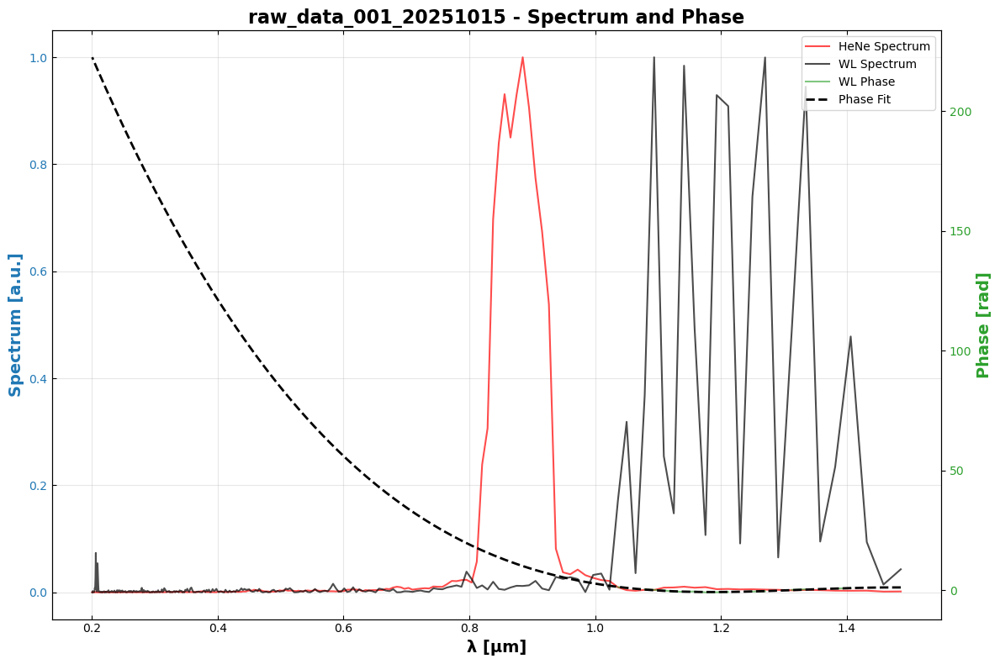


Processing: raw_data_002_20251015
  Zero delay correction: 0.008180
  Polynomial coefficients: [ -473.66124     1726.57834963 -2085.36750436   834.67699402]


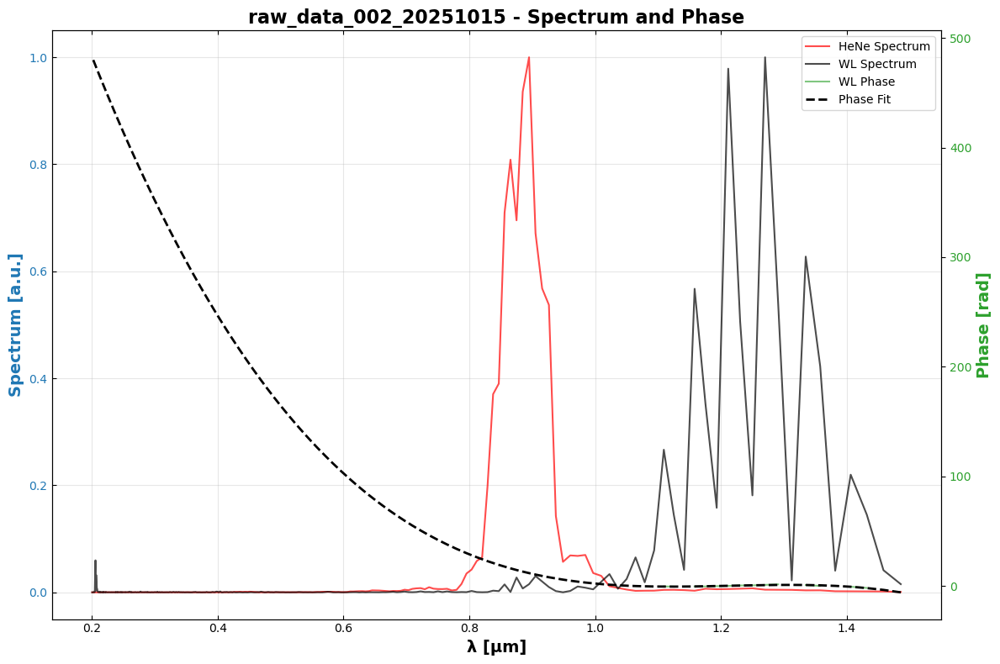


Processing: raw_data_003_20251015
  Zero delay correction: 0.009270
  Polynomial coefficients: [ -399.49590605  1456.34362093 -1759.32494575   704.48352825]


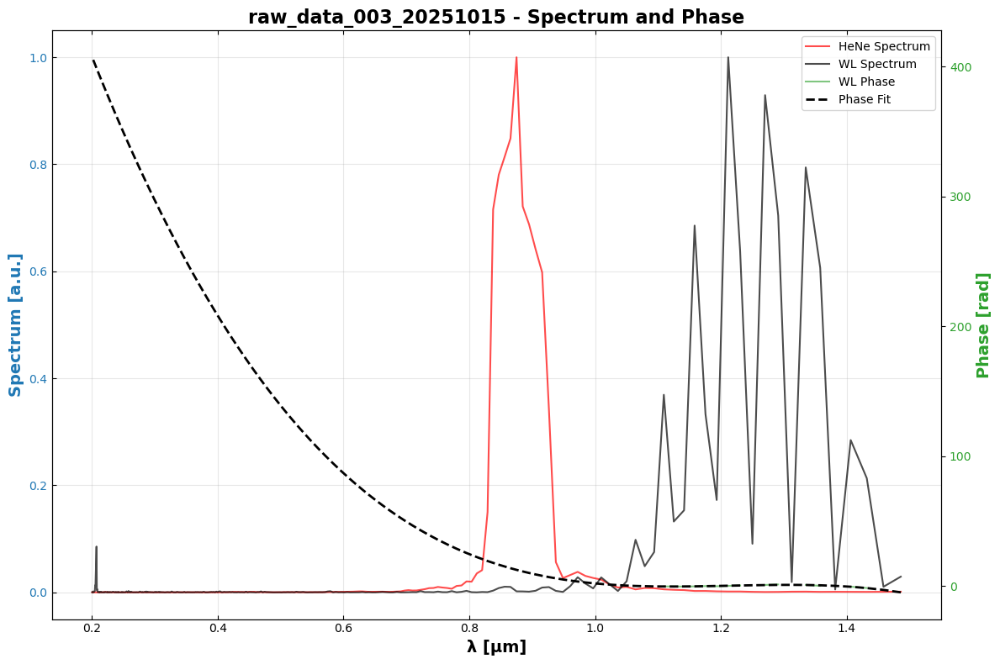


Processing: raw_data_004_20251015
  Zero delay correction: 0.009033
  Polynomial coefficients: [ -531.19372276  1802.24912203 -2012.30179178   738.68562679]


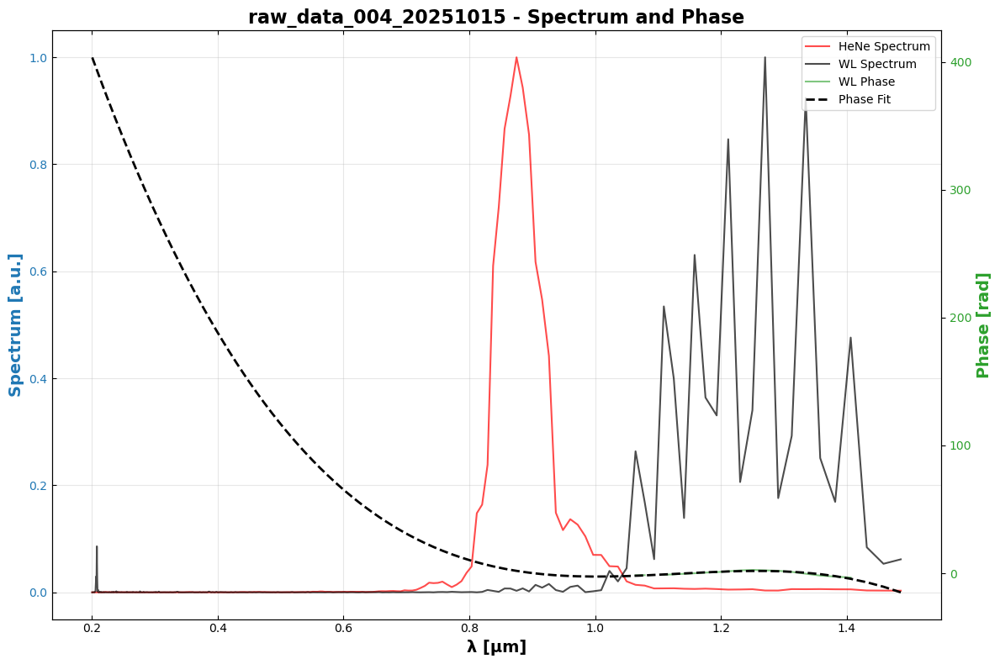


Processing: raw_data_005_20251015
  Zero delay correction: 0.008073
  Polynomial coefficients: [ -589.34788231  2093.09779196 -2462.51346706   959.86440245]


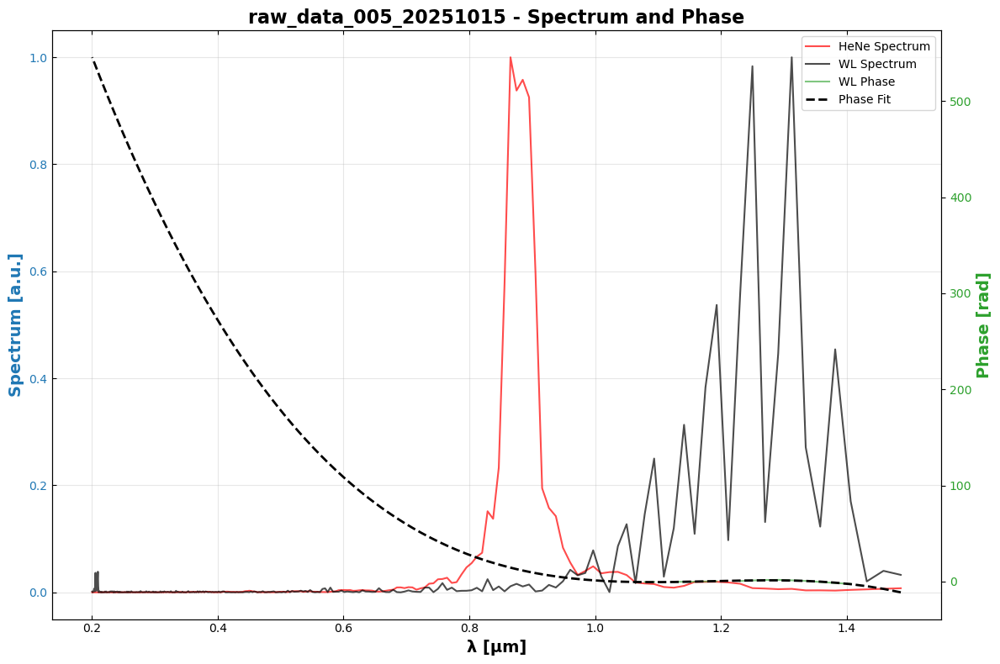


Processing: raw_data_006_20251015
  Zero delay correction: 0.011424
  Polynomial coefficients: [-126.96855172  347.33435853 -265.41228057   39.81605013]


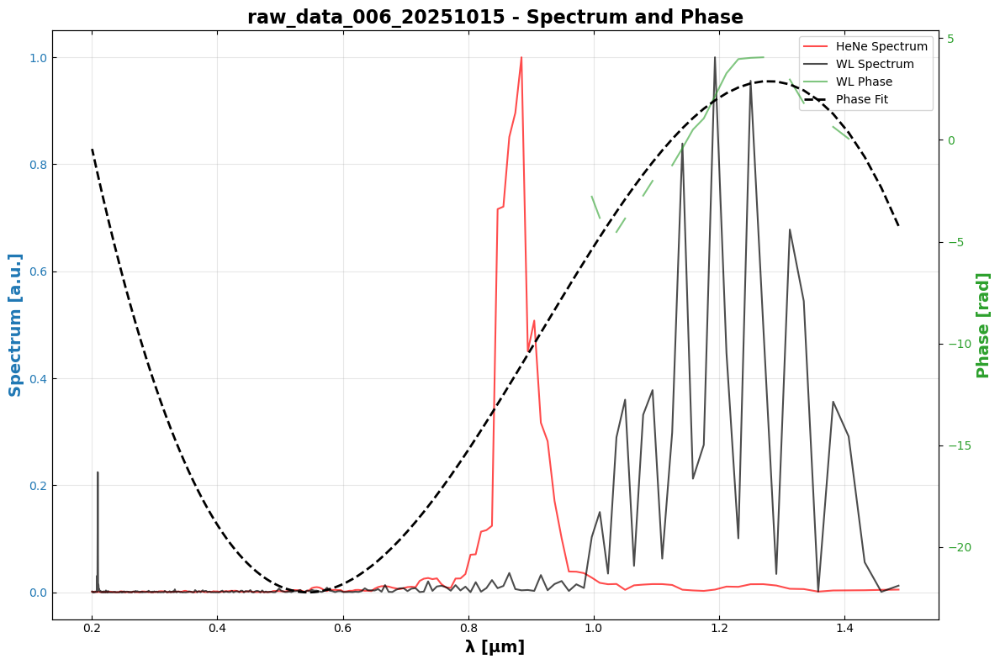


Processing: raw_data_007_20251015
  Zero delay correction: 0.008745
  Polynomial coefficients: [ -433.15229828  1555.50206354 -1851.21374304   730.27080307]


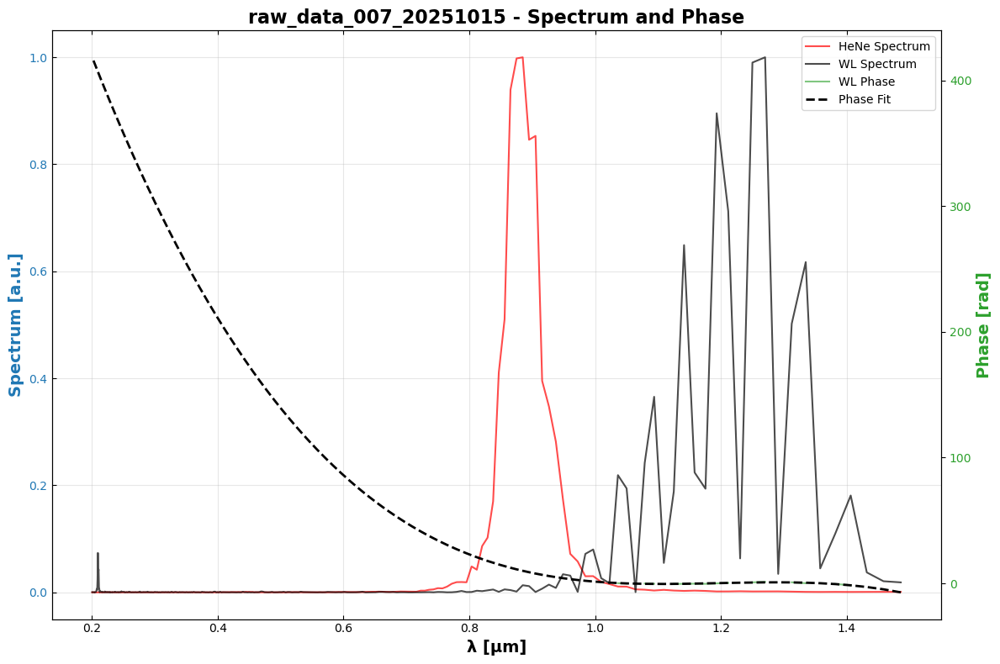


Processing: raw_data_008_20251015
  Zero delay correction: 0.011046
  Polynomial coefficients: [ -516.10539532  1882.51169688 -2277.71837167   914.07704063]


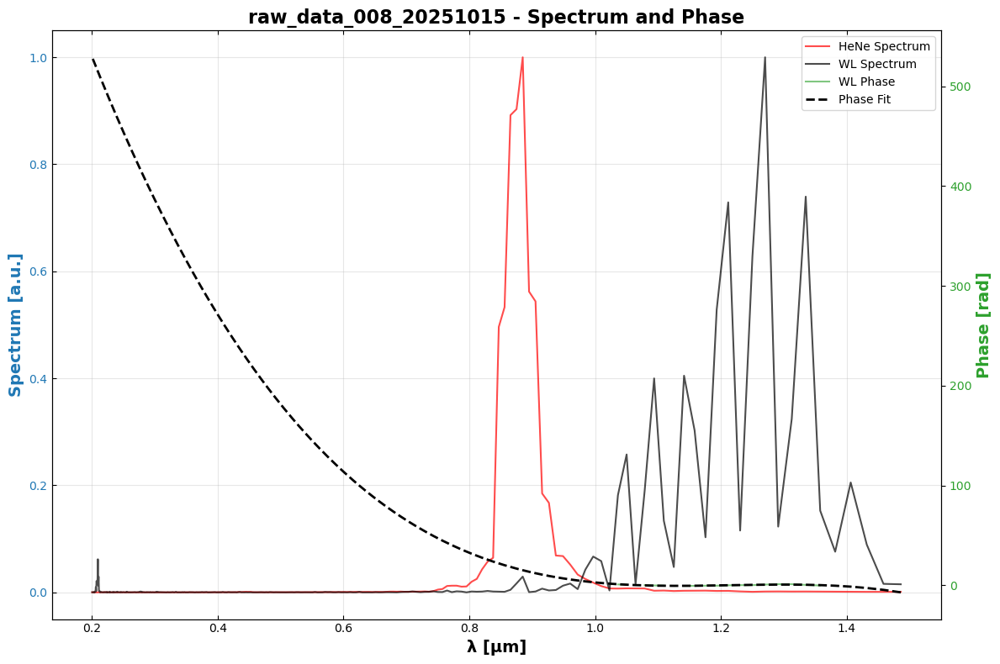


Processing: raw_data_009_20251015
  Zero delay correction: 0.009293
  Polynomial coefficients: [ -530.01564761  1918.19718085 -2301.33615336   915.35665097]


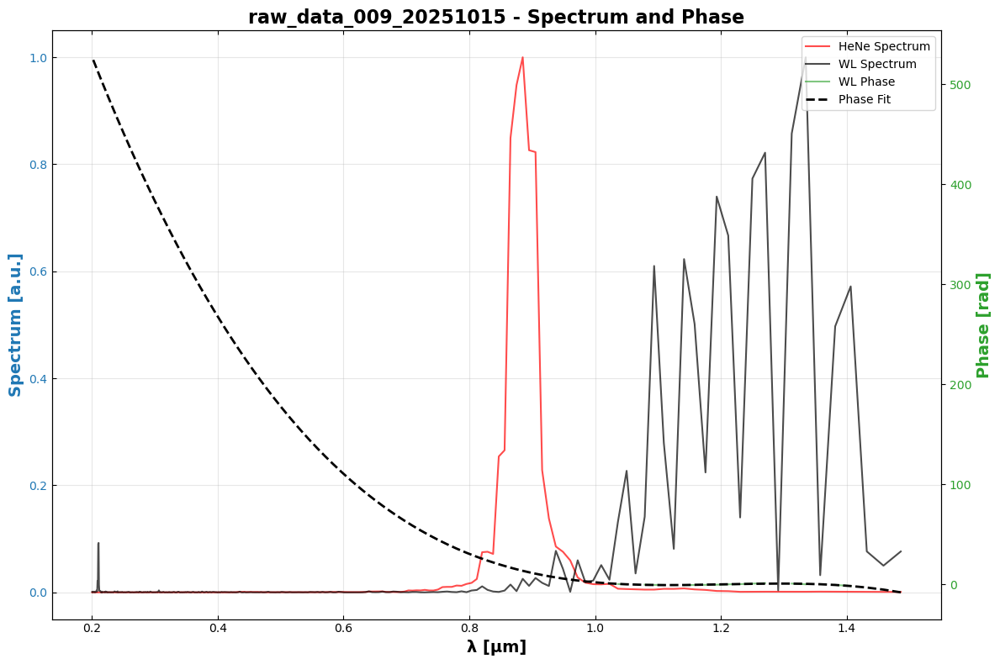


Processing: raw_data_010_20251015
  Zero delay correction: 0.009805
  Polynomial coefficients: [ -567.79869226  2041.24239249 -2432.40823338   960.85170001]


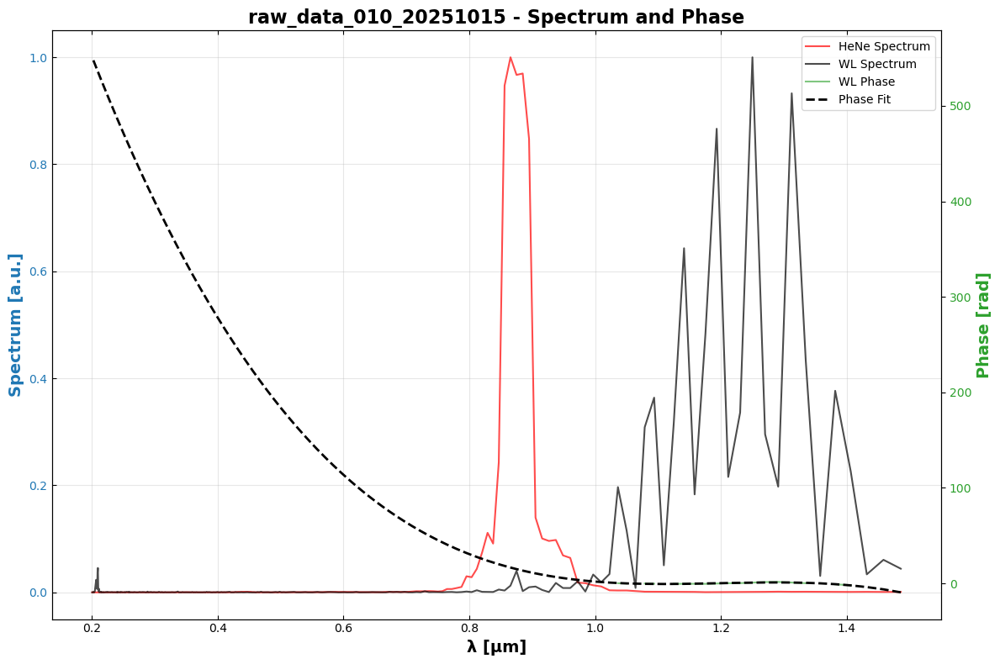


Processing: raw_data_011_20251015
  Zero delay correction: 0.007927
  Polynomial coefficients: [ -486.76407386  1755.69821916 -2099.7242121    832.78164321]


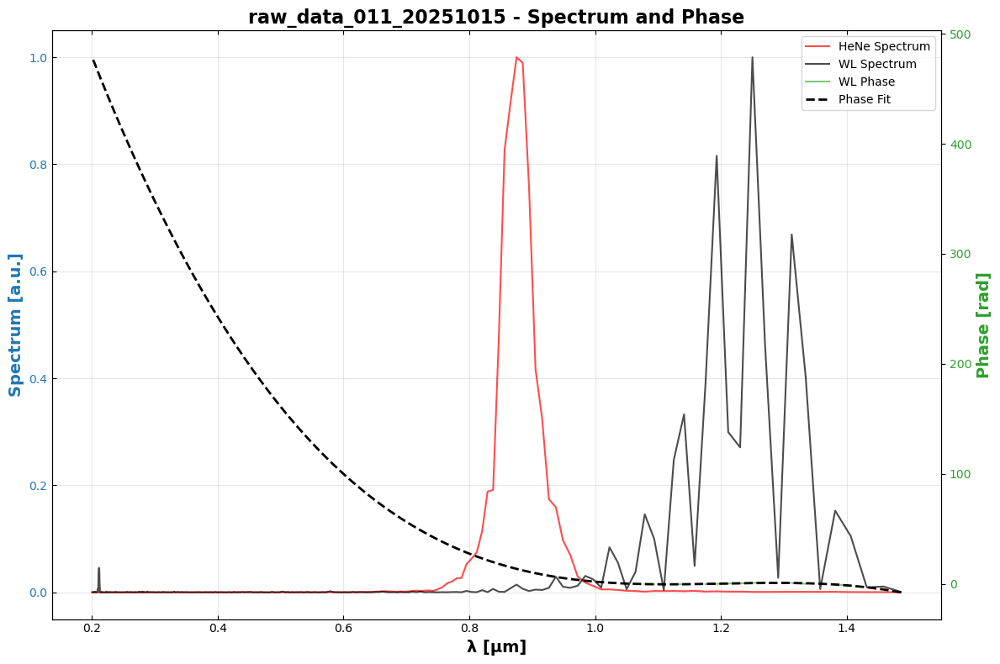


Processing: raw_data_012_20251015
  Zero delay correction: 0.007108
  Polynomial coefficients: [ -84.80336868  362.68548197 -507.84303304  233.33918683]


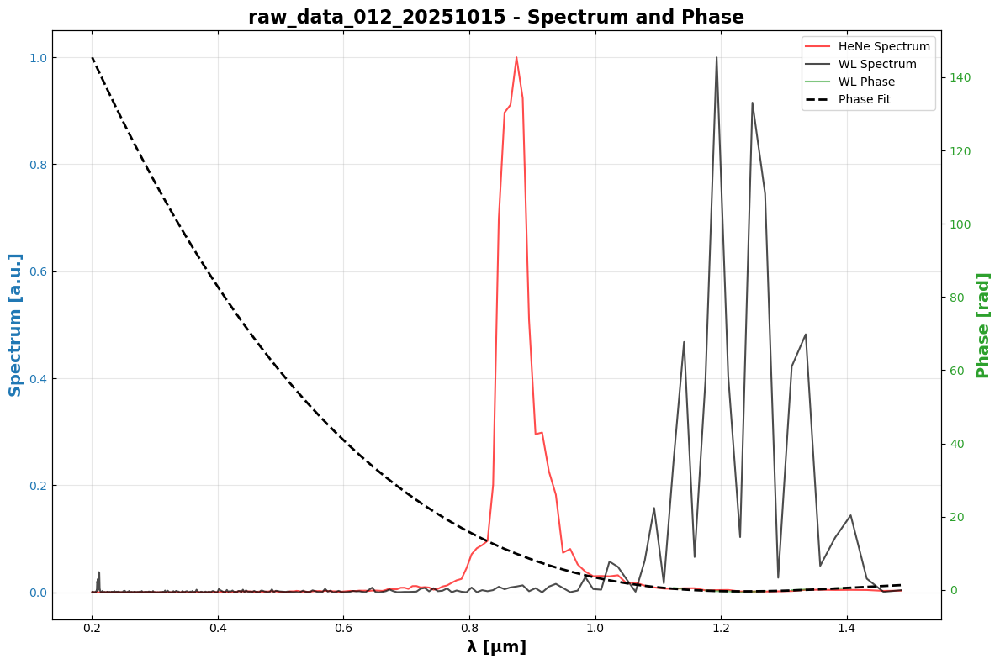


Processing: raw_data_013_20251015
  Zero delay correction: 0.008892
  Polynomial coefficients: [ -70.2799548   223.28117993 -190.86232076   28.45268195]


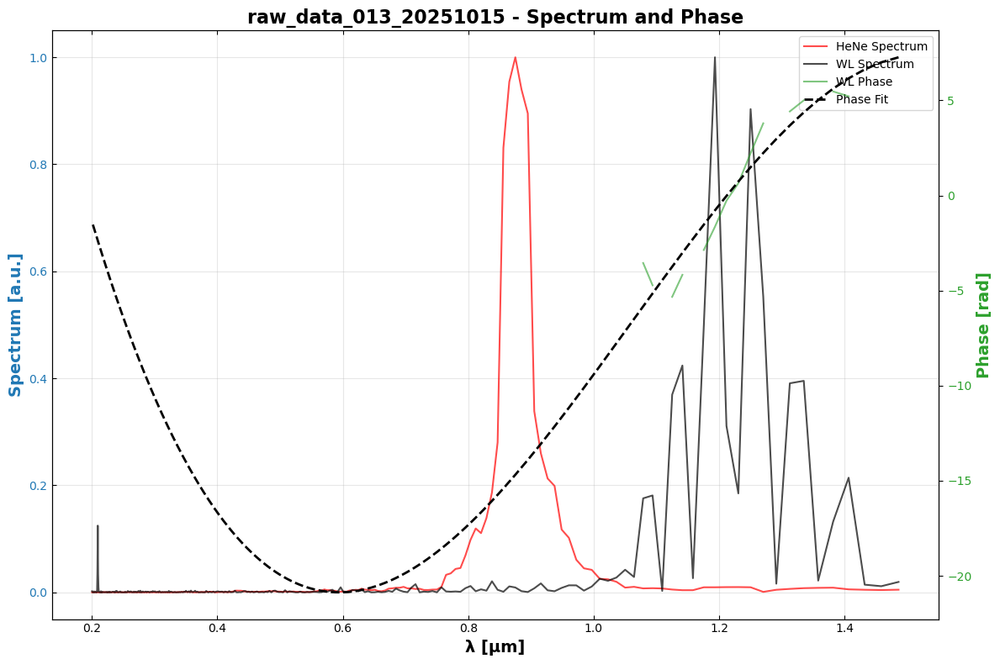


Processing: raw_data_014_20251015
  Zero delay correction: 0.009062
  Polynomial coefficients: [-151.65042815  619.79657761 -833.61444528  369.21506804]


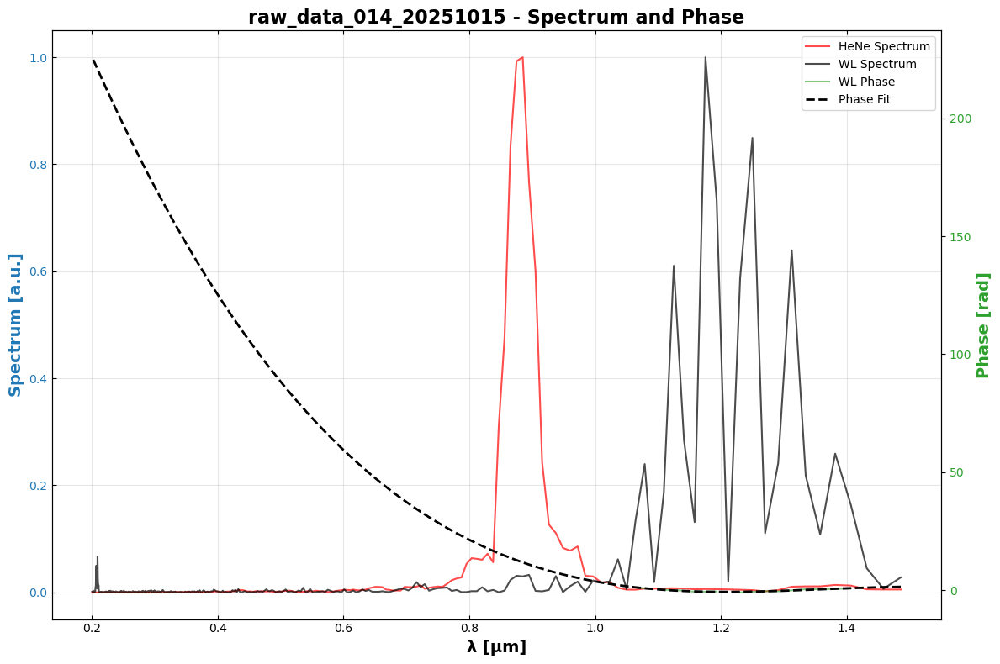


Processing: raw_data_015_20251015
  Zero delay correction: 0.010597
  Polynomial coefficients: [ -482.44043099  1721.22577053 -2033.78297873   795.87903478]


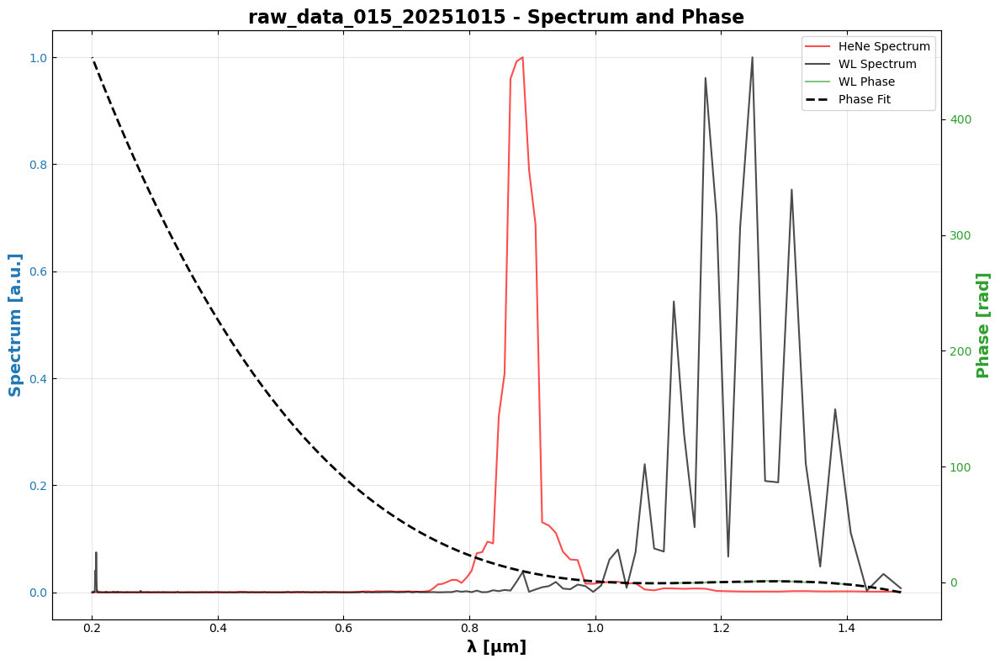


Processing: raw_data_016_20251015
  Zero delay correction: 0.011611
  Polynomial coefficients: [ -912.50436996  3369.90804633 -4127.84070063  1677.01871334]


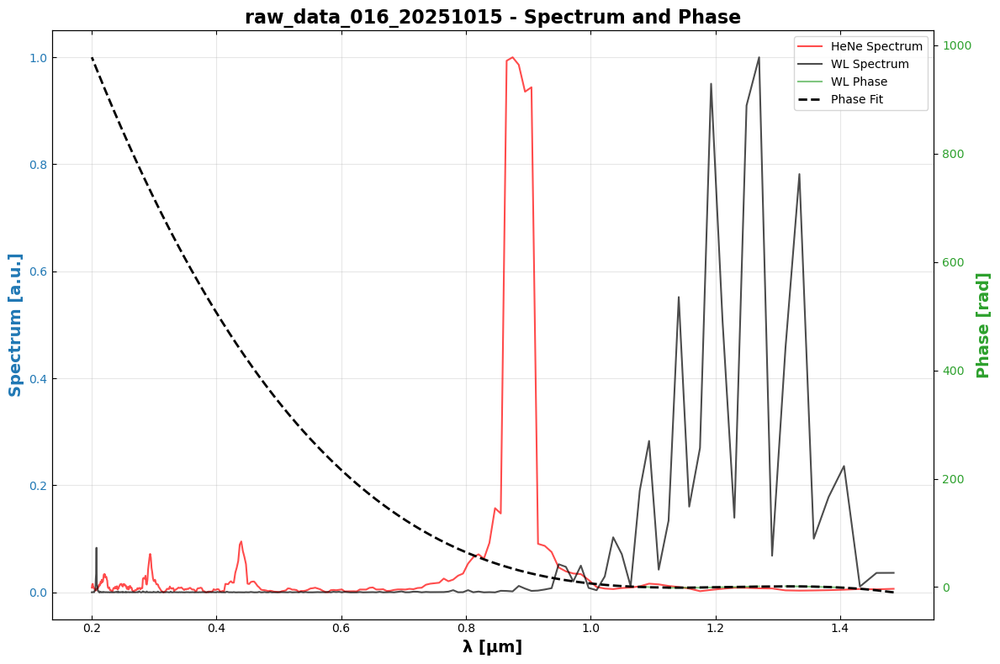


Processing: raw_data_017_20251015
  Zero delay correction: 0.011287
  Polynomial coefficients: [ -475.70552835  1985.79435817 -2720.50917069  1225.02791375]


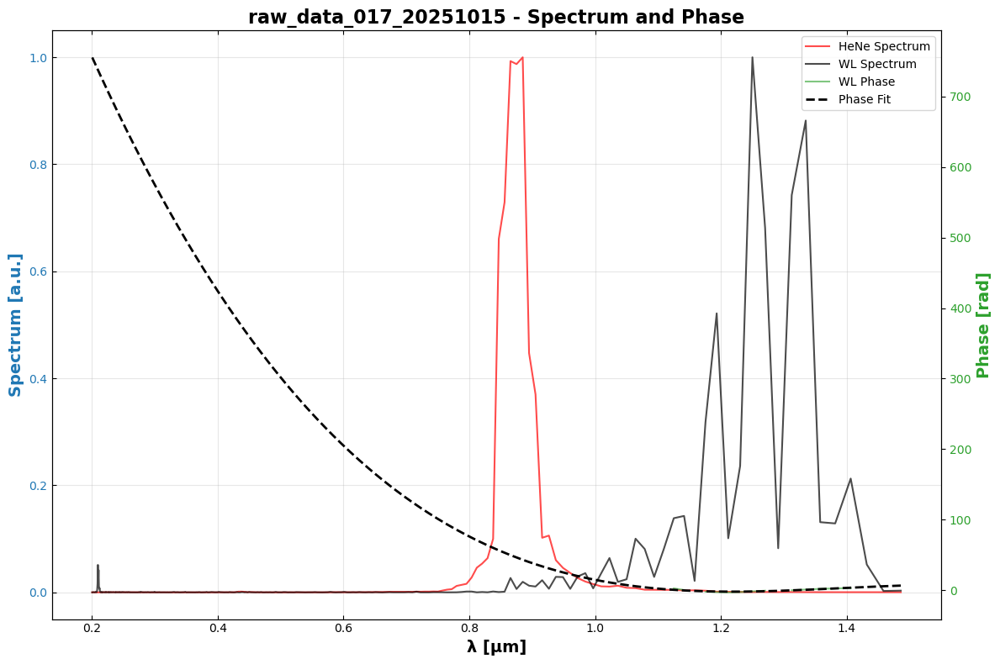


Processing: raw_data_018_20251015
  Zero delay correction: 0.011501
  Polynomial coefficients: [ -929.51898708  3481.54532697 -4329.05832327  1787.04675463]


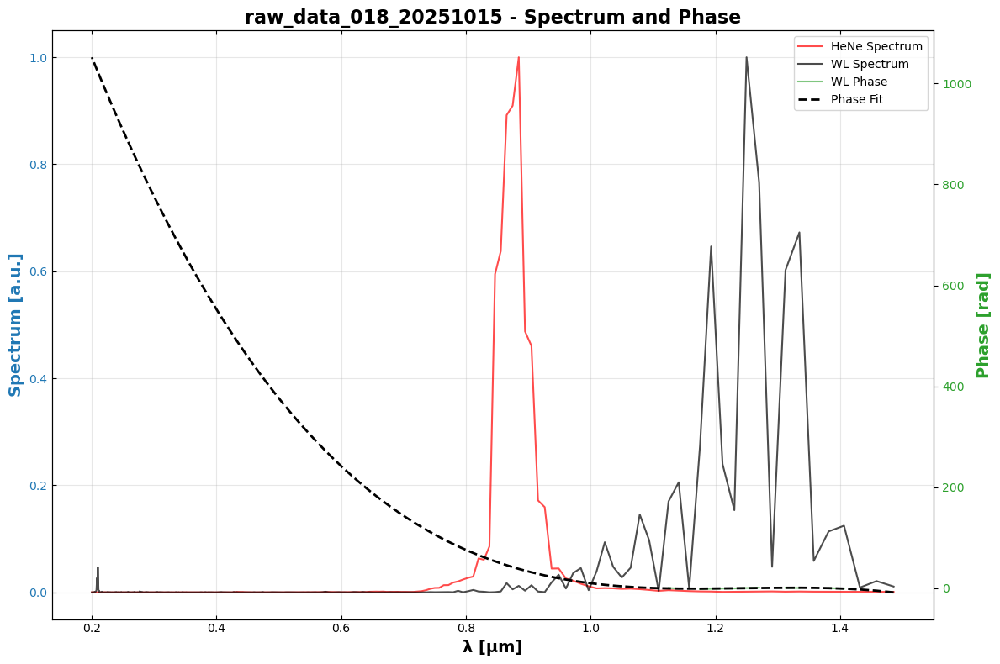


Processing: raw_data_019_20251015
  Zero delay correction: 0.010345
  Polynomial coefficients: [ -228.8220327   1030.87925226 -1489.58876251   695.73360661]


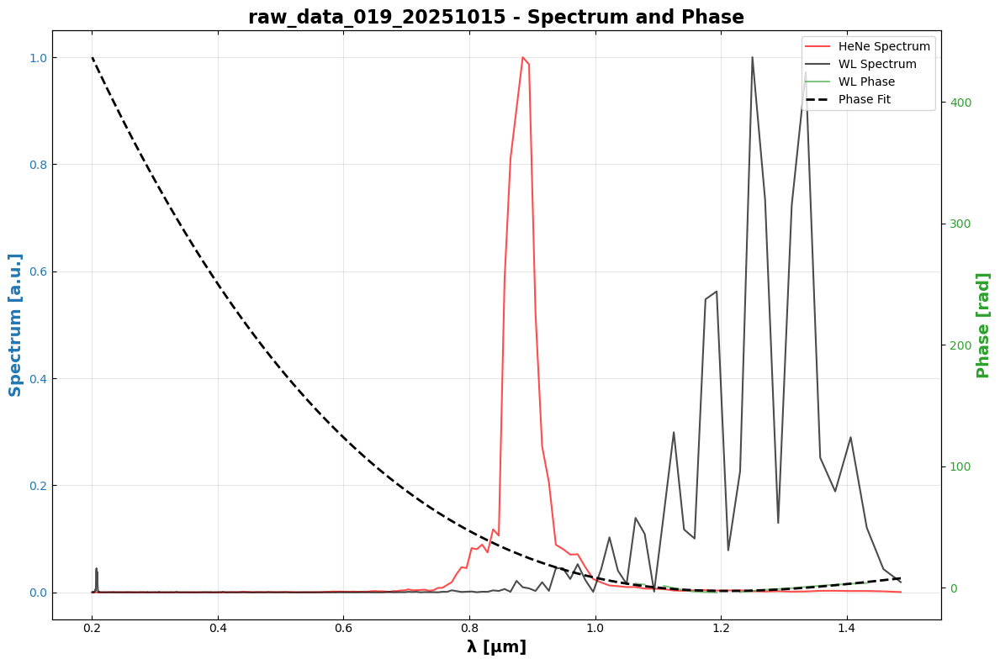


Processing: raw_data_020_20251015
  Zero delay correction: 0.010942
  Polynomial coefficients: [ -651.40197244  2633.22129251 -3524.87731889  1562.49515595]


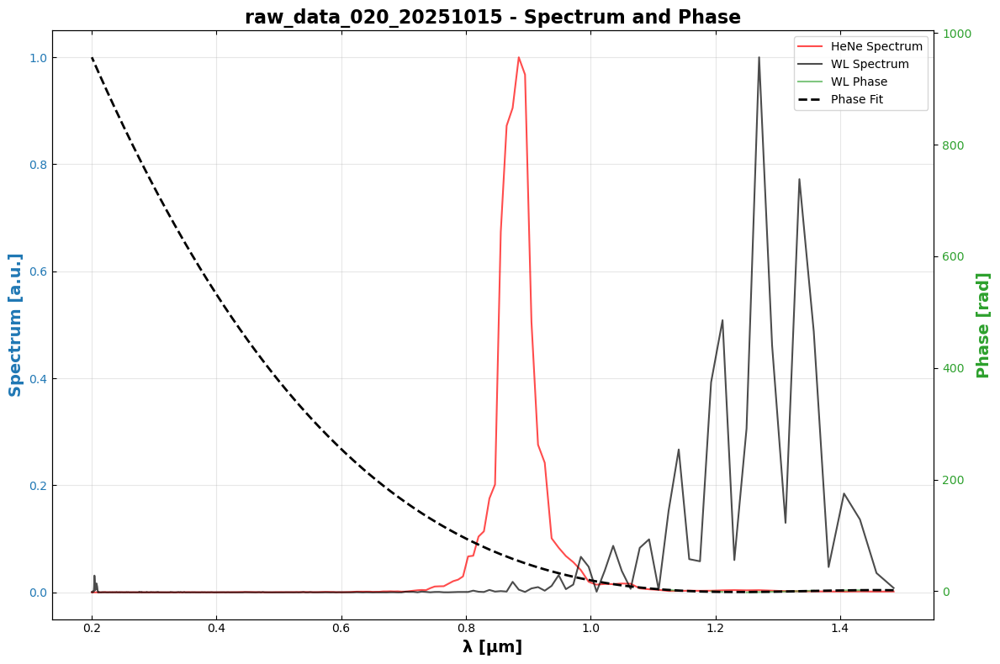


Processing: raw_data_021_20251015
  Zero delay correction: 0.007826
  Polynomial coefficients: [ 23.56273966 -73.1227613   72.03509777 -21.88791519]


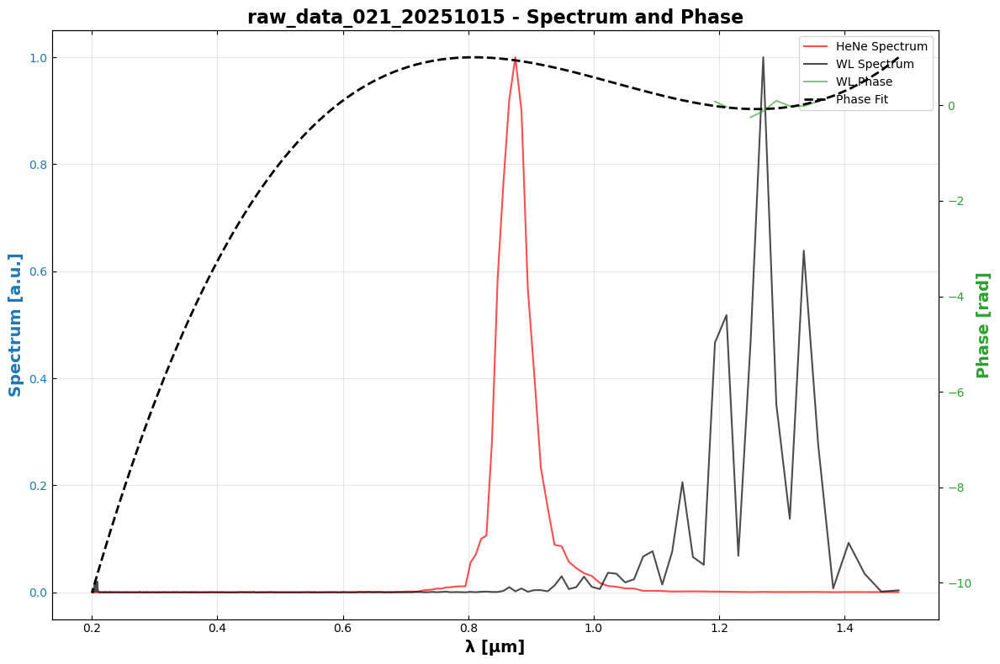


Processing: raw_data_022_20251015
  Zero delay correction: 0.007531
  Polynomial coefficients: [-114.73348221  457.88802936 -604.23128522  263.75896794]


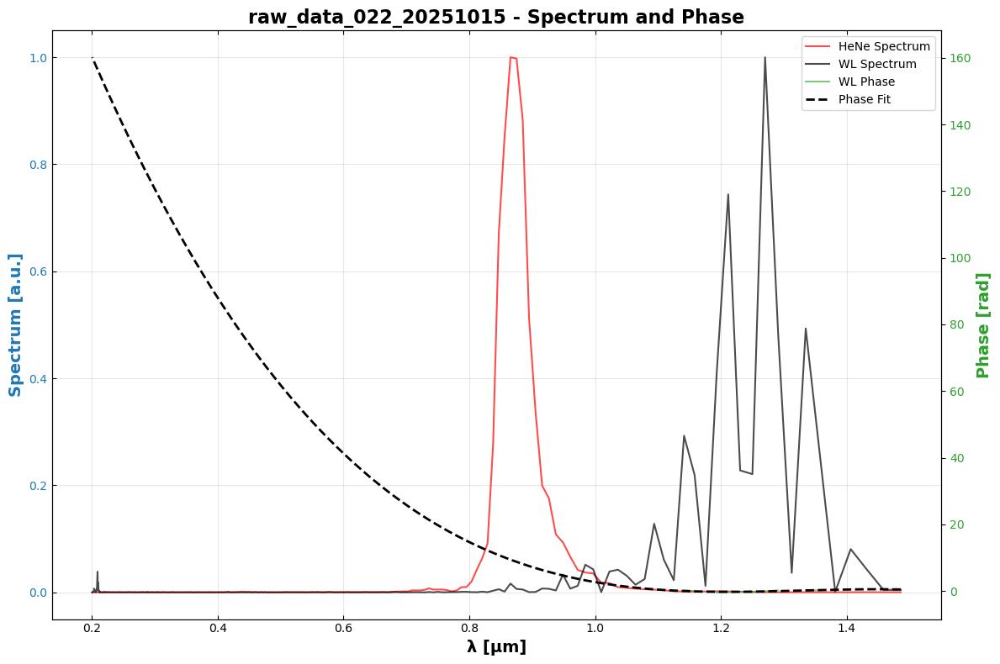


Processing: raw_data_023_20251015
  Zero delay correction: 0.009512
  Polynomial coefficients: [ -352.50933022  1356.4986561  -1732.49924895   734.33337913]


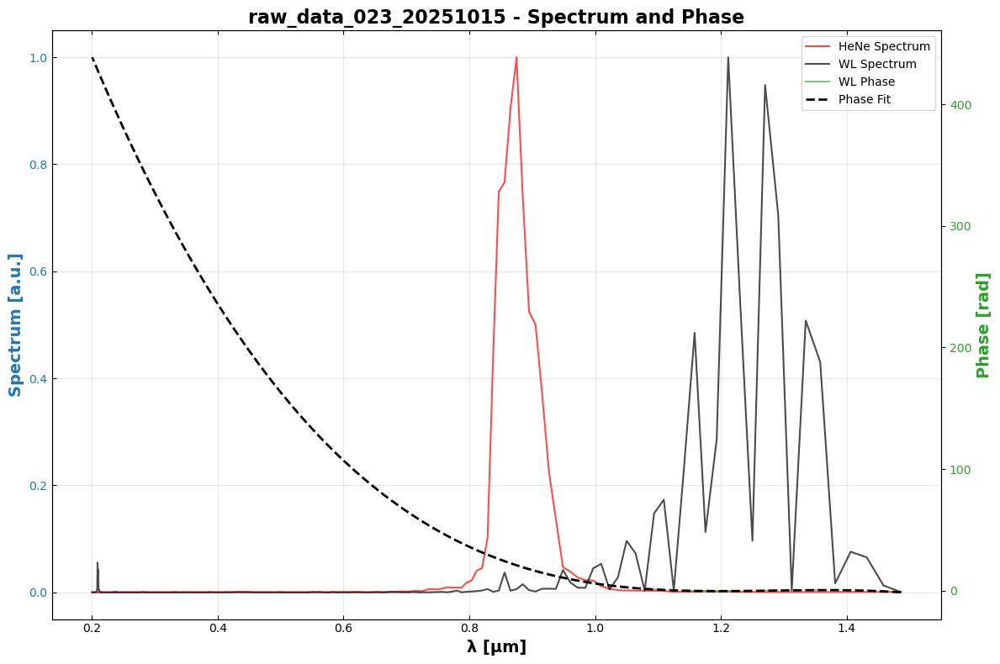


Processing: raw_data_024_20251015
  Zero delay correction: 0.010320
  Polynomial coefficients: [ -62.65828982  194.59210929 -164.87377444   25.19578581]


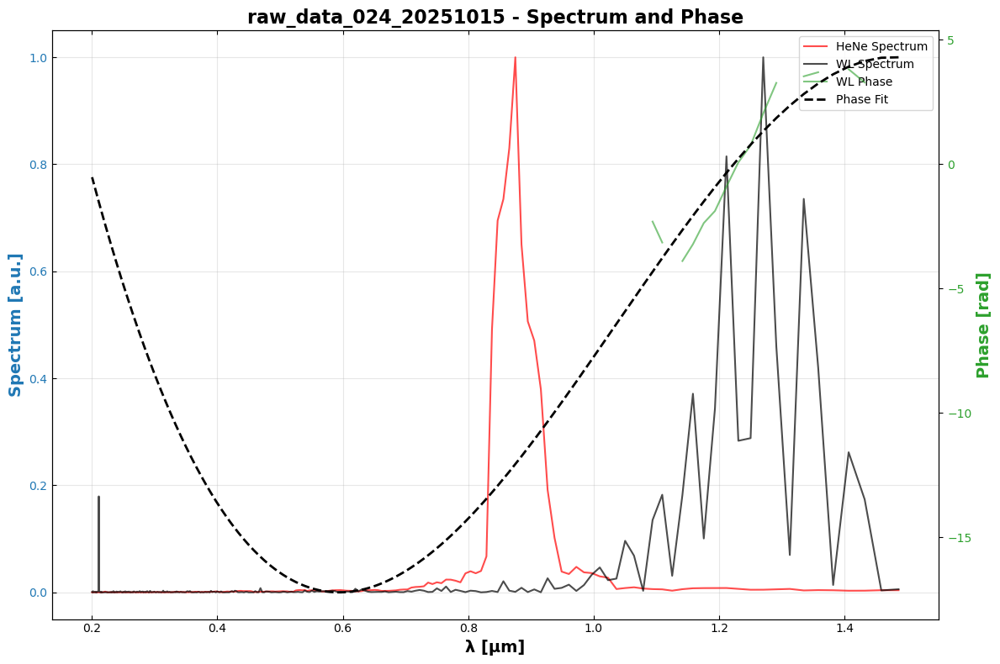


Processing: raw_data_025_20251015
  Zero delay correction: 0.006659
  Polynomial coefficients: [ -766.53234716  2837.05190552 -3481.19058223  1416.3388704 ]


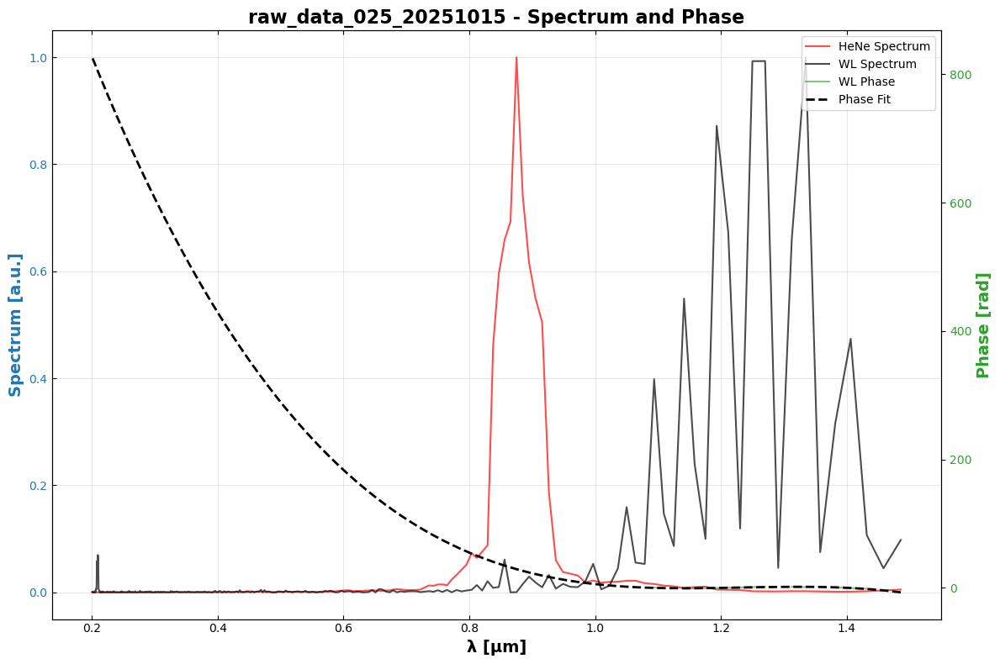



Calculating averaged spectrum and phase...
Averaged 25 datasets
Average phase polynomial coefficients: [ -705.14086762  3588.77348928 -6993.67492582  6377.98599286
 -2587.40223093   318.55990767]


C:\Users\James\AppData\Local\Temp\ipykernel_24768\1009796395.py:99: RuntimeWarning: Mean of empty slice
  phase_avg = np.nanmean(phases_interp, axis=0)


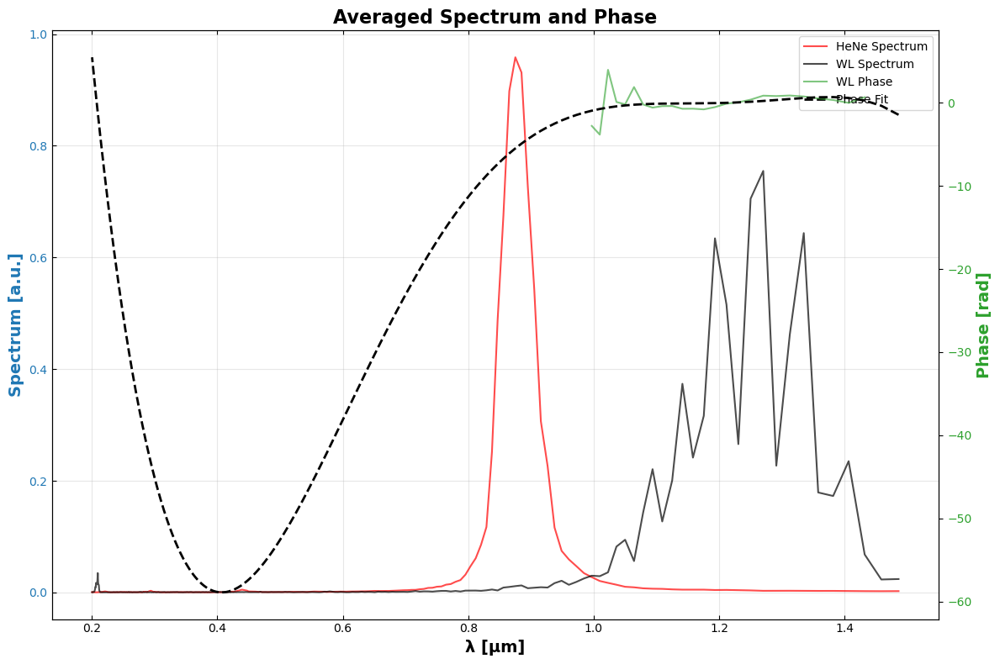

In [20]:
# Main processing script
if __name__ == "__main__":
    # Path to data
    path = '../Team32025/WLI_With_Glass_20251015/'
    data = extract_data(path)
    
    start_idx = 700
    end_idx = 1550
    
    # Storage for averaged results
    all_spectrums = []
    all_phases = []
    all_lambdas = []
    
    print(f"Processing data from index {start_idx} to {end_idx}")
    print(f"Found {len([k for k in data.keys() if k.endswith('_HN_data')])} datasets\n")
    
    # Process each dataset
    for key in sorted(data.keys()):
        if key.endswith('_HN_data'):
            base_key = key[:-8]
            wl_key = f'{base_key}_WL_data'
            meta_key = f'{base_key}_meta'
            
            if wl_key in data:
                print(f"Processing: {base_key}")
                
                # Get xLinear from metadata or create default
                if meta_key in data and 'xLinear' in data[meta_key]:
                    xL = data[meta_key]['xLinear'].flatten()
                else:
                    # Create default linear axis
                    N = len(data[key])
                    xL = np.linspace(0, 1, N)
                
                # Create data array
                dataArray = np.column_stack([data[key], data[wl_key]])
                
                # Process the data
                try:
                    xCen, spectrum, wLPhase, lambda_vals, w_vals = WLI_processData(
                        dataArray, xL, start_idx, end_idx
                    )
                    
                    # Fit phase with 2nd degree polynomial
                    coeffs, phase_fit = fit_phase_polynomial(lambda_vals, wLPhase, degree=3)
                    
                    if coeffs is not None:
                        print(f"  Zero delay correction: {xCen:.6f}")
                        print(f"  Polynomial coefficients: {coeffs}")
                        
                        # Store for averaging
                        all_spectrums.append(spectrum)
                        all_phases.append(wLPhase)
                        all_lambdas.append(lambda_vals)
                        
                        # Plot
                        fig, axes = plot_spectrum_and_phase(
                            lambda_vals, spectrum, wLPhase, phase_fit, 
                            title=f"{base_key} - Spectrum and Phase"
                        )
                        plt.show()
                    else:
                        print(f"  Warning: Could not fit polynomial (insufficient valid phase points)")
                    
                except Exception as e:
                    print(f"  Error processing {base_key}: {str(e)}")
                
                print()
    
    # Calculate and plot averaged results
    if len(all_spectrums) > 0:
        print("\nCalculating averaged spectrum and phase...")
        
        # Ensure all have same wavelength axis (interpolate if needed)
        lambda_common = all_lambdas[0]
        
        spectrums_interp = []
        phases_interp = []
        
        for spec, phase, lam in zip(all_spectrums, all_phases, all_lambdas):
            if not np.array_equal(lam, lambda_common):
                # Interpolate to common wavelength axis
                f_spec_hene = interp1d(lam, spec[:, 0], bounds_error=False, fill_value=np.nan)
                f_spec_wl = interp1d(lam, spec[:, 1], bounds_error=False, fill_value=np.nan)
                f_phase = interp1d(lam, phase, bounds_error=False, fill_value=np.nan)
                
                spec_interp = np.column_stack([f_spec_hene(lambda_common), f_spec_wl(lambda_common)])
                phase_interp = f_phase(lambda_common)
            else:
                spec_interp = spec
                phase_interp = phase
            
            spectrums_interp.append(spec_interp)
            phases_interp.append(phase_interp)
        
        # Calculate mean (ignoring NaNs)
        spectrum_avg = np.nanmean(spectrums_interp, axis=0)
        phase_avg = np.nanmean(phases_interp, axis=0)
        
        # Fit averaged phase
        coeffs_avg, phase_fit_avg = fit_phase_polynomial(lambda_common, phase_avg, degree=5)
        
        print(f"Averaged {len(all_spectrums)} datasets")
        print(f"Average phase polynomial coefficients: {coeffs_avg}")
        
        # Plot averaged results
        fig, axes = plot_spectrum_and_phase(
            lambda_common, spectrum_avg, phase_avg, phase_fit_avg,
            title="Averaged Spectrum and Phase"
        )
        plt.show()

Processing data from index 700 to 1550
Found 25 datasets

Processing: raw_data_001_20251015
  Zero delay correction: 0.018081
  Polynomial coefficients: [  65.36454291 -138.4698886    72.62629043]


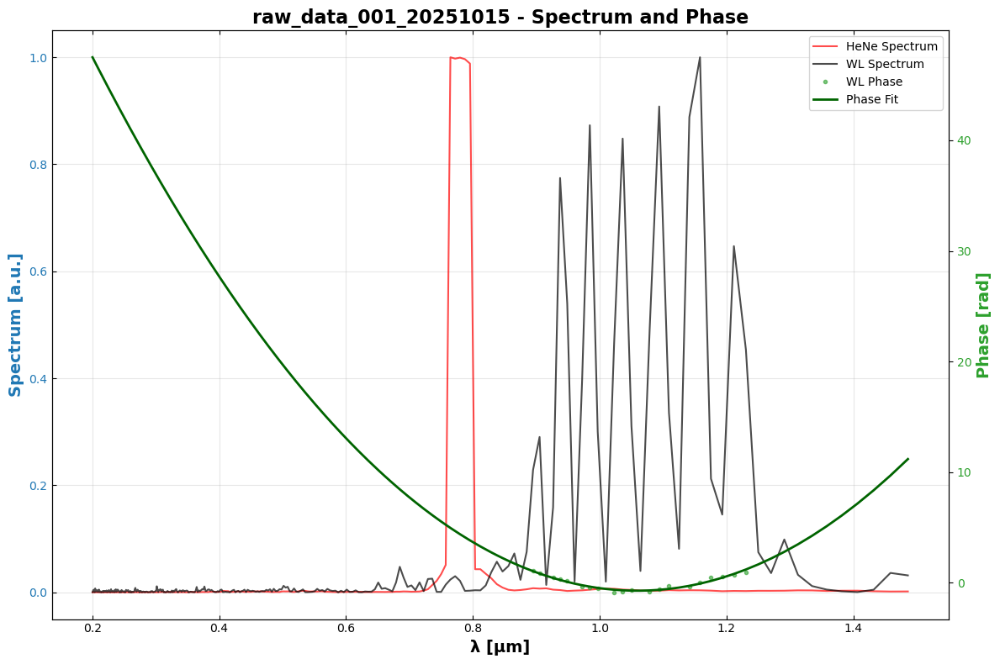


Processing: raw_data_002_20251015
  Zero delay correction: 0.017666
  Polynomial coefficients: [  52.610081   -113.08860194   60.30995622]


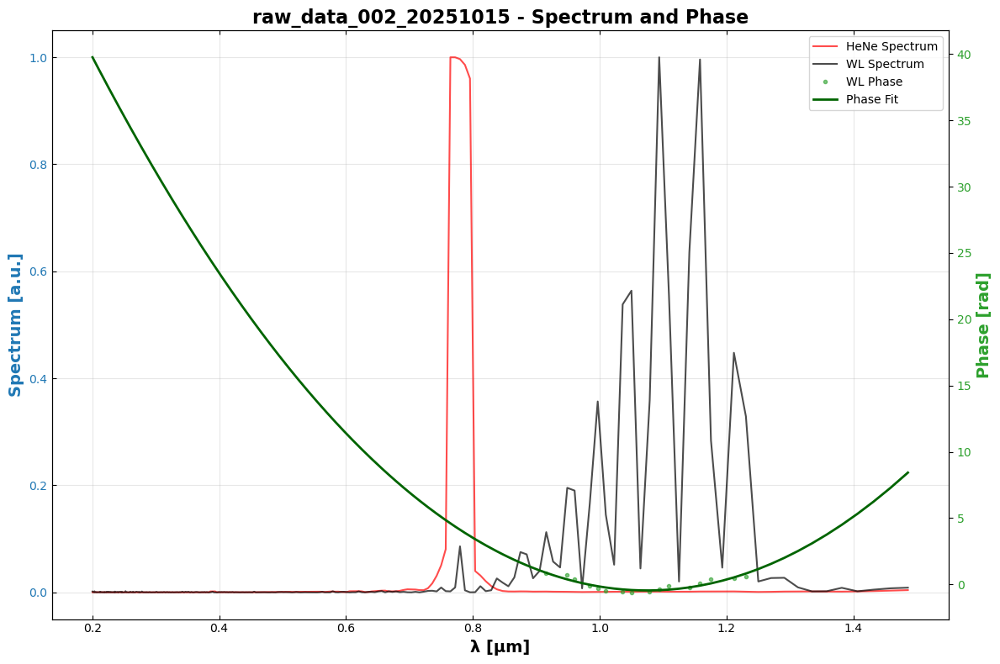


Processing: raw_data_003_20251015
  Zero delay correction: 0.017997
  Polynomial coefficients: [  68.50968676 -146.19529351   77.365129  ]


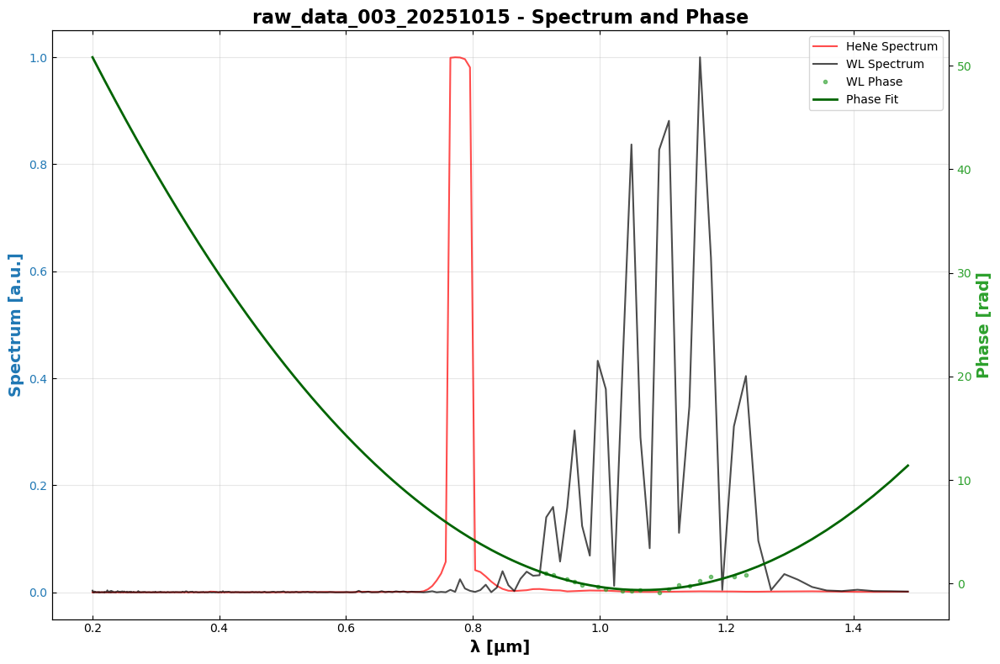


Processing: raw_data_004_20251015
  Zero delay correction: 0.017908
  Polynomial coefficients: [  48.24396854 -103.14519937   54.66989114]


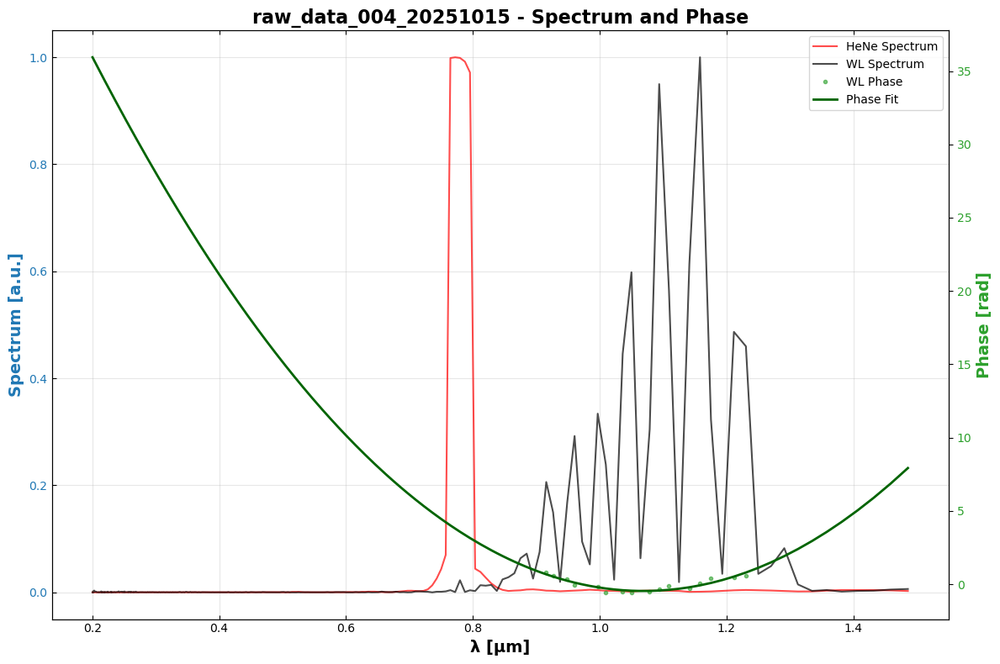


Processing: raw_data_005_20251015
  Zero delay correction: 0.014728
  Polynomial coefficients: [  50.86115201 -109.77623531   58.68481222]


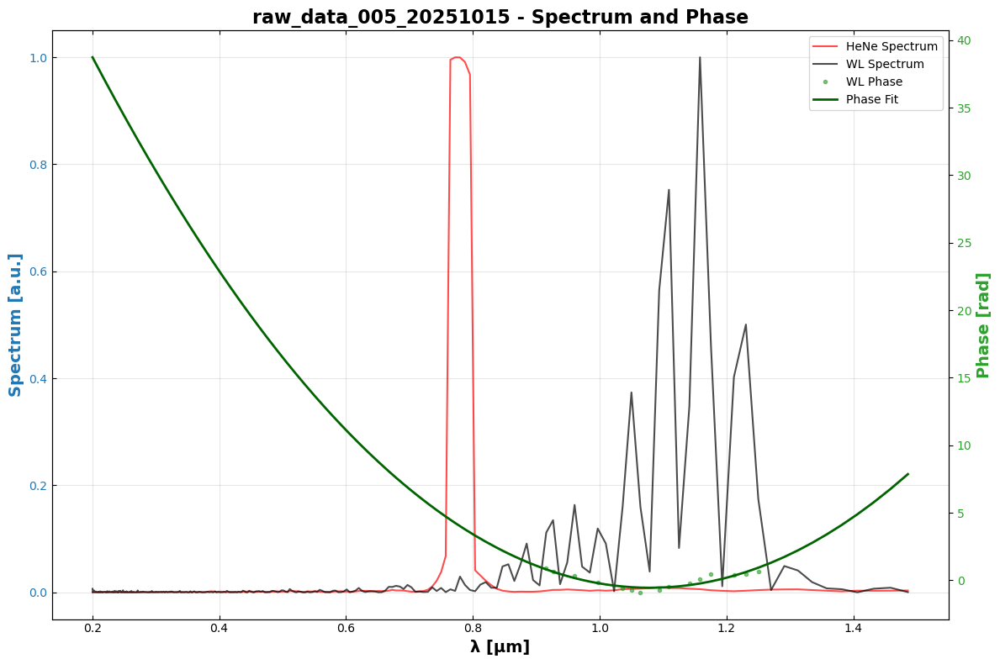


Processing: raw_data_006_20251015
  Zero delay correction: 0.018053
  Polynomial coefficients: [ 112.56812224 -236.4397786   122.92351461]


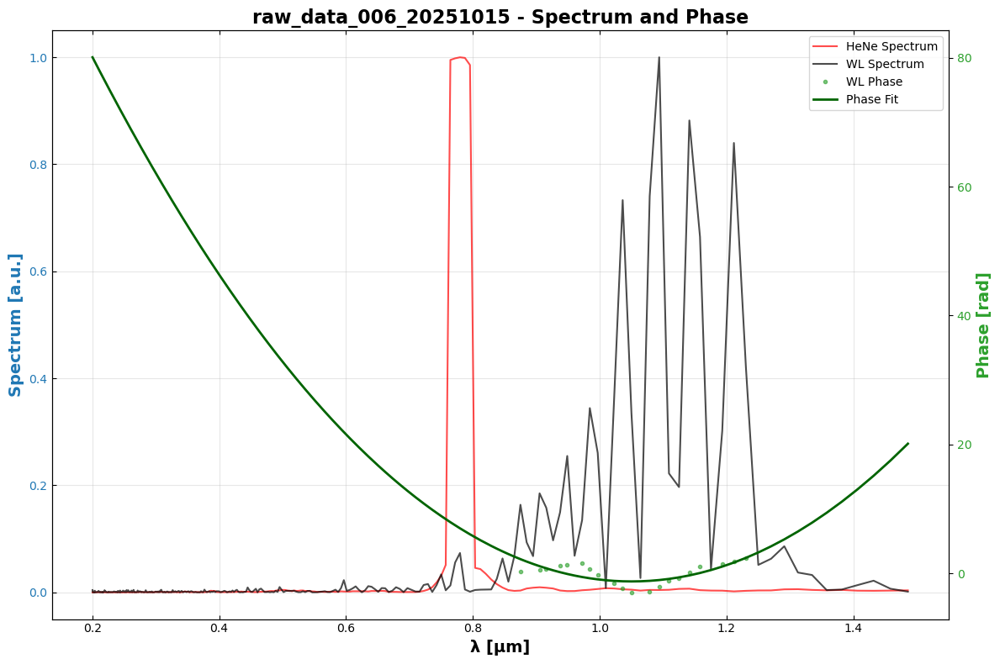


Processing: raw_data_007_20251015
  Zero delay correction: 0.017737
  Polynomial coefficients: [  60.95412481 -129.75137363   68.42926403]


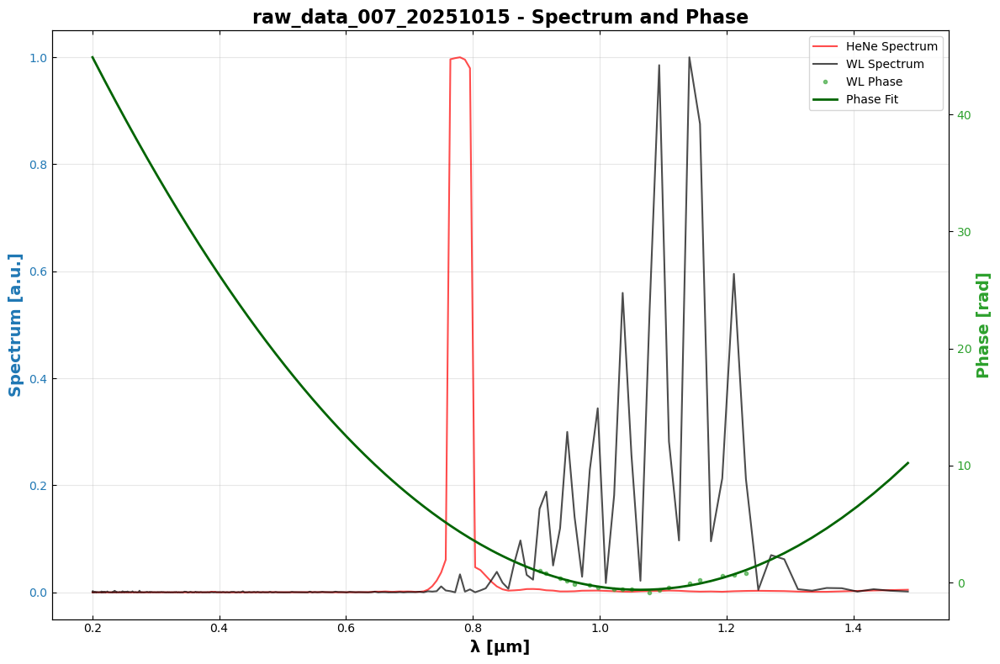


Processing: raw_data_008_20251015
  Zero delay correction: 0.015669
  Polynomial coefficients: [  62.68938664 -134.6122107    71.60053367]


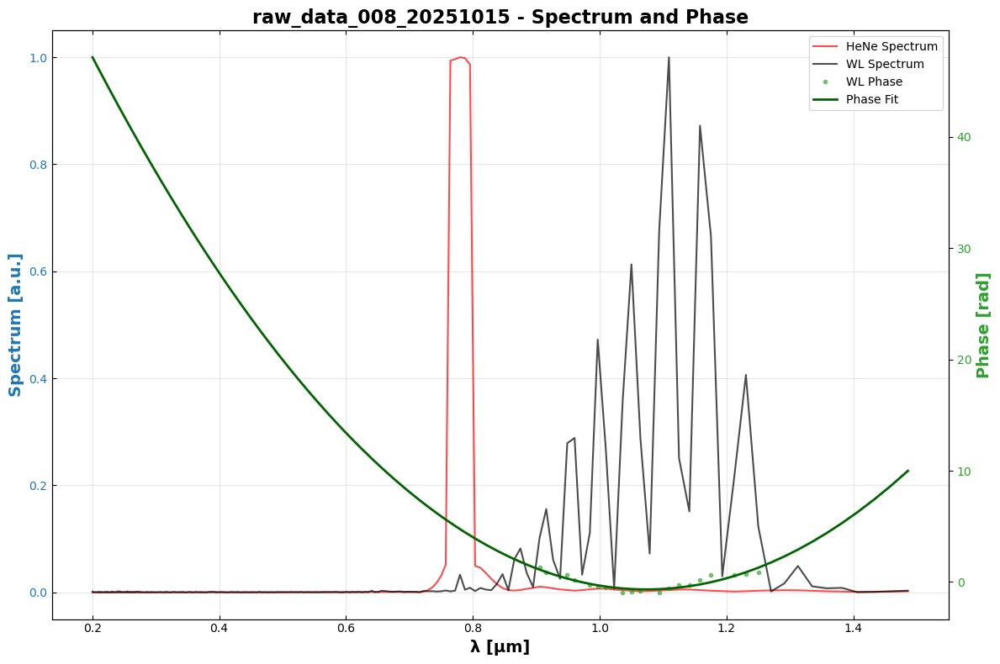


Processing: raw_data_009_20251015
  Zero delay correction: 0.017644
  Polynomial coefficients: [-79.20155253 170.44559149 -90.83530021]


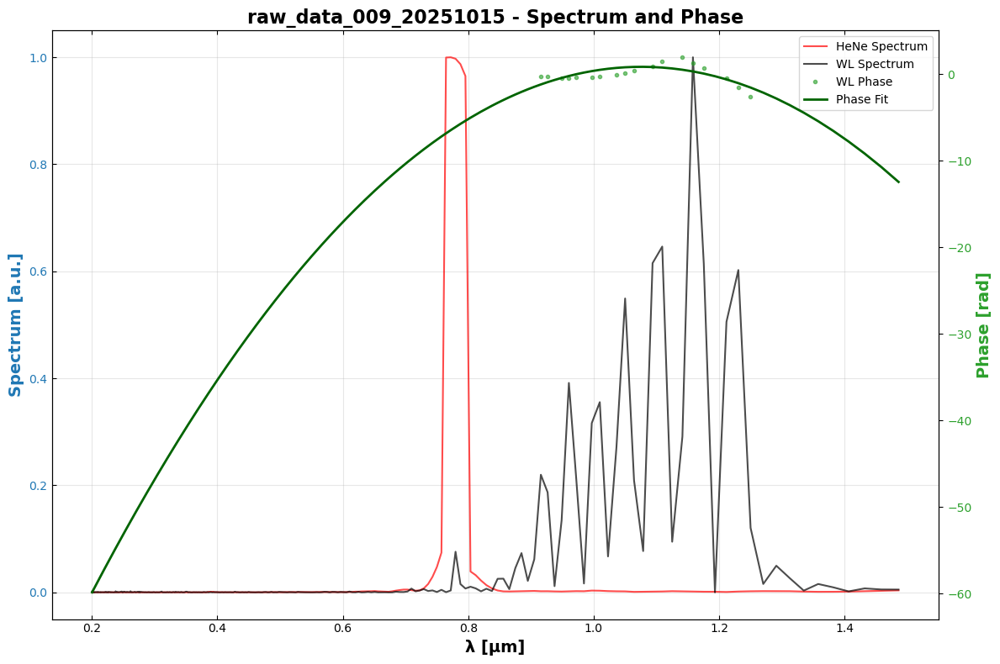


Processing: raw_data_010_20251015
  Zero delay correction: 0.017995
  Polynomial coefficients: [  60.3481207  -129.94511135   69.32234971]


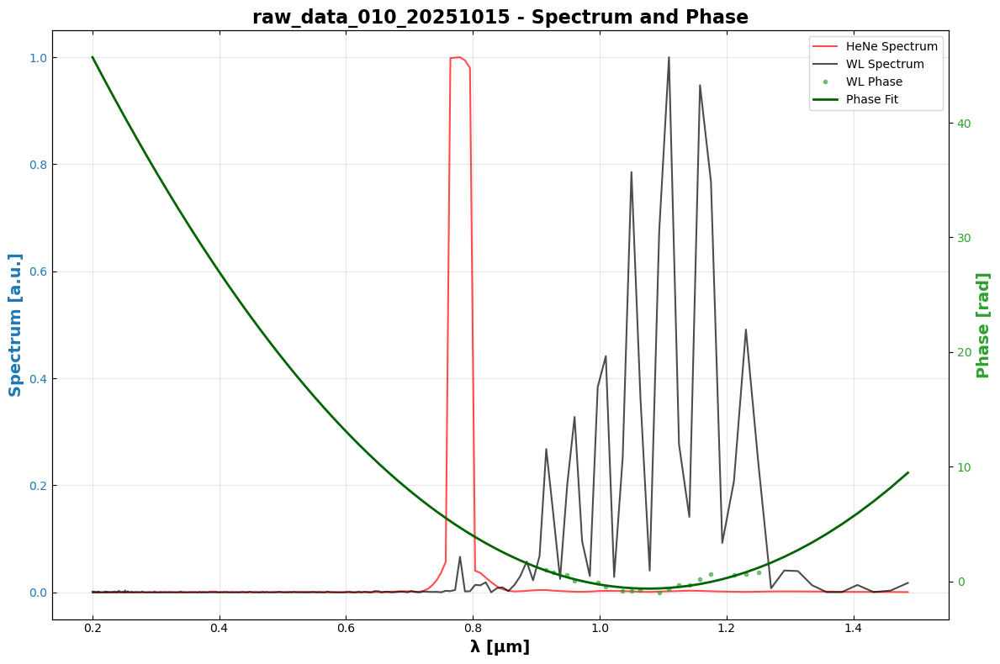


Processing: raw_data_011_20251015
  Zero delay correction: 0.014712
  Polynomial coefficients: [  59.01969546 -127.20298362   67.92840456]


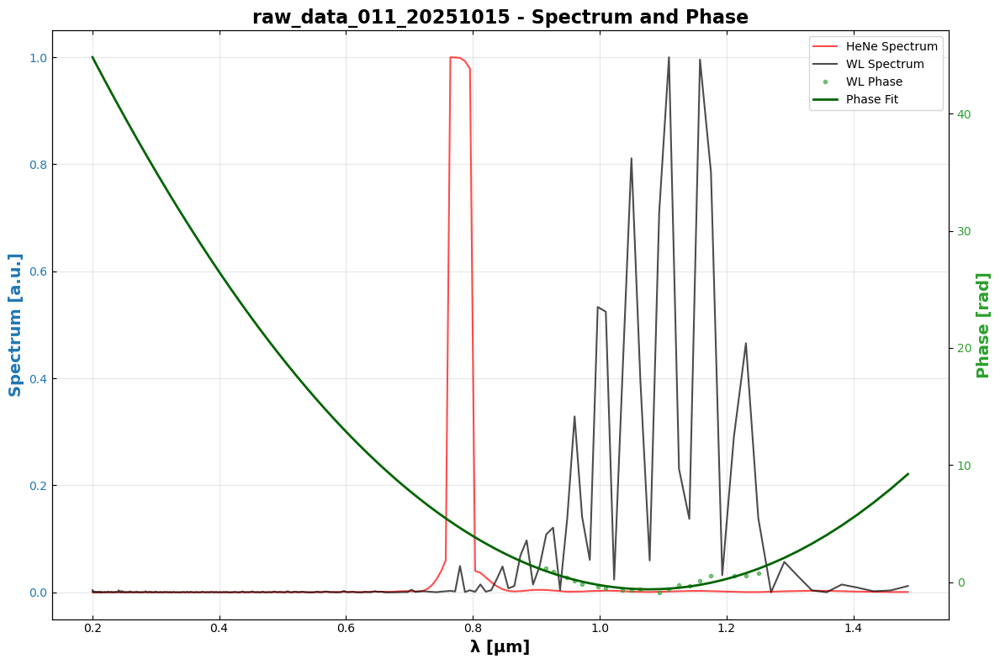


Processing: raw_data_012_20251015
  Zero delay correction: 0.017941
  Polynomial coefficients: [  51.40868775 -110.94642273   59.34254438]


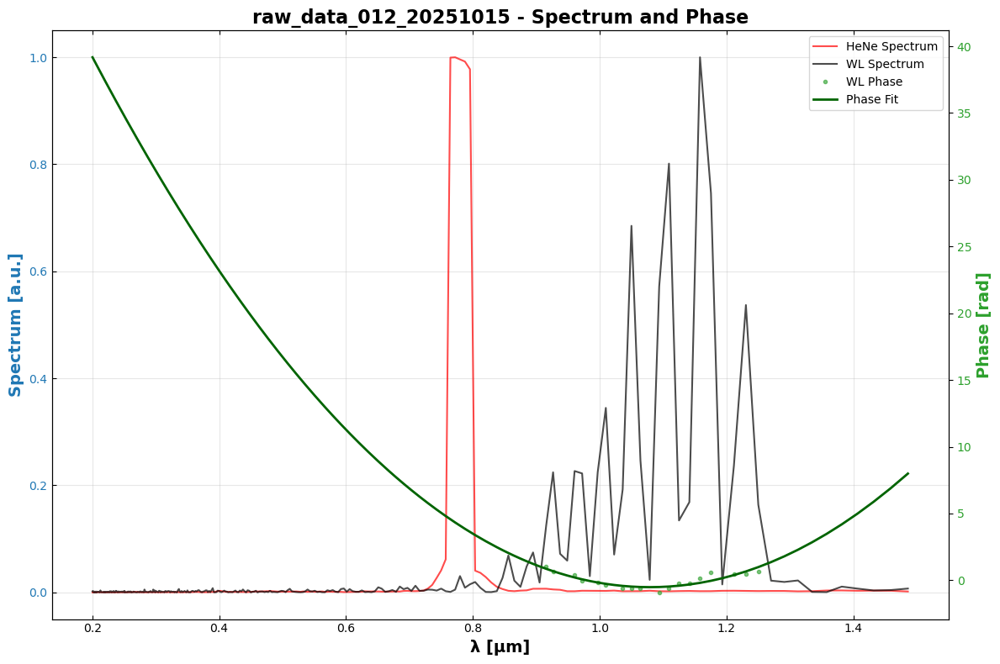


Processing: raw_data_013_20251015
  Zero delay correction: 0.017888
  Polynomial coefficients: [  56.6290281  -122.32018212   65.50124015]


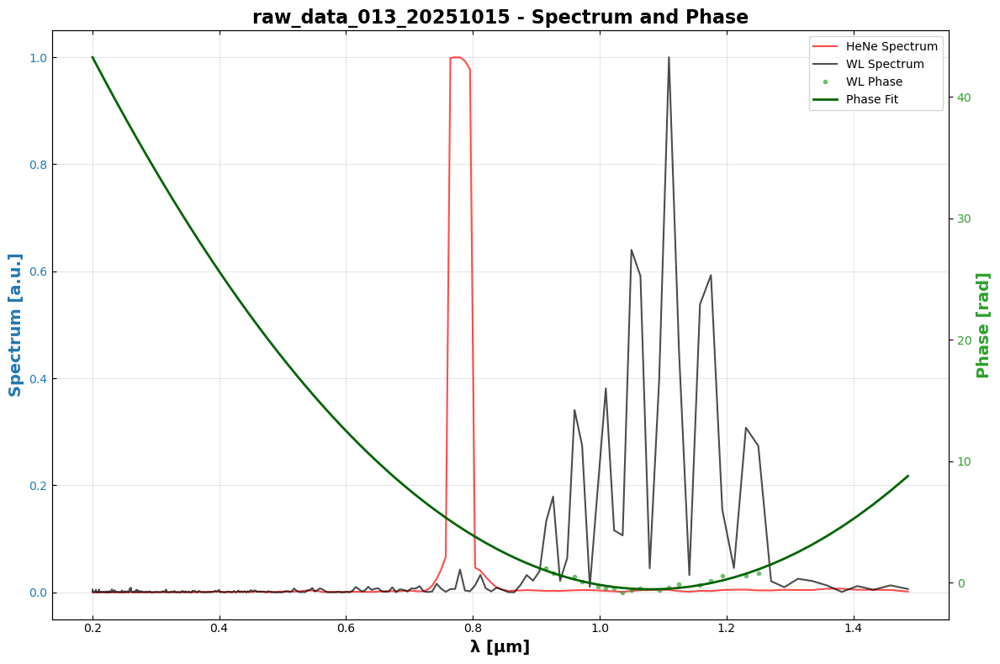


Processing: raw_data_014_20251015
  Zero delay correction: 0.017995
  Polynomial coefficients: [  53.67970791 -115.43811151   61.56889682]


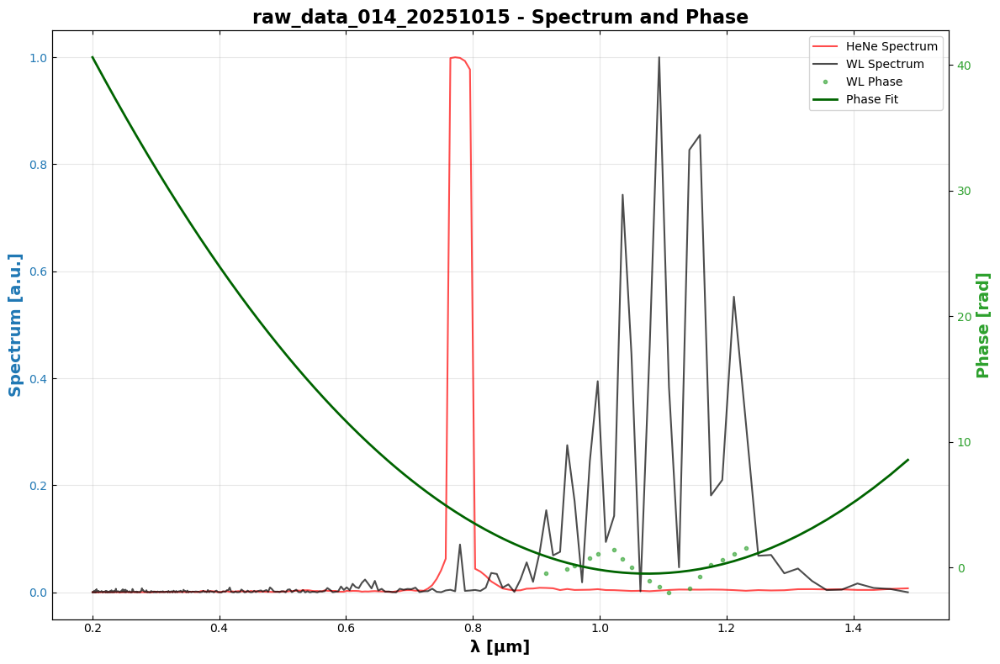


Processing: raw_data_015_20251015
  Zero delay correction: 0.014698
  Polynomial coefficients: [  68.03918728 -144.94333223   76.51245565]


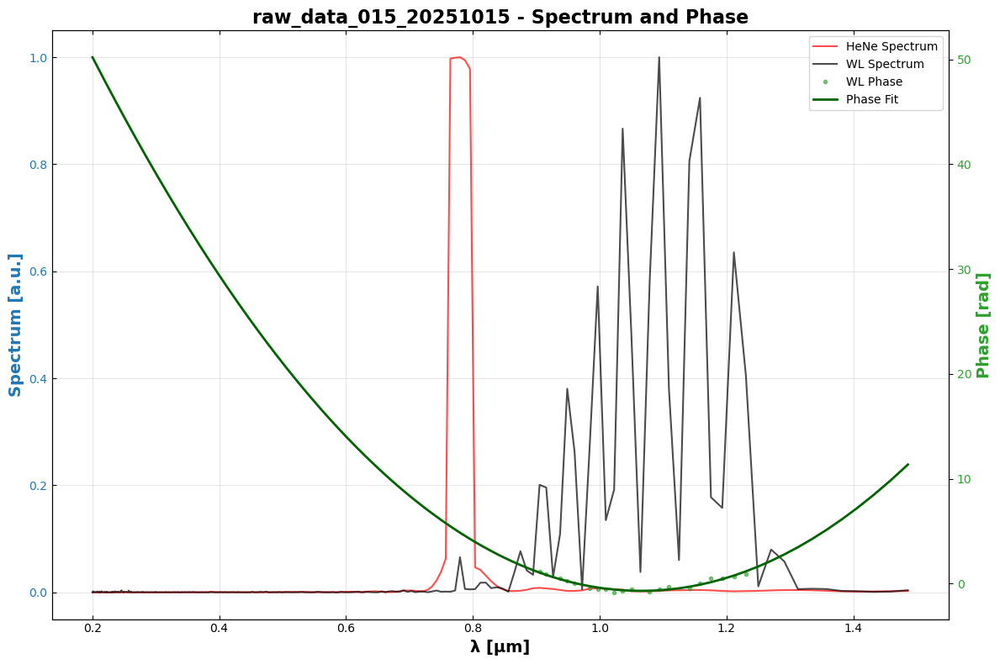


Processing: raw_data_016_20251015
  Zero delay correction: 0.017955
  Polynomial coefficients: [  57.19684182 -123.23287713   65.77995648]


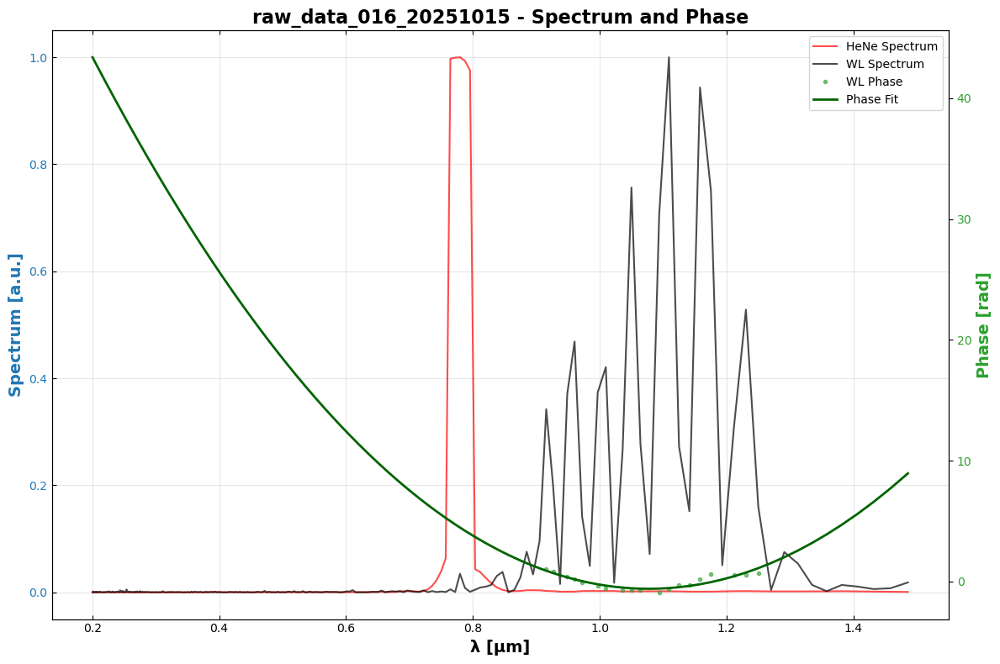


Processing: raw_data_017_20251015
  Zero delay correction: 0.018054
  Polynomial coefficients: [  58.63523508 -125.92298779   67.1187812 ]


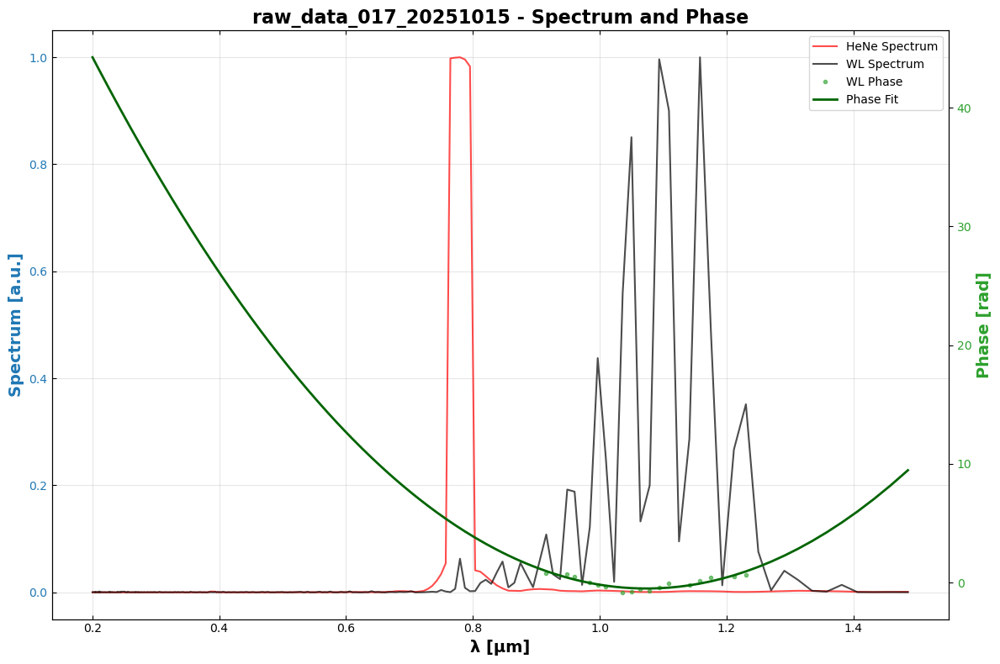


Processing: raw_data_018_20251015
  Zero delay correction: 0.016352
  Polynomial coefficients: [-2.65450405  5.21447002 -2.54729484]


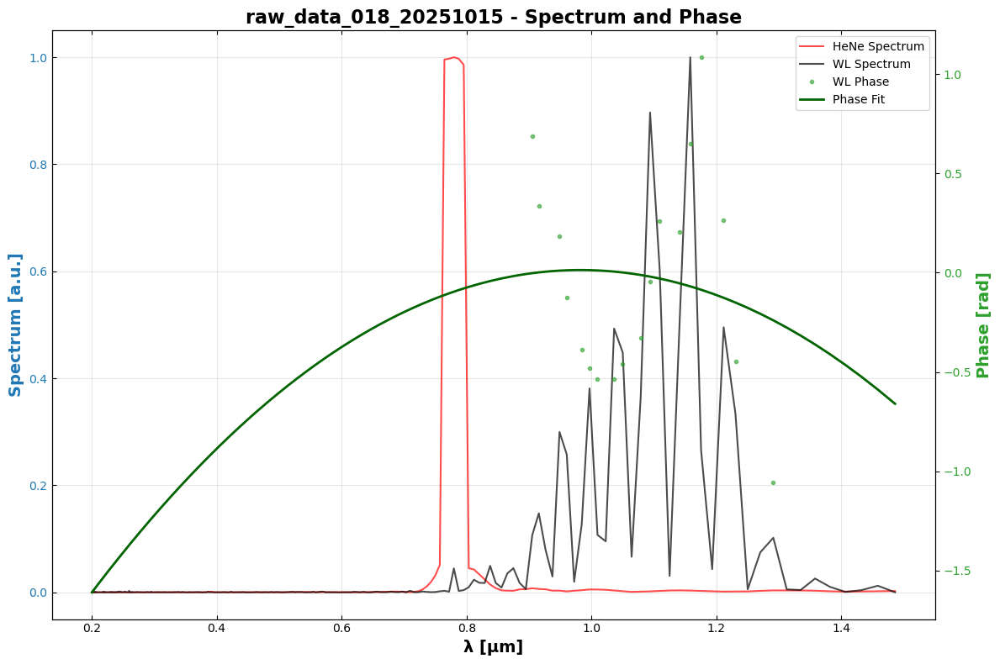


Processing: raw_data_019_20251015
  Zero delay correction: 0.015670
  Polynomial coefficients: [  60.80948791 -129.81755507   68.72184747]


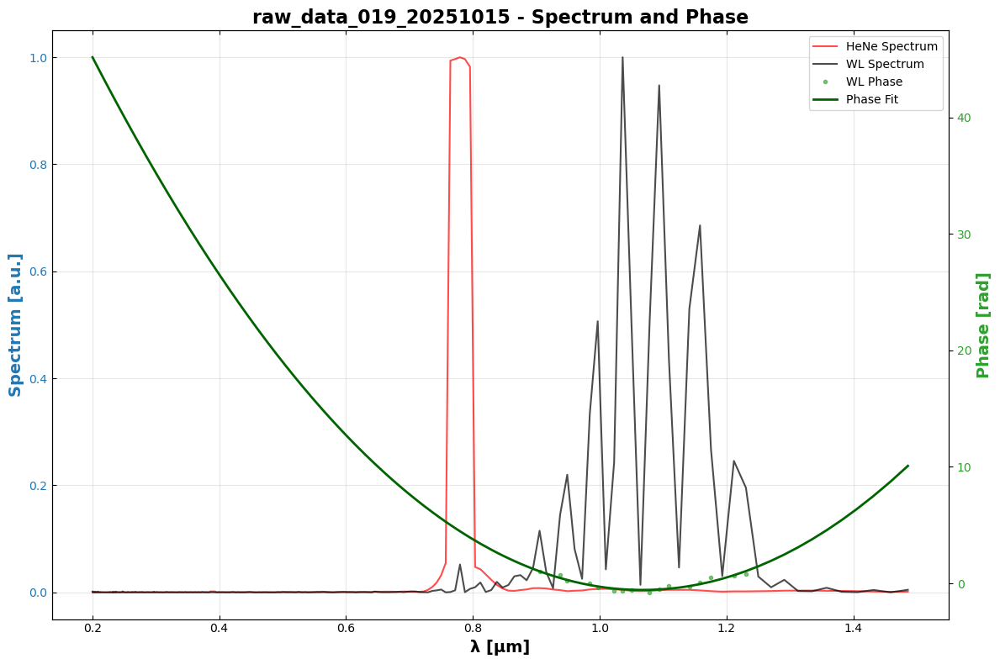


Processing: raw_data_020_20251015
  Zero delay correction: 0.017943
  Polynomial coefficients: [  53.26567377 -115.24970679   61.82284974]


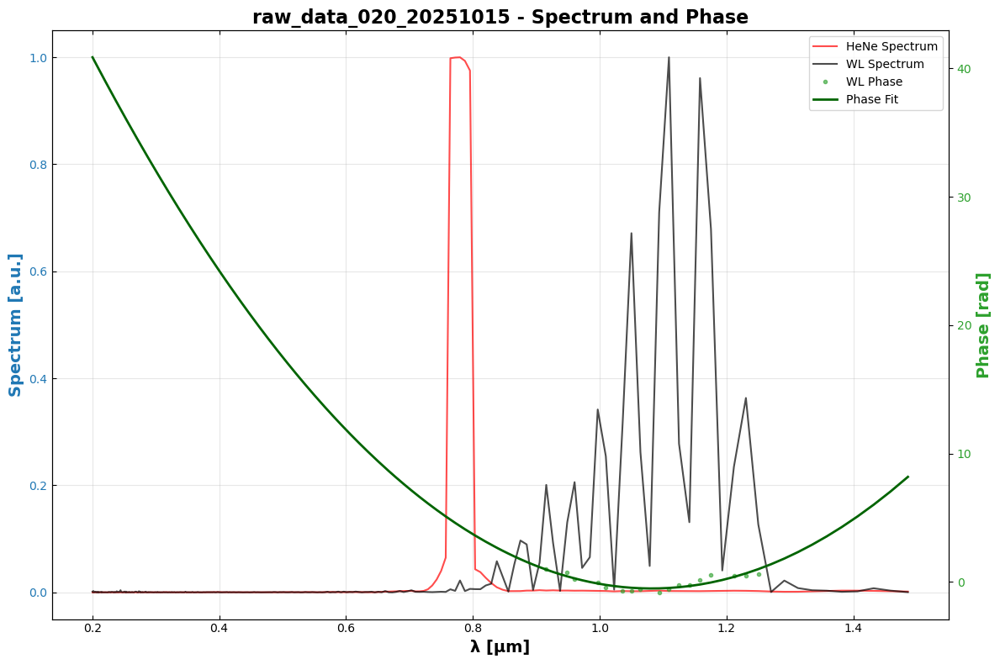


Processing: raw_data_021_20251015
  Zero delay correction: 0.014085
  Polynomial coefficients: [-59.73627975 128.33068884 -68.4365684 ]


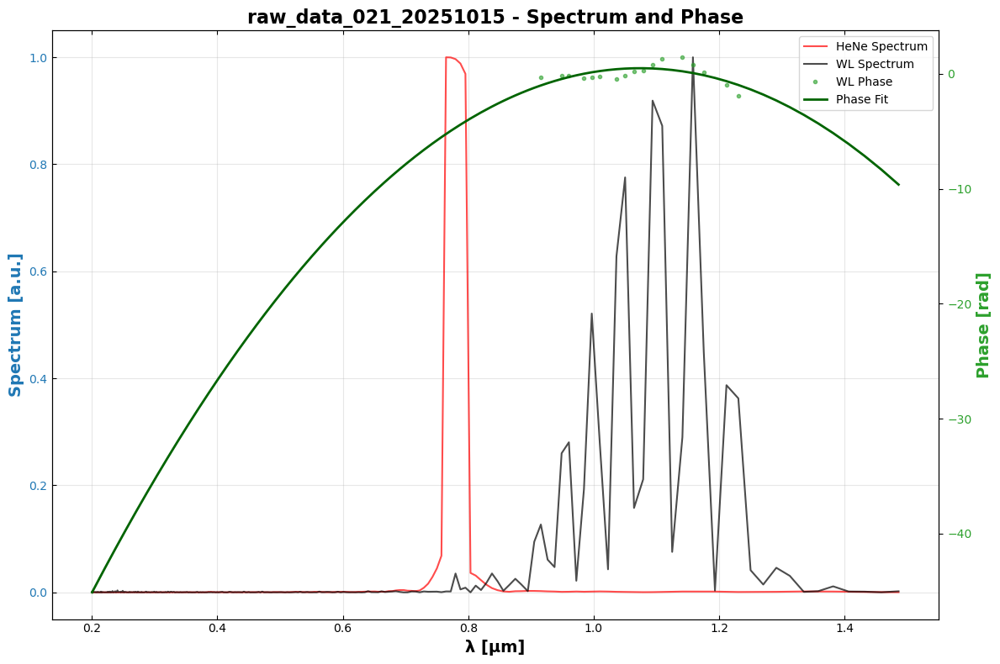


Processing: raw_data_022_20251015
  Zero delay correction: 0.017864
  Polynomial coefficients: [  59.84032534 -127.76034393   67.68063551]


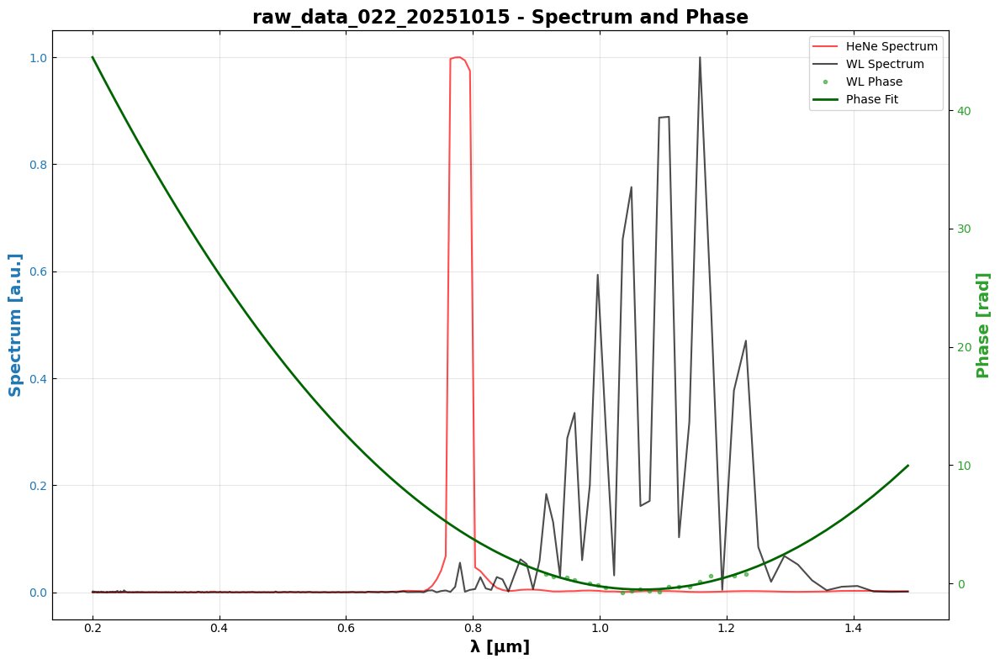


Processing: raw_data_023_20251015
  Zero delay correction: 0.015697
  Polynomial coefficients: [  53.253548   -115.24016986   61.85712415]


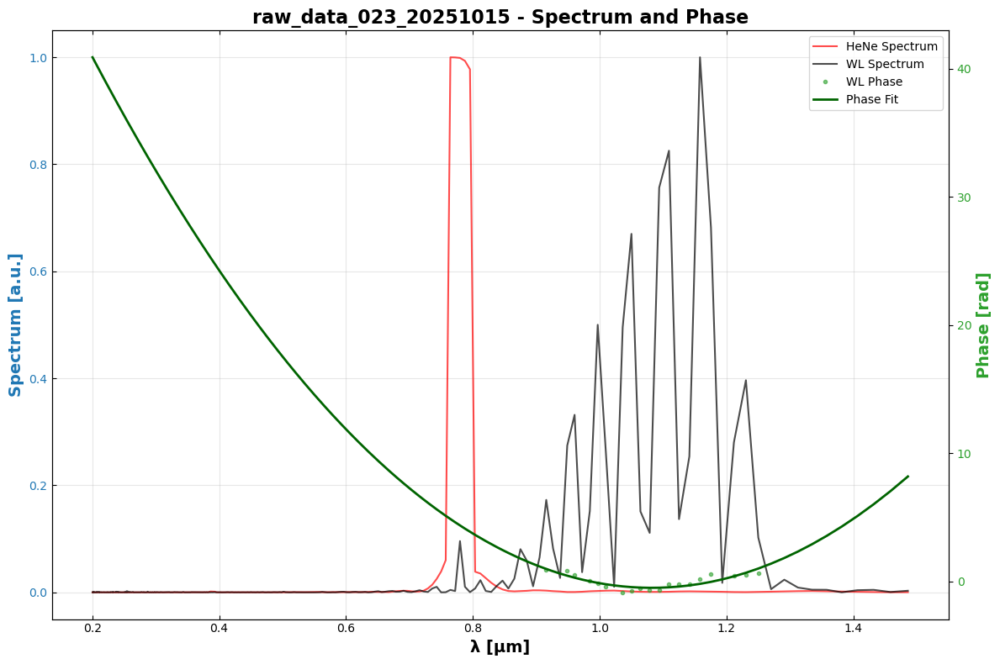


Processing: raw_data_024_20251015
  Zero delay correction: 0.018045
  Polynomial coefficients: [  49.94747051 -108.27094359   58.17176143]


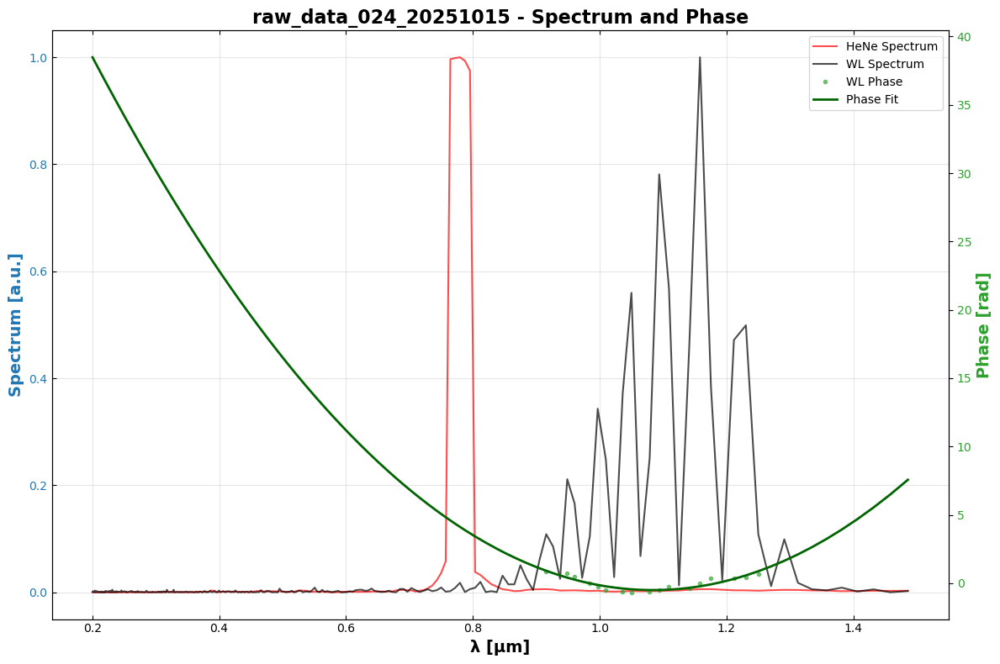


Processing: raw_data_025_20251015
  Zero delay correction: 0.014750
  Polynomial coefficients: [  61.99373489 -134.12832955   72.06504524]


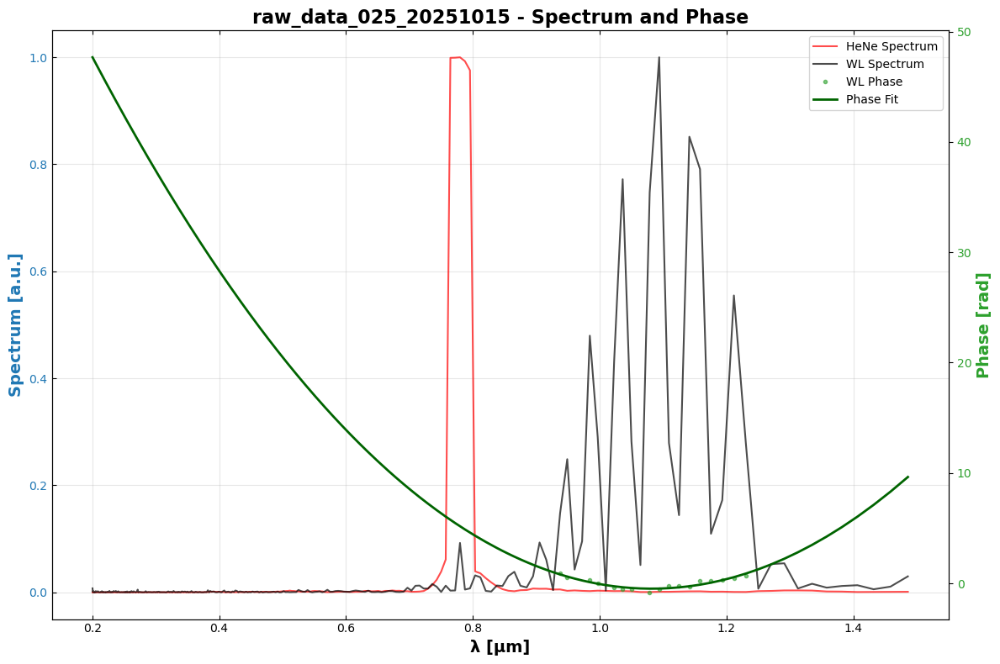



Calculating averaged spectrum and phase...
Averaged 25 datasets
Average phase polynomial coefficients: [ 20.95081519 -46.40591091  25.4173806 ]


C:\Users\James\AppData\Local\Temp\ipykernel_24768\2416039008.py:442: RuntimeWarning: Mean of empty slice
  phase_avg = np.nanmean(phases_interp, axis=0)


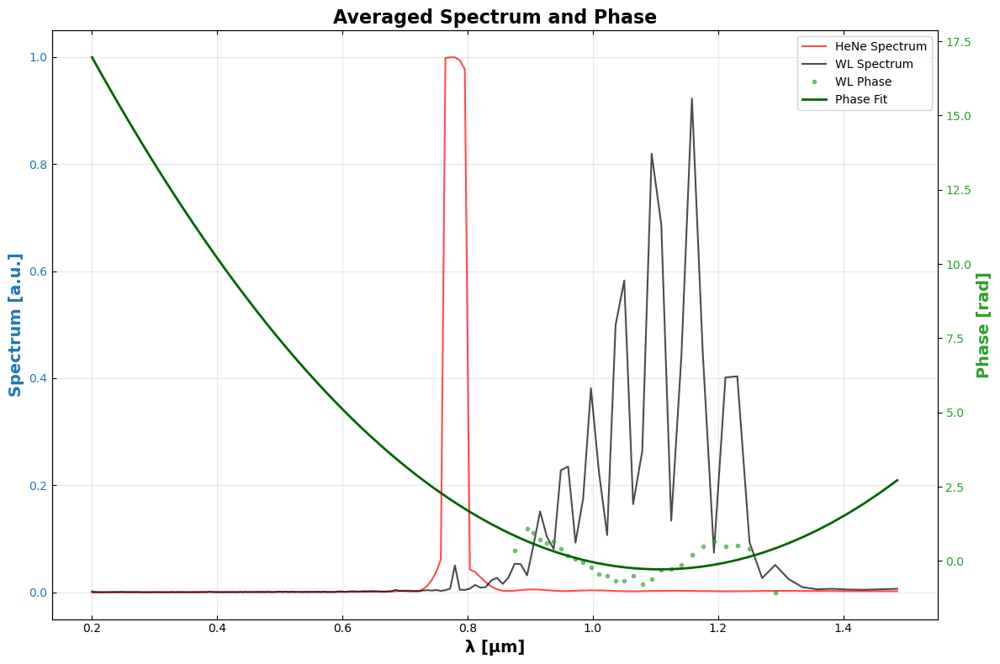

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy.io as sio
from scipy.signal import correlate
from scipy.interpolate import interp1d
from scipy.ndimage import uniform_filter1d
import h5py
from scipy.stats import pearsonr

def extract_data(folder):
    """Extract data from .mat files in the specified folder"""
    data_dict = {}

    for filename in os.listdir(folder):
        if filename.endswith('.mat'):
            file_path = os.path.join(folder, filename)
            file_key = os.path.splitext(filename)[0]

            try:
                # Try loading with scipy.io (for most MATLAB files)
                mat_data = sio.loadmat(file_path)
                clean_data = {k: v for k, v in mat_data.items() if not k.startswith('__')}

            except NotImplementedError:
                # If it's a v7.3 (HDF5-based) file, use h5py
                with h5py.File(file_path, 'r') as f:
                    clean_data = {}
                    def recursively_load(name, obj):
                        if isinstance(obj, h5py.Dataset):
                            clean_data[name] = np.array(obj)
                    f.visititems(recursively_load)

            # Extract 'dataArray' key from file structure
            if 'dataArray' in clean_data:
                arr = clean_data['dataArray']
                if arr.ndim == 2 and arr.shape[1] >= 2:
                    HN_data = arr[:, 0]
                    WL_data = arr[:, 1]

                    data_dict[f'{file_key}_HN_data'] = HN_data
                    data_dict[f'{file_key}_WL_data'] = WL_data

            # Metadata stored here in case it is needed later
            meta = {}
            for key in ['runTime', 'xCenCorrection', 'xLinear', 'xLinearStage']:
                if key in clean_data:
                    meta[key] = clean_data[key]
            data_dict[f'{file_key}_meta'] = meta

    return data_dict


def nfft(a, axis=0):
    """Numpy equivalent of MATLAB's ifftshift(fft(fftshift(a)))"""
    return np.fft.ifftshift(np.fft.fft(np.fft.fftshift(a, axes=axis), axis=axis), axes=axis)


def nifft(a, axis=0):
    """Numpy equivalent of MATLAB's fftshift(ifft(ifftshift(a)))"""
    return np.fft.fftshift(np.fft.ifft(np.fft.ifftshift(a, axes=axis), axis=axis), axes=axis)


def smooth(data, window_size):
    """Simple moving average smoothing"""
    return uniform_filter1d(data, size=window_size, mode='nearest')


def calibrateDelayAxis(v, xL):
    """
    Calibrate the delay axis using knowledge of the HeNe wavelength
    
    Parameters:
    -----------
    v : HeNe voltage/intensity signal
    xL : Linear x-grid (delay axis)
    
    Returns:
    --------
    xNL : Nonlinear corrected x-grid
    """
    # HeNe wavelength in mm
    lambdaHeNe = 0.6328 / 1000  # 632.8 nm converted to mm
    
    # Angular wave number
    k = 2 * np.pi / lambdaHeNe
    
    # Step size
    dx_mm = np.mean(np.diff(xL))
    
    # Number of points in the grid
    N = len(xL)
    
    # Spatial frequency grid
    # Step size in frequency domain
    dfx = 1 / (dx_mm * N)
    
    # Maximum extent
    fxMax = 1 / dx_mm
    
    # Frequency grid
    fx = np.arange(-fxMax/2, fxMax/2, dfx)
    
    # Ensure fx and v have the same length
    if len(fx) > N:
        fx = fx[:N]
    elif len(fx) < N:
        fx = np.linspace(-fxMax/2, fxMax/2, N)
    
    # Take the Fourier transform of the voltage array
    V = np.fft.fftshift(np.fft.fft(np.fft.ifftshift(v)))
    
    # The AC peak is located near
    p0 = 1 / lambdaHeNe
    
    # Find the nearest pixel to this location
    idx = np.argmin(np.abs(p0 - fx))
    idx0 = np.argmin(np.abs(fx))
    
    # Construct a super-Gaussian filter
    # Super-Gaussian order
    n = 22
    
    # Half-width
    sigma = (idx - (N/2 + 1)) * dfx * 0.25
    
    # Filter
    G = np.exp(-((fx - fx[idx])**n) / (sigma**n))
    
    # Multiply by the filter and circshift to the center
    V = np.roll(G * V, -(idx - idx0))
    
    # Inverse Fourier transform
    v2 = np.fft.fftshift(np.fft.ifft(np.fft.ifftshift(V)))
    
    # Extract the phase and unwrap
    phi = np.unwrap(np.angle(v2))
    
    # Solve for the position dependent correction
    delta_x = phi / k
    
    # Add these deltas back to the original x-grid
    xNL = xL + delta_x
    
    return xNL


def removeLinearTerm(w, phase):
    """Remove linear term from phase using polynomial fit"""
    idx = ~np.isnan(phase)
    if np.sum(idx) < 2:
        return phase
    
    nanPhase = phase[idx]
    nanW = w[idx]
    
    # Fit linear polynomial
    p = np.polyfit(nanW, nanPhase, 1)
    phase = phase - p[0] * w - p[1]
    
    return phase


def calculateZeroDelayCorrection(w, dw, xL, wl_data):
    """Calculate zero delay correction from white light data"""
    wlSpec = nfft(wl_data - np.median(wl_data))
    wlSpec[w < 0] = 0
    
    # Calculate center of mass in frequency domain
    wCen = np.sum(w * np.abs(wlSpec)**2) / np.sum(np.abs(wlSpec)**2)
    wCenPx = int(np.round(wCen / dw))
    wlSpec = np.roll(wlSpec, -wCenPx)
    
    wlTemp = smooth(np.abs(nifft(smooth(wlSpec, 5)))**2, 5)
    
    xCen = np.sum(xL * wlTemp) / np.sum(wlTemp)
    
    return xCen, wlSpec


def WLI_processData(dataArray, xL, start_idx=None, end_idx=None):
    """
    Process WLI data to extract spectrum and phase
    
    Parameters:
    -----------
    dataArray : 2D array with columns [HeNe, WhiteLight]
    xL : Linear delay axis
    start_idx, end_idx : Optional indices to slice the data
    
    Returns:
    --------
    xCen : Zero delay correction
    spectrum : Processed spectrum (HeNe and WL)
    wLPhase : Unwrapped white light phase
    lambda_vals : Wavelength array
    """
    
    # Slice data if indices provided
    if start_idx is not None and end_idx is not None:
        dataArray = dataArray[start_idx:end_idx, :]
        xL = xL[start_idx:end_idx]
    
    N = len(dataArray)
    heneData = dataArray[:, 0]
    
    # Calibrate delay axis (simplified - keeping linear for now)
    xNL = calibrateDelayAxis(heneData, xL)
    
    # Interpolate data onto calibrated axis
    f_hene = interp1d(xNL, heneData, kind='cubic', fill_value=0, bounds_error=False)
    f_wl = interp1d(xNL, dataArray[:, 1], kind='cubic', fill_value=0, bounds_error=False)
    dataArray_interp = np.column_stack([f_hene(xL), f_wl(xL)])
    
    # Calculate frequency axis
    c_mm_ps = 0.3  # Speed of light in mm/ps
    t = 2 * xL / c_mm_ps
    dw = 2 * np.pi / (np.max(np.abs(t)) - np.min(np.abs(t)))
    wMax = dw * N
    w = np.arange(-wMax/2, wMax/2, dw)
    
    # Ensure w and data have same length
    if len(w) > N:
        w = w[:N]
    elif len(w) < N:
        # Pad or trim as needed
        w = np.linspace(-wMax/2, wMax/2, N)
    
    # Convert to wavelength (in microns)
    lambda_vals = (2 * np.pi * c_mm_ps / w) * 1000
    idx = (lambda_vals > 0.2) & (lambda_vals < 1.5)
    lambda_vals = lambda_vals[idx]
    
    # Calculate zero delay correction
    xCen = calculateZeroDelayCorrection(w, dw, xL, dataArray_interp[:, 1])[0]
    
    # Process field - subtract baseline
    field = dataArray_interp - dataArray_interp[N//4, :]  # Equivalent to dataArray(256,:) for N=1024
    field[field < -0.03] = 0
    field = nfft(field, axis=0)
    
    # Calculate spectrum
    spectrum = np.abs(field)**2
    
    # Extract white light phase
    wLPhase = np.unwrap(np.angle(field[idx, 1]))
    
    # Smooth and normalize spectrum
    spectrum = spectrum[idx, :]
    spectrum[:, 0] = smooth(spectrum[:, 0], 5)
    spectrum = (spectrum - np.min(spectrum, axis=0)) / (np.max(spectrum, axis=0) - np.min(spectrum, axis=0))
    
    # Mask low-intensity regions in phase
    phaseBlank = spectrum[:, 1] < 0.1
    wLPhase[phaseBlank] = np.nan
    
    # Remove linear term from phase
    wLPhase = removeLinearTerm(w[idx], wLPhase)
    
    # Smooth phase (only non-NaN values)
    valid_idx = ~np.isnan(wLPhase)
    if np.sum(valid_idx) > 5:
        wLPhase[valid_idx] = smooth(wLPhase[valid_idx], 5)
    
    return xCen, spectrum, wLPhase, lambda_vals, w[idx]


def fit_phase_polynomial(lambda_vals, phase, degree=2):
    """
    Fit phase with polynomial of specified degree
    
    Parameters:
    -----------
    lambda_vals : Wavelength array
    phase : Phase array (may contain NaNs)
    degree : Polynomial degree (default=2 for quadratic)
    
    Returns:
    --------
    coeffs : Polynomial coefficients
    phase_fit : Fitted phase values
    """
    # Remove NaN values for fitting
    valid_idx = ~np.isnan(phase)
    
    if np.sum(valid_idx) < degree + 1:
        return None, None
    
    # Fit polynomial
    coeffs = np.polyfit(lambda_vals[valid_idx], phase[valid_idx], degree)
    
    # Evaluate polynomial
    phase_fit = np.polyval(coeffs, lambda_vals)
    
    return coeffs, phase_fit


def plot_spectrum_and_phase(lambda_vals, spectrum, phase, phase_fit=None, title="WLI Data"):
    """
    Plot spectrum and phase on dual y-axis
    
    Parameters:
    -----------
    lambda_vals : Wavelength array in microns
    spectrum : Spectrum array (2 columns: HeNe, WL)
    phase : Phase array
    phase_fit : Optional fitted phase
    title : Plot title
    """
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Plot spectrum on left axis
    color1 = 'tab:blue'
    ax1.set_xlabel('λ [μm]', fontweight='bold', fontsize=14)
    ax1.set_ylabel('Spectrum [a.u.]', fontweight='bold', fontsize=14, color=color1)
    ax1.plot(lambda_vals, spectrum[:, 0], label='HeNe Spectrum', color='red', alpha=0.7)
    ax1.plot(lambda_vals, spectrum[:, 1], label='WL Spectrum', color='black', alpha=0.7)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.tick_params(axis='both', which='both', direction='in', top=True, right=True)
    ax1.grid(True, alpha=0.3)
    
    # Plot phase on right axis
    ax2 = ax1.twinx()
    color2 = 'tab:green'
    ax2.set_ylabel('Phase [rad]', fontweight='bold', fontsize=14, color=color2)
    ax2.plot(lambda_vals, phase, 'o', label='WL Phase', color=color2, markersize=3, alpha=0.6)
    
    if phase_fit is not None:
        ax2.plot(lambda_vals, phase_fit, '-', label='Phase Fit', color='darkgreen', linewidth=2)
    
    ax2.tick_params(axis='y', labelcolor=color2)
    
    # Combine legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=10)
    
    plt.title(title, fontweight='bold', fontsize=16)
    plt.tight_layout()
    
    return fig, (ax1, ax2)


# Main processing script
if __name__ == "__main__":
    # Path to data
    path = '../Team32025/WLI_With_Glass_20251015/'
    data = extract_data(path)
    
    start_idx = 700
    end_idx = 1550
    
    # Storage for averaged results
    all_spectrums = []
    all_phases = []
    all_lambdas = []
    
    print(f"Processing data from index {start_idx} to {end_idx}")
    print(f"Found {len([k for k in data.keys() if k.endswith('_HN_data')])} datasets\n")
    
    # Process each dataset
    for key in sorted(data.keys()):
        if key.endswith('_HN_data'):
            base_key = key[:-8]
            wl_key = f'{base_key}_WL_data'
            meta_key = f'{base_key}_meta'
            
            if wl_key in data:
                print(f"Processing: {base_key}")
                
                # Get xLinear from metadata or create default
                if meta_key in data and 'xLinear' in data[meta_key]:
                    xL = data[meta_key]['xLinear'].flatten()
                else:
                    # Create default linear axis
                    N = len(data[key])
                    xL = np.linspace(0, 1, N)
                
                # Create data array
                dataArray = np.column_stack([data[key], data[wl_key]])
                
                # Process the data
                try:
                    xCen, spectrum, wLPhase, lambda_vals, w_vals = WLI_processData(
                        dataArray, xL, start_idx, end_idx
                    )
                    
                    # Fit phase with 2nd degree polynomial
                    coeffs, phase_fit = fit_phase_polynomial(lambda_vals, wLPhase, degree=2)
                    
                    if coeffs is not None:
                        print(f"  Zero delay correction: {xCen:.6f}")
                        print(f"  Polynomial coefficients: {coeffs}")
                        
                        # Store for averaging
                        all_spectrums.append(spectrum)
                        all_phases.append(wLPhase)
                        all_lambdas.append(lambda_vals)
                        
                        # Plot
                        fig, axes = plot_spectrum_and_phase(
                            lambda_vals, spectrum, wLPhase, phase_fit, 
                            title=f"{base_key} - Spectrum and Phase"
                        )
                        plt.show()
                    else:
                        print(f"  Warning: Could not fit polynomial (insufficient valid phase points)")
                    
                except Exception as e:
                    print(f"  Error processing {base_key}: {str(e)}")
                
                print()
    
    # Calculate and plot averaged results
    if len(all_spectrums) > 0:
        print("\nCalculating averaged spectrum and phase...")
        
        # Ensure all have same wavelength axis (interpolate if needed)
        lambda_common = all_lambdas[0]
        
        spectrums_interp = []
        phases_interp = []
        
        for spec, phase, lam in zip(all_spectrums, all_phases, all_lambdas):
            if not np.array_equal(lam, lambda_common):
                # Interpolate to common wavelength axis
                f_spec_hene = interp1d(lam, spec[:, 0], bounds_error=False, fill_value=np.nan)
                f_spec_wl = interp1d(lam, spec[:, 1], bounds_error=False, fill_value=np.nan)
                f_phase = interp1d(lam, phase, bounds_error=False, fill_value=np.nan)
                
                spec_interp = np.column_stack([f_spec_hene(lambda_common), f_spec_wl(lambda_common)])
                phase_interp = f_phase(lambda_common)
            else:
                spec_interp = spec
                phase_interp = phase
            
            spectrums_interp.append(spec_interp)
            phases_interp.append(phase_interp)
        
        # Calculate mean (ignoring NaNs)
        spectrum_avg = np.nanmean(spectrums_interp, axis=0)
        phase_avg = np.nanmean(phases_interp, axis=0)
        
        # Fit averaged phase
        coeffs_avg, phase_fit_avg = fit_phase_polynomial(lambda_common, phase_avg, degree=2)
        
        print(f"Averaged {len(all_spectrums)} datasets")
        print(f"Average phase polynomial coefficients: {coeffs_avg}")
        
        # Plot averaged results
        fig, axes = plot_spectrum_and_phase(
            lambda_common, spectrum_avg, phase_avg, phase_fit_avg,
            title="Averaged Spectrum and Phase"
        )
        plt.show()

Processing data from index 700 to 1550
Found 25 datasets

Processing: raw_data_001_20251015
  Zero delay correction: 0.018081
  Polynomial coefficients: [  65.36454291 -138.4698886    72.62629043]


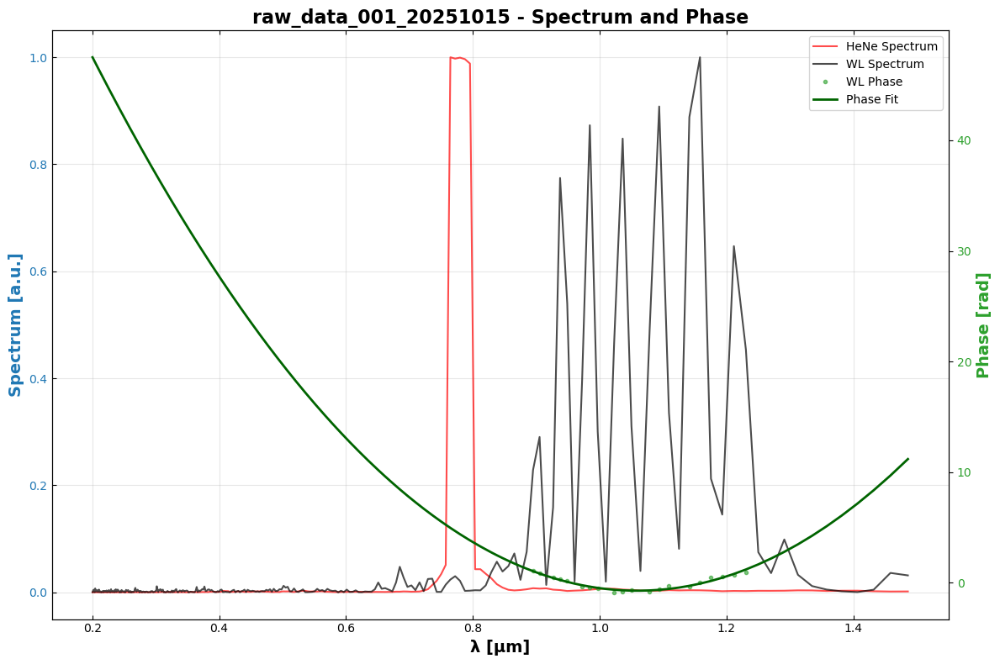


Processing: raw_data_002_20251015
  Zero delay correction: 0.017666
  Polynomial coefficients: [  52.610081   -113.08860194   60.30995622]


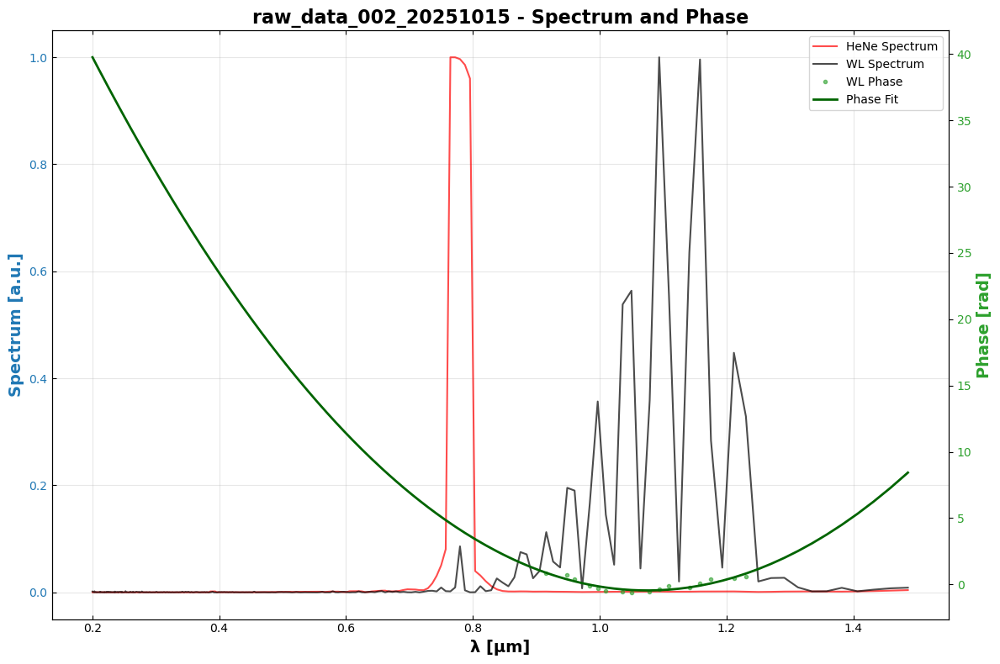


Processing: raw_data_003_20251015
  Zero delay correction: 0.017997
  Polynomial coefficients: [  68.50968676 -146.19529351   77.365129  ]


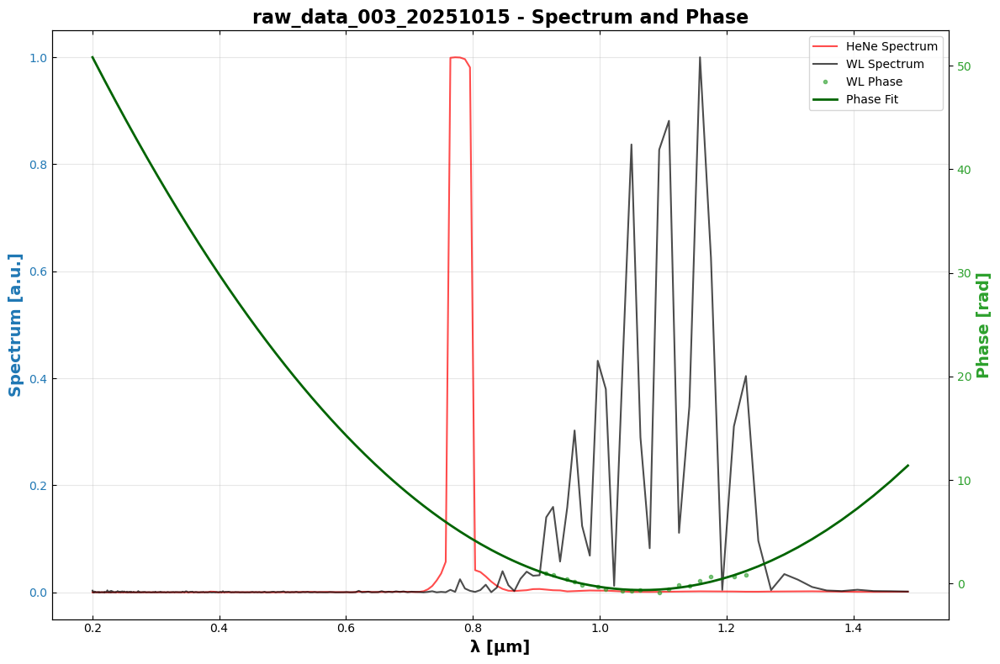


Processing: raw_data_004_20251015
  Zero delay correction: 0.017908
  Polynomial coefficients: [  48.24396854 -103.14519937   54.66989114]


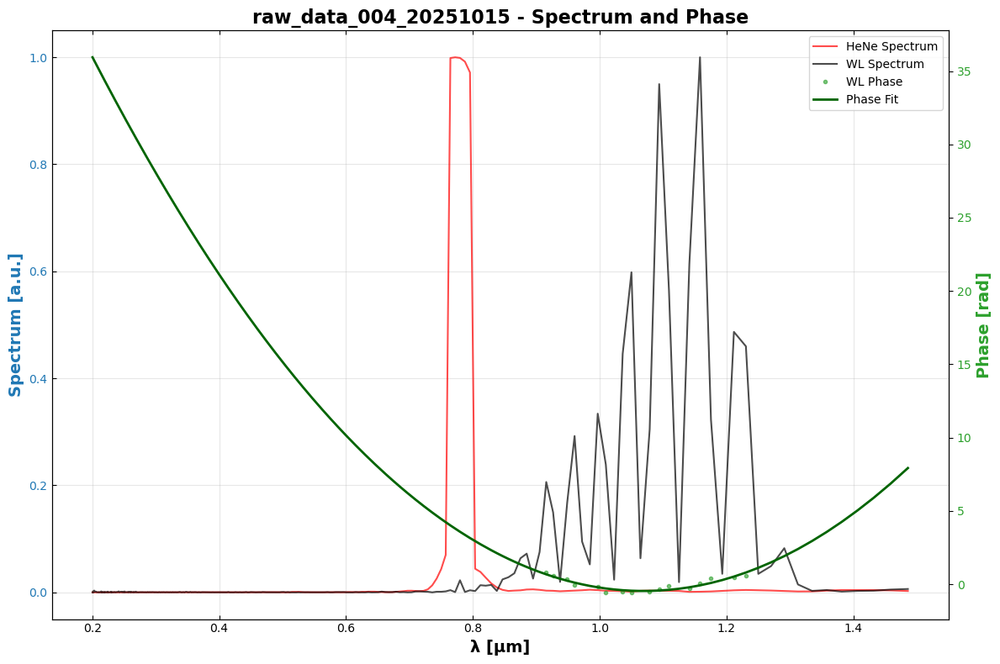


Processing: raw_data_005_20251015
  Zero delay correction: 0.014728
  Polynomial coefficients: [  50.86115201 -109.77623531   58.68481222]


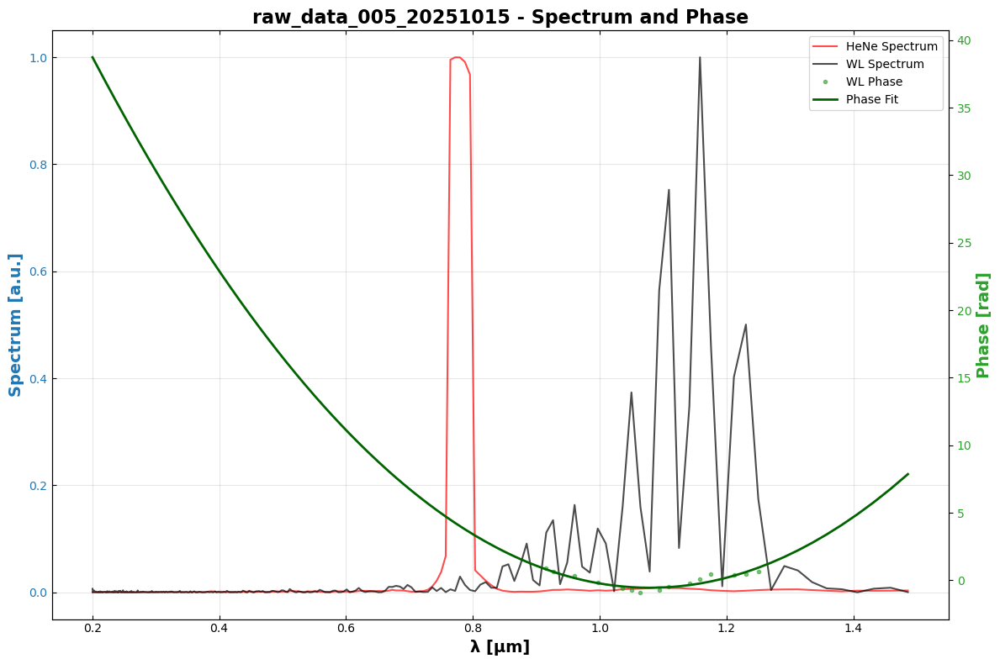


Processing: raw_data_006_20251015
  Zero delay correction: 0.018053
  Polynomial coefficients: [ 112.56812224 -236.4397786   122.92351461]


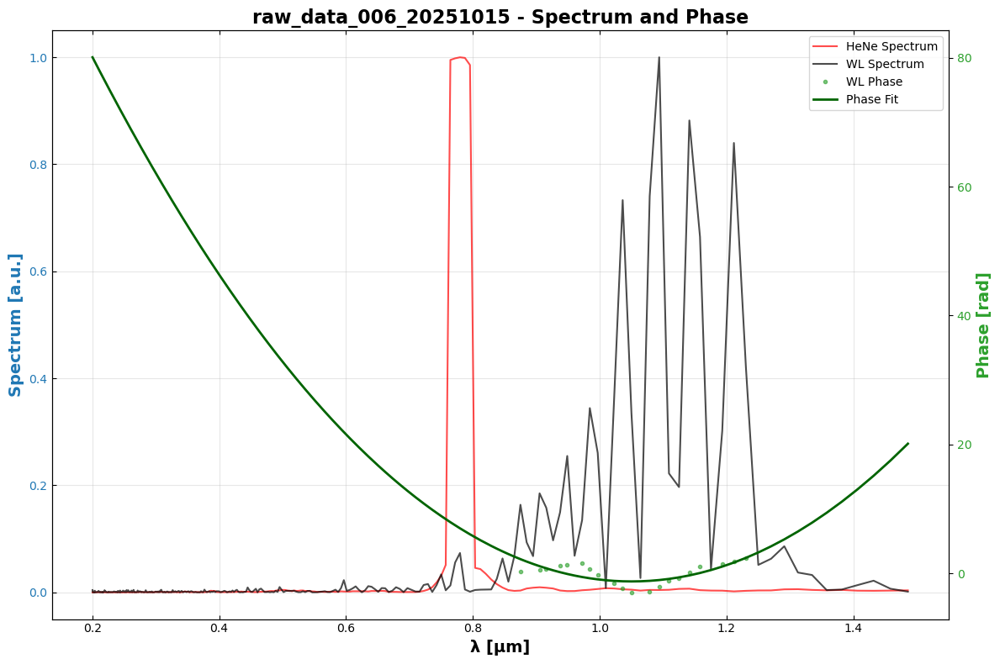


Processing: raw_data_007_20251015
  Zero delay correction: 0.017737
  Polynomial coefficients: [  60.95412481 -129.75137363   68.42926403]


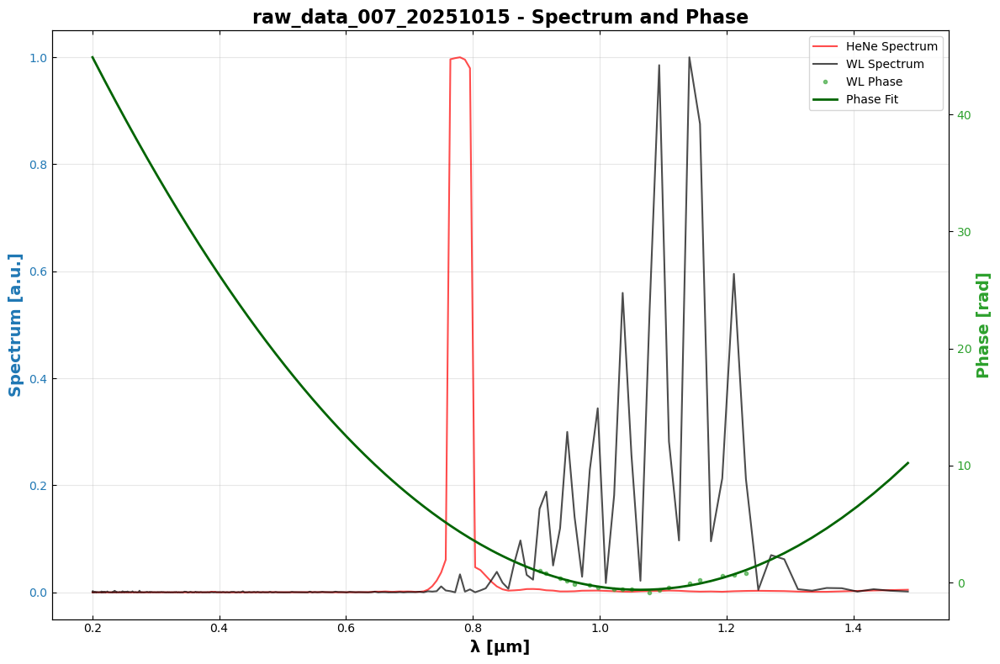


Processing: raw_data_008_20251015
  Zero delay correction: 0.015669
  Polynomial coefficients: [  62.68938664 -134.6122107    71.60053367]


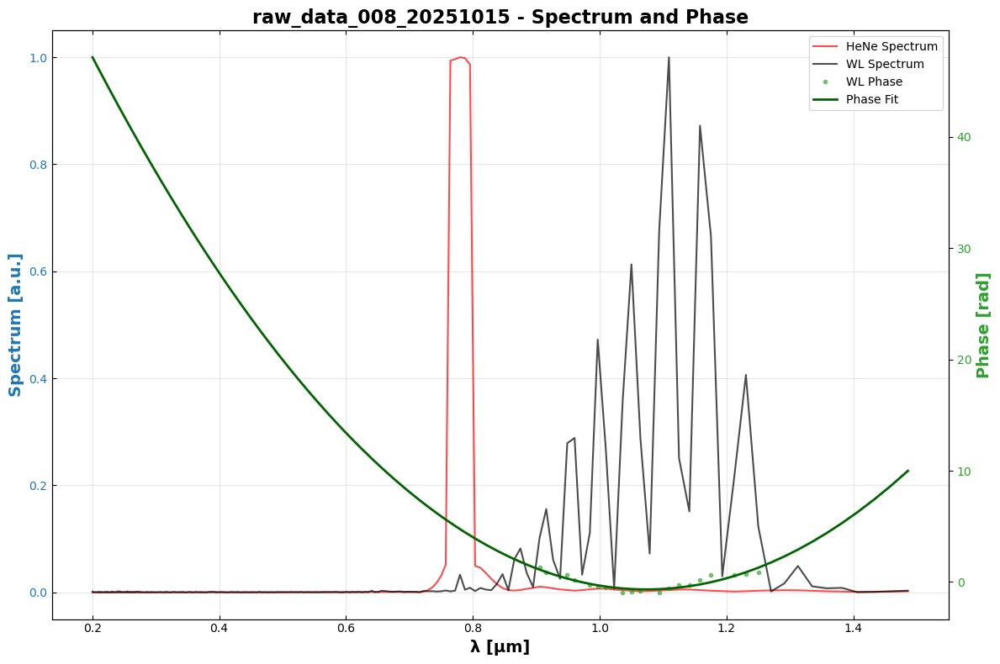


Processing: raw_data_009_20251015
  Zero delay correction: 0.017644
  Polynomial coefficients: [-79.20155253 170.44559149 -90.83530021]


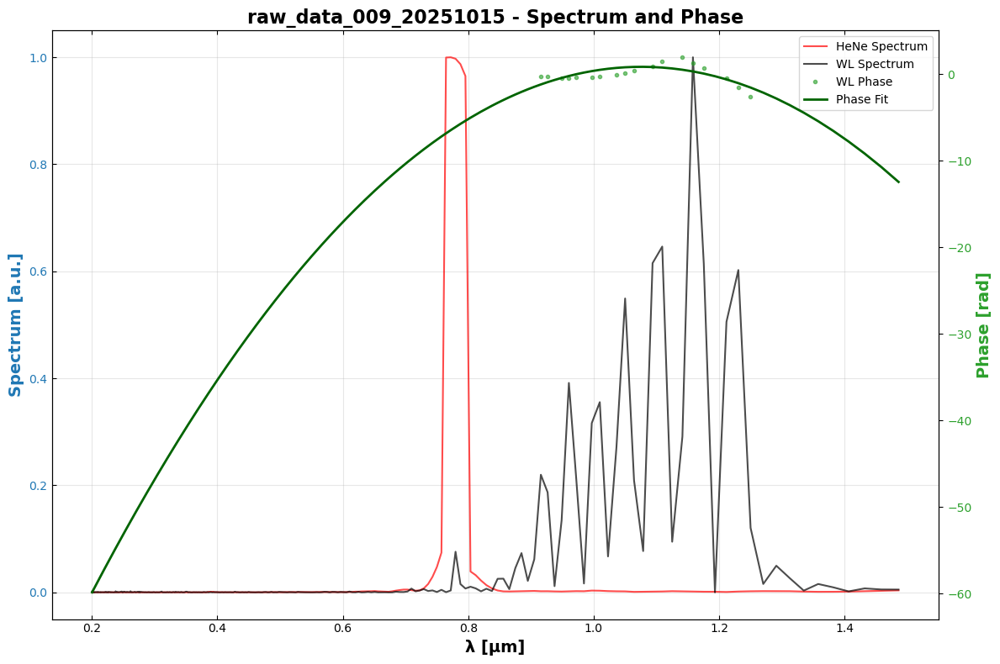


Processing: raw_data_010_20251015
  Zero delay correction: 0.017995
  Polynomial coefficients: [  60.3481207  -129.94511135   69.32234971]


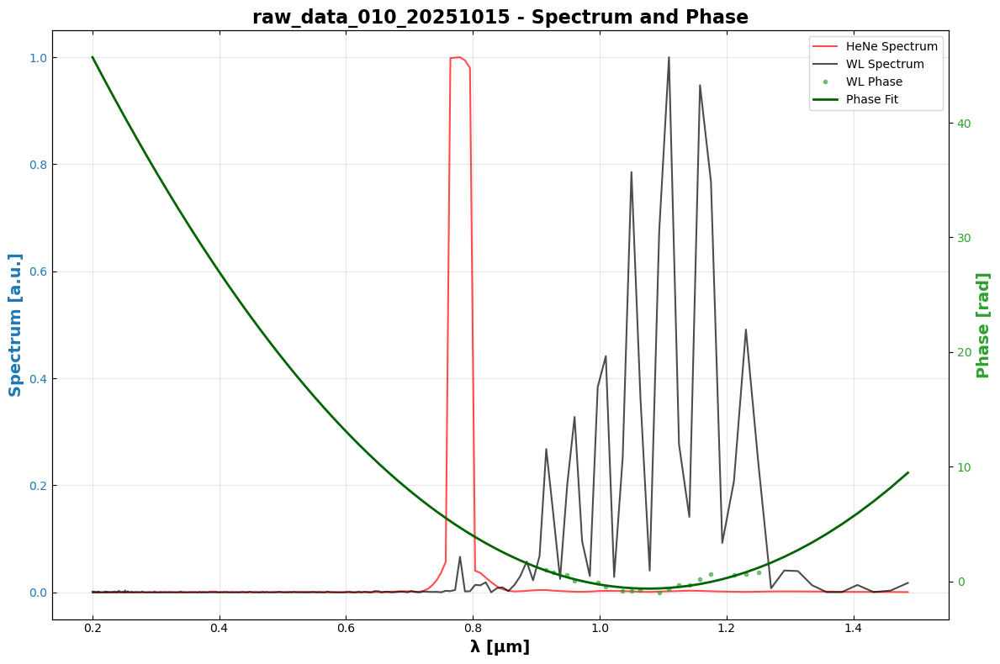


Processing: raw_data_011_20251015
  Zero delay correction: 0.014712
  Polynomial coefficients: [  59.01969546 -127.20298362   67.92840456]


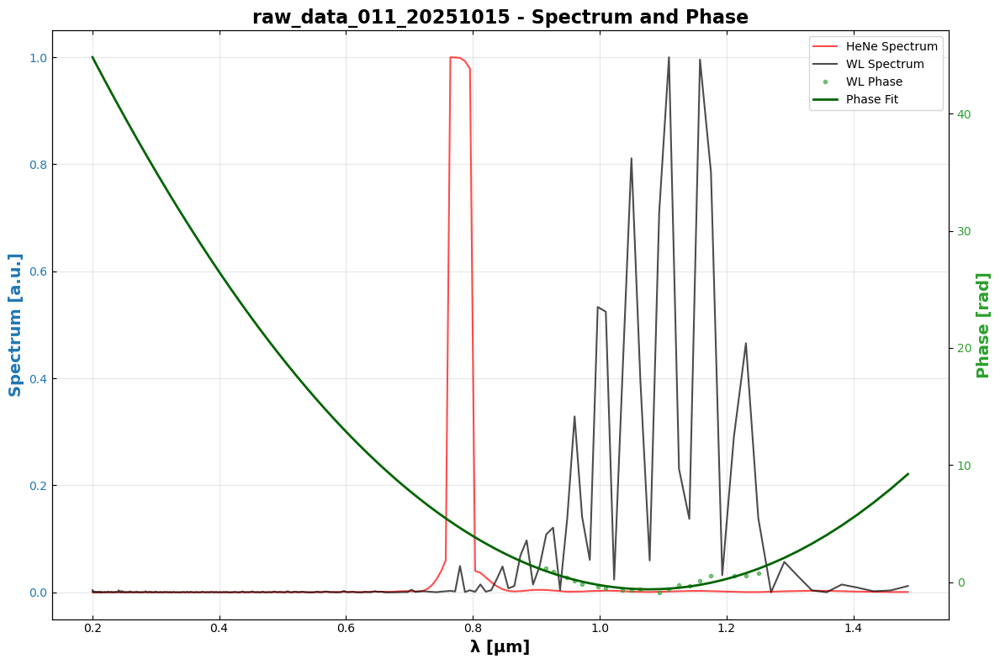


Processing: raw_data_012_20251015
  Zero delay correction: 0.017941
  Polynomial coefficients: [  51.40868775 -110.94642273   59.34254438]


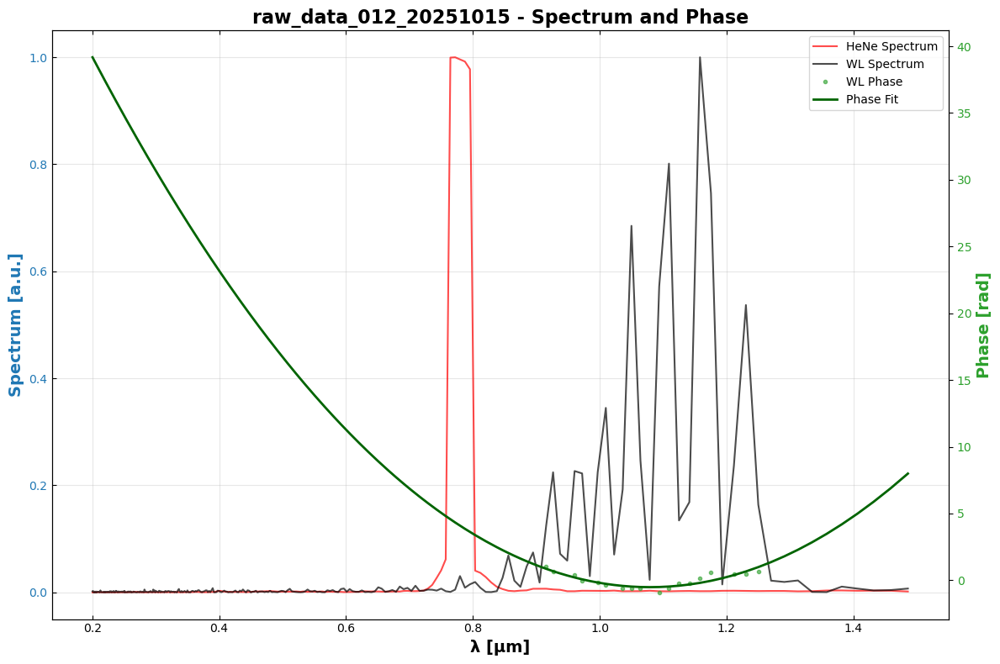


Processing: raw_data_013_20251015
  Zero delay correction: 0.017888
  Polynomial coefficients: [  56.6290281  -122.32018212   65.50124015]


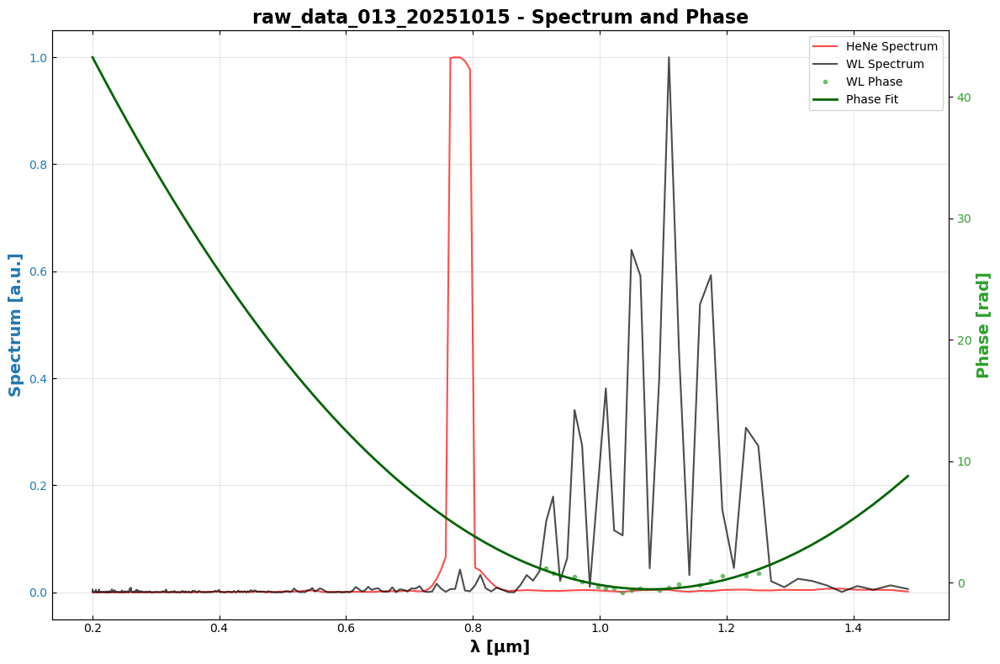


Processing: raw_data_014_20251015
  Zero delay correction: 0.017995
  Polynomial coefficients: [  53.67970791 -115.43811151   61.56889682]


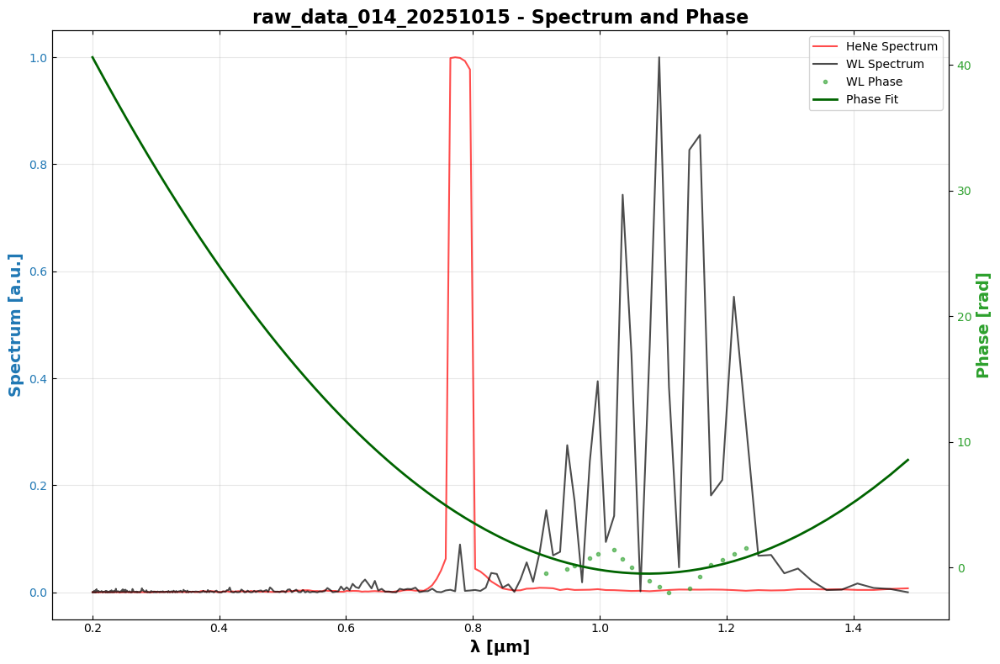


Processing: raw_data_015_20251015
  Zero delay correction: 0.014698
  Polynomial coefficients: [  68.03918728 -144.94333223   76.51245565]


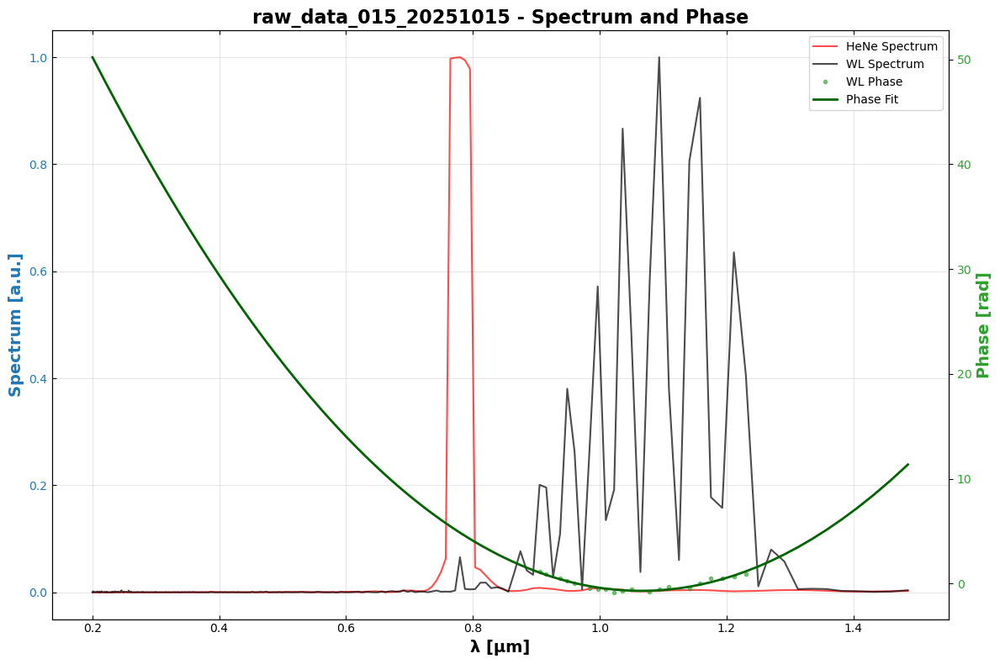


Processing: raw_data_016_20251015
  Zero delay correction: 0.017955
  Polynomial coefficients: [  57.19684182 -123.23287713   65.77995648]


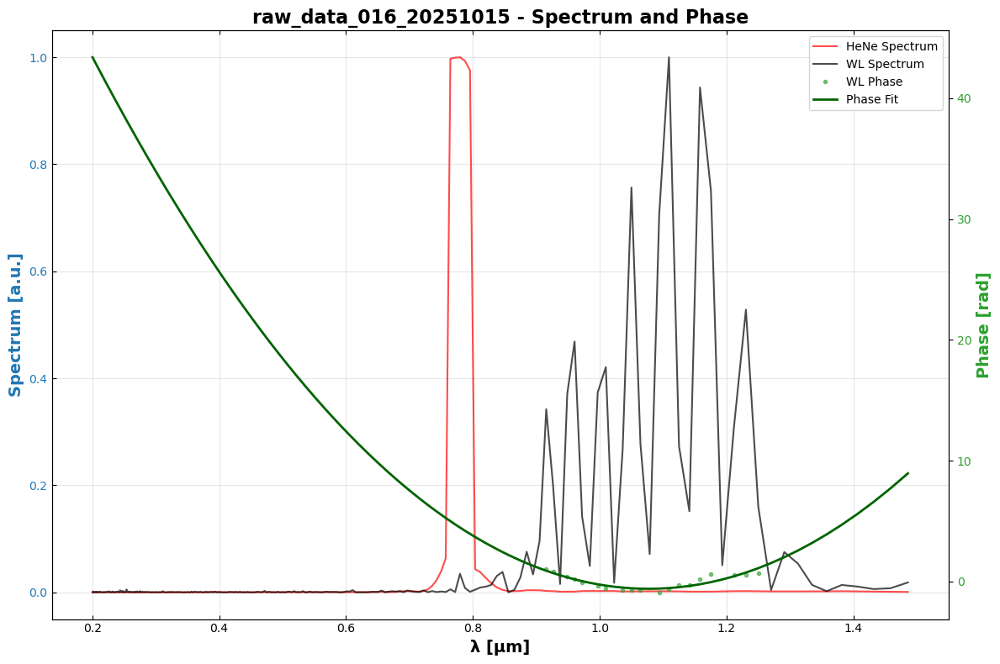


Processing: raw_data_017_20251015
  Zero delay correction: 0.018054
  Polynomial coefficients: [  58.63523508 -125.92298779   67.1187812 ]


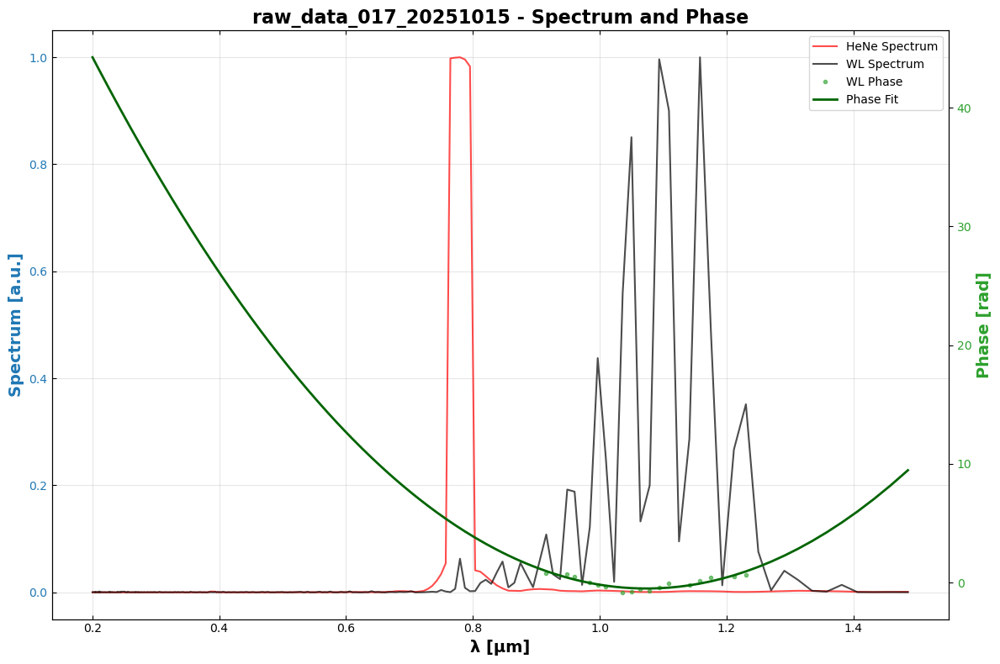


Processing: raw_data_018_20251015
  Zero delay correction: 0.016352
  Polynomial coefficients: [-2.65450405  5.21447002 -2.54729484]


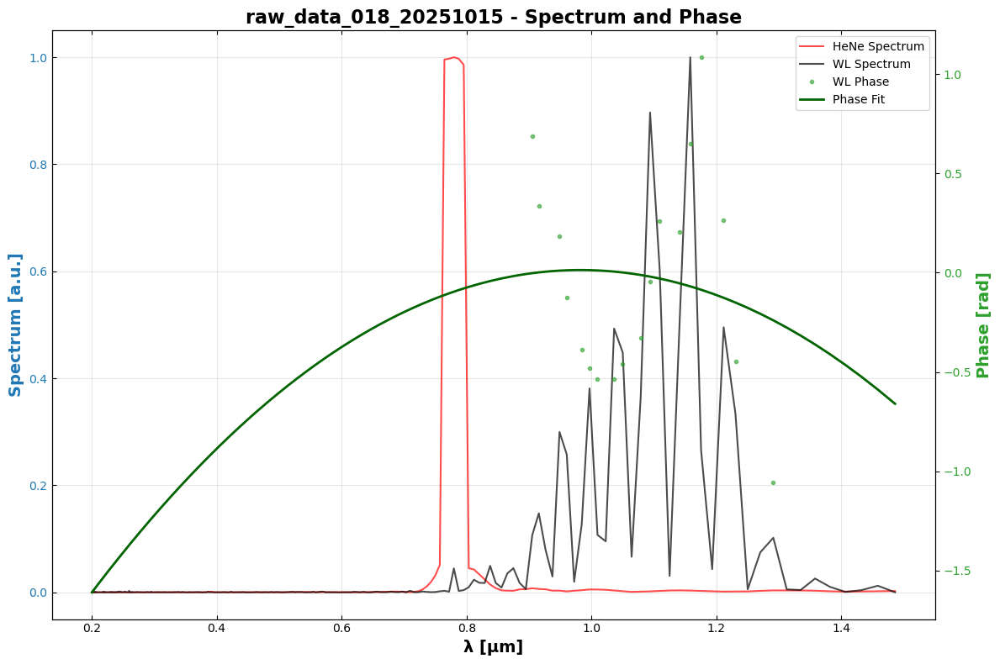


Processing: raw_data_019_20251015
  Zero delay correction: 0.015670
  Polynomial coefficients: [  60.80948791 -129.81755507   68.72184747]


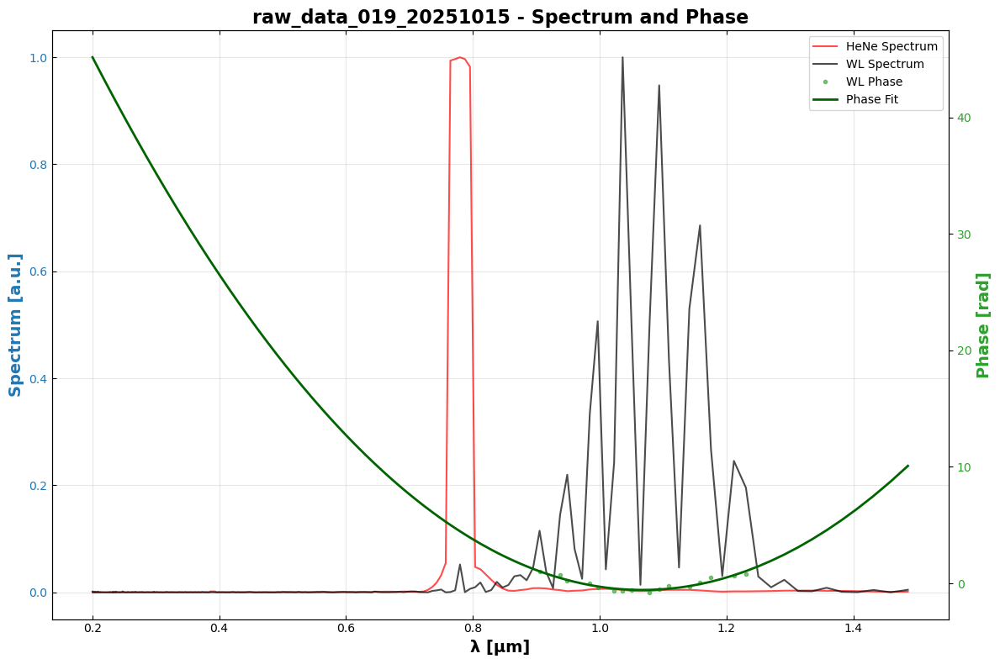


Processing: raw_data_020_20251015
  Zero delay correction: 0.017943
  Polynomial coefficients: [  53.26567377 -115.24970679   61.82284974]


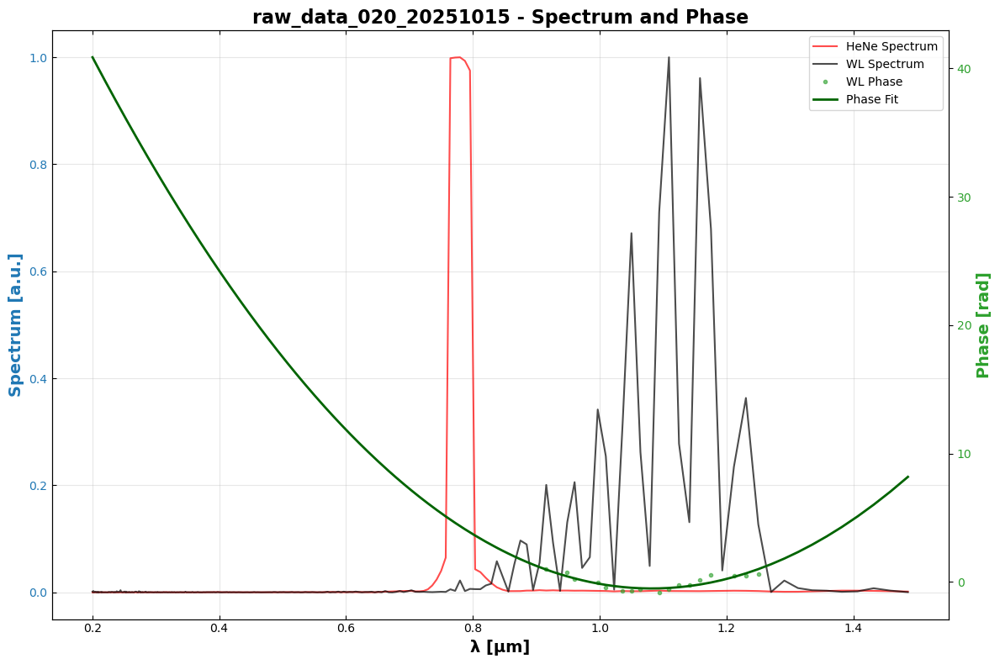


Processing: raw_data_021_20251015
  Zero delay correction: 0.014085
  Polynomial coefficients: [-59.73627975 128.33068884 -68.4365684 ]


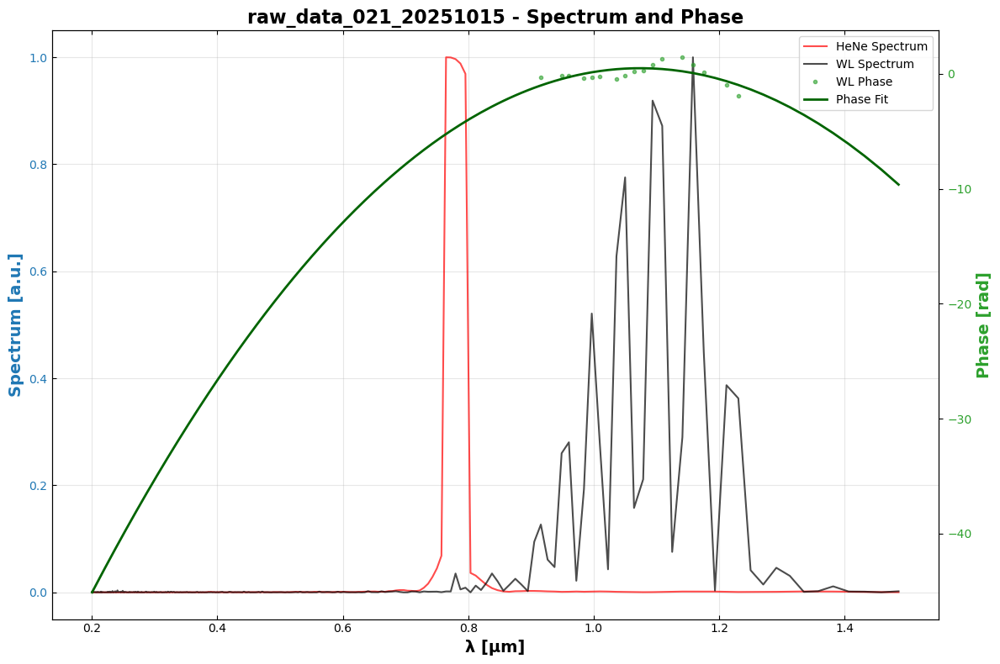


Processing: raw_data_022_20251015
  Zero delay correction: 0.017864
  Polynomial coefficients: [  59.84032534 -127.76034393   67.68063551]


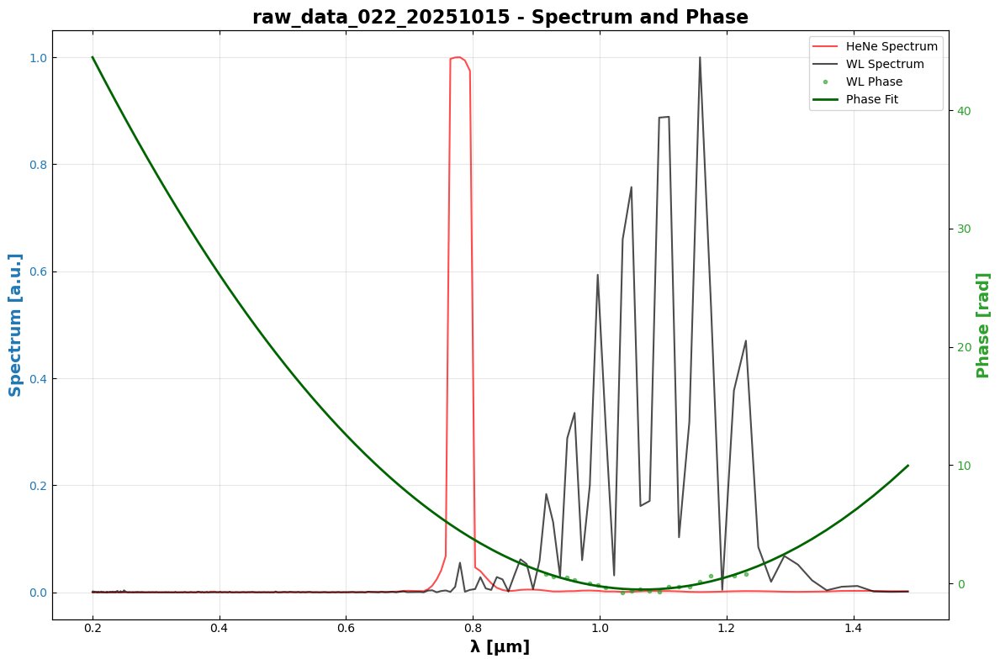


Processing: raw_data_023_20251015
  Zero delay correction: 0.015697
  Polynomial coefficients: [  53.253548   -115.24016986   61.85712415]


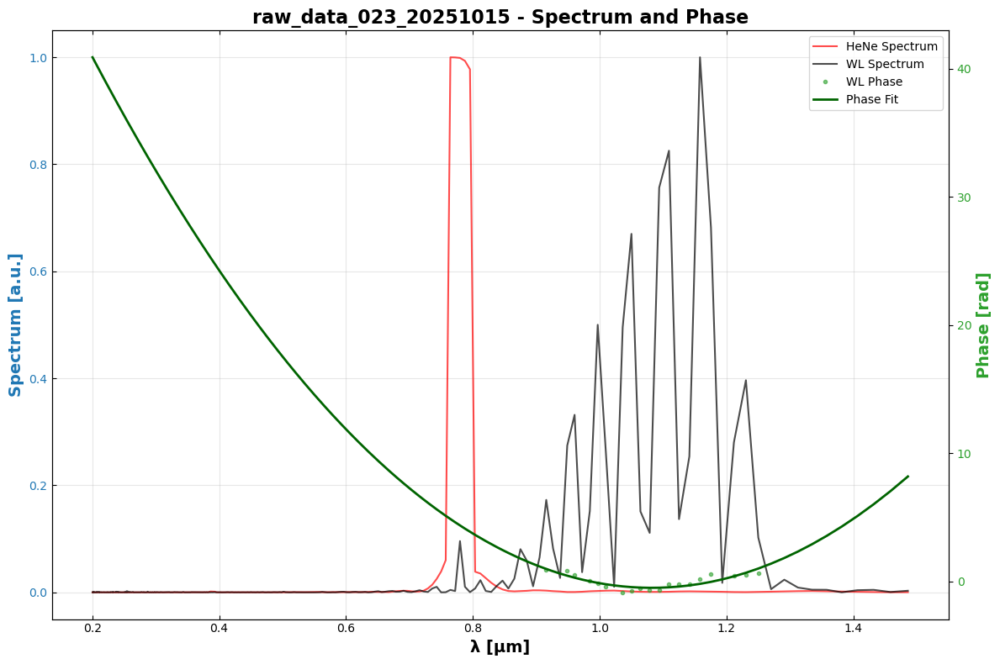


Processing: raw_data_024_20251015
  Zero delay correction: 0.018045
  Polynomial coefficients: [  49.94747051 -108.27094359   58.17176143]


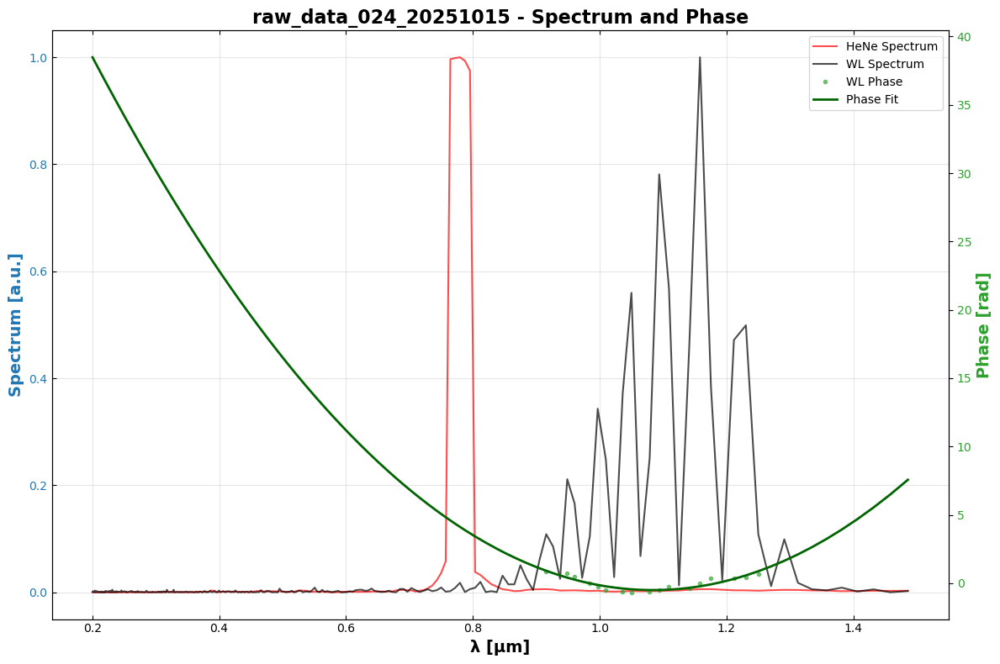


Processing: raw_data_025_20251015
  Zero delay correction: 0.014750
  Polynomial coefficients: [  61.99373489 -134.12832955   72.06504524]


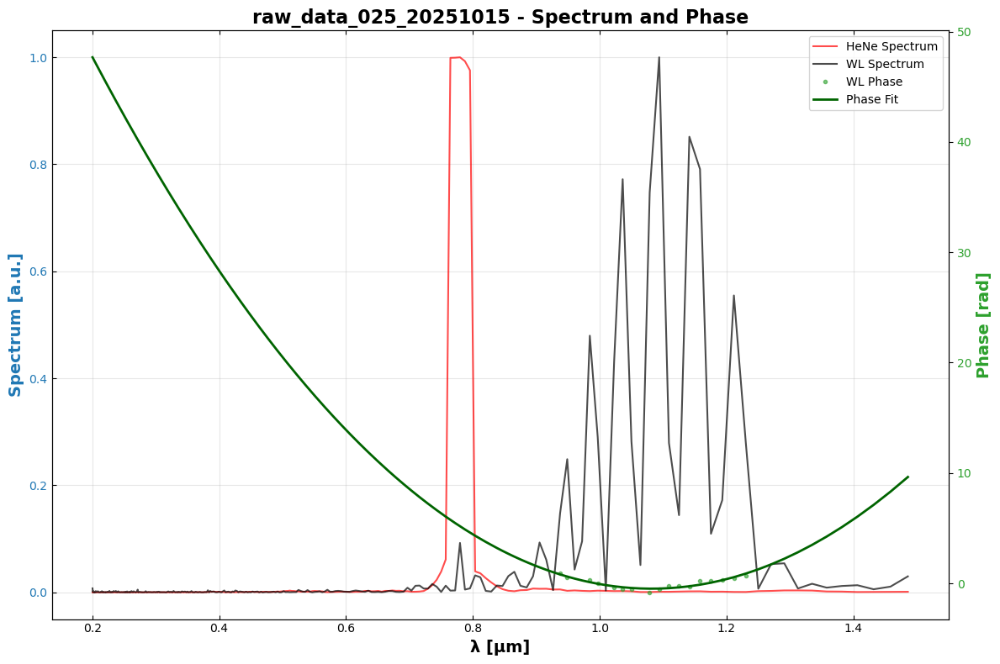



Calculating averaged spectrum and phase...
Averaged 25 datasets
Average phase polynomial coefficients: [ 20.95081519 -46.40591091  25.4173806 ]


C:\Users\James\AppData\Local\Temp\ipykernel_24768\2149642150.py:556: RuntimeWarning: Mean of empty slice
  phase_avg = np.nanmean(phases_interp, axis=0)


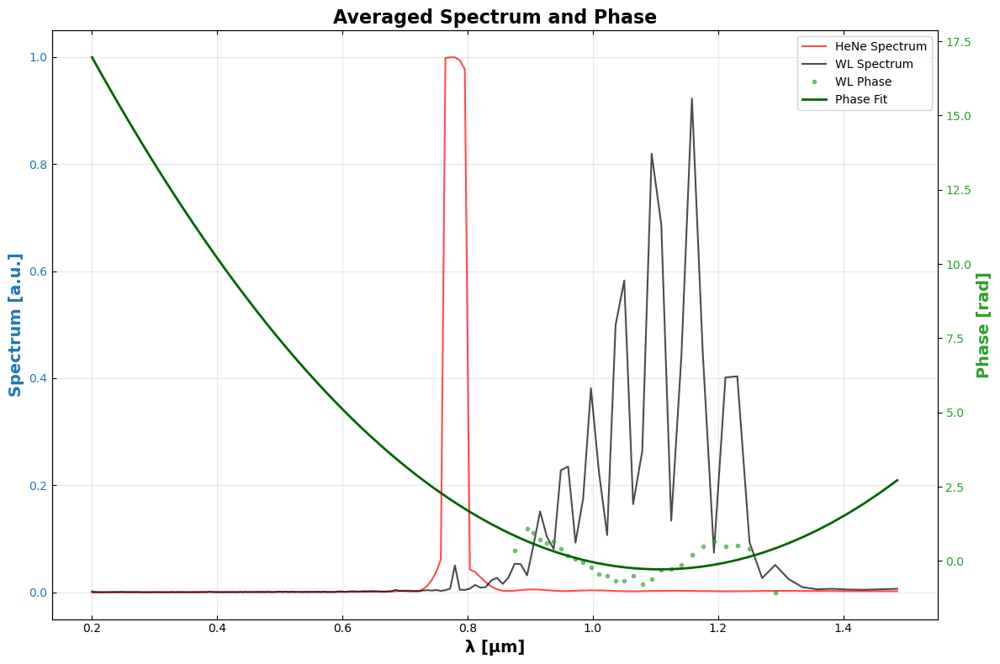

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy.io as sio
from scipy.signal import correlate
from scipy.interpolate import interp1d
from scipy.ndimage import uniform_filter1d
import h5py
from scipy.stats import pearsonr

def extract_data(folder):
    """Extract data from .mat files in the specified folder"""
    data_dict = {}

    for filename in os.listdir(folder):
        if filename.endswith('.mat'):
            file_path = os.path.join(folder, filename)
            file_key = os.path.splitext(filename)[0]

            try:
                # Try loading with scipy.io (for most MATLAB files)
                mat_data = sio.loadmat(file_path)
                clean_data = {k: v for k, v in mat_data.items() if not k.startswith('__')}

            except NotImplementedError:
                # If it's a v7.3 (HDF5-based) file, use h5py
                with h5py.File(file_path, 'r') as f:
                    clean_data = {}
                    def recursively_load(name, obj):
                        if isinstance(obj, h5py.Dataset):
                            clean_data[name] = np.array(obj)
                    f.visititems(recursively_load)

            # Extract 'dataArray' key from file structure
            if 'dataArray' in clean_data:
                arr = clean_data['dataArray']
                if arr.ndim == 2 and arr.shape[1] >= 2:
                    HN_data = arr[:, 0]
                    WL_data = arr[:, 1]

                    data_dict[f'{file_key}_HN_data'] = HN_data
                    data_dict[f'{file_key}_WL_data'] = WL_data

            # Metadata stored here in case it is needed later
            meta = {}
            for key in ['runTime', 'xCenCorrection', 'xLinear', 'xLinearStage']:
                if key in clean_data:
                    meta[key] = clean_data[key]
            data_dict[f'{file_key}_meta'] = meta

    return data_dict


def nfft(a, axis=0):
    """Numpy equivalent of MATLAB's ifftshift(fft(fftshift(a)))"""
    return np.fft.ifftshift(np.fft.fft(np.fft.fftshift(a, axes=axis), axis=axis), axes=axis)


def nifft(a, axis=0):
    """Numpy equivalent of MATLAB's fftshift(ifft(ifftshift(a)))"""
    return np.fft.fftshift(np.fft.ifft(np.fft.ifftshift(a, axes=axis), axis=axis), axes=axis)


def smooth(data, window_size):
    """Simple moving average smoothing"""
    return uniform_filter1d(data, size=window_size, mode='nearest')


def calibrateDelayAxis(v, xL):
    """
    Calibrate the delay axis using knowledge of the HeNe wavelength
    
    Parameters:
    -----------
    v : HeNe voltage/intensity signal
    xL : Linear x-grid (delay axis)
    
    Returns:
    --------
    xNL : Nonlinear corrected x-grid
    """
    # HeNe wavelength in mm
    lambdaHeNe = 0.6328 / 1000  # 632.8 nm converted to mm
    
    # Angular wave number
    k = 2 * np.pi / lambdaHeNe
    
    # Step size
    dx_mm = np.mean(np.diff(xL))
    
    # Number of points in the grid
    N = len(xL)
    
    # Spatial frequency grid
    # Step size in frequency domain
    dfx = 1 / (dx_mm * N)
    
    # Maximum extent
    fxMax = 1 / dx_mm
    
    # Frequency grid
    fx = np.arange(-fxMax/2, fxMax/2, dfx)
    
    # Ensure fx and v have the same length
    if len(fx) > N:
        fx = fx[:N]
    elif len(fx) < N:
        fx = np.linspace(-fxMax/2, fxMax/2, N)
    
    # Take the Fourier transform of the voltage array
    V = np.fft.fftshift(np.fft.fft(np.fft.ifftshift(v)))
    
    # The AC peak is located near
    p0 = 1 / lambdaHeNe
    
    # Find the nearest pixel to this location
    idx = np.argmin(np.abs(p0 - fx))
    idx0 = np.argmin(np.abs(fx))
    
    # Construct a super-Gaussian filter
    # Super-Gaussian order
    n = 22
    
    # Half-width
    sigma = (idx - (N/2 + 1)) * dfx * 0.25
    
    # Filter
    G = np.exp(-((fx - fx[idx])**n) / (sigma**n))
    
    # Multiply by the filter and circshift to the center
    V = np.roll(G * V, -(idx - idx0))
    
    # Inverse Fourier transform
    v2 = np.fft.fftshift(np.fft.ifft(np.fft.ifftshift(V)))
    
    # Extract the phase and unwrap
    phi = np.unwrap(np.angle(v2))
    
    # Solve for the position dependent correction
    delta_x = phi / k
    
    # Add these deltas back to the original x-grid
    xNL = xL + delta_x
    
    return xNL


def removeLinearTerm(w, phase):
    """Remove linear term from phase using polynomial fit"""
    idx = ~np.isnan(phase)
    if np.sum(idx) < 2:
        return phase
    
    nanPhase = phase[idx]
    nanW = w[idx]
    
    # Fit linear polynomial
    p = np.polyfit(nanW, nanPhase, 1)
    phase = phase - p[0] * w - p[1]
    
    return phase


def calculateZeroDelayCorrection(w, dw, xL, wl_data):
    """Calculate zero delay correction from white light data"""
    wlSpec = nfft(wl_data - np.median(wl_data))
    wlSpec[w < 0] = 0
    
    # Calculate center of mass in frequency domain
    wCen = np.sum(w * np.abs(wlSpec)**2) / np.sum(np.abs(wlSpec)**2)
    wCenPx = int(np.round(wCen / dw))
    wlSpec = np.roll(wlSpec, -wCenPx)
    
    wlTemp = smooth(np.abs(nifft(smooth(wlSpec, 5)))**2, 5)
    
    xCen = np.sum(xL * wlTemp) / np.sum(wlTemp)
    
    return xCen, wlSpec


def WLI_processData(dataArray, xL, start_idx=None, end_idx=None):
    """
    Process WLI data to extract spectrum and phase
    
    Parameters:
    -----------
    dataArray : 2D array with columns [HeNe, WhiteLight]
    xL : Linear delay axis
    start_idx, end_idx : Optional indices to slice the data
    
    Returns:
    --------
    xCen : Zero delay correction
    spectrum : Processed spectrum (HeNe and WL)
    wLPhase : Unwrapped white light phase
    lambda_vals : Wavelength array
    """
    
    # Slice data if indices provided
    if start_idx is not None and end_idx is not None:
        dataArray = dataArray[start_idx:end_idx, :]
        xL = xL[start_idx:end_idx]
    
    N = len(dataArray)
    heneData = dataArray[:, 0]
    
    # Calibrate delay axis (simplified - keeping linear for now)
    xNL = calibrateDelayAxis(heneData, xL)
    
    # Interpolate data onto calibrated axis
    f_hene = interp1d(xNL, heneData, kind='cubic', fill_value=0, bounds_error=False)
    f_wl = interp1d(xNL, dataArray[:, 1], kind='cubic', fill_value=0, bounds_error=False)
    dataArray_interp = np.column_stack([f_hene(xL), f_wl(xL)])
    
    # Calculate frequency axis
    c_mm_ps = 0.3  # Speed of light in mm/ps
    t = 2 * xL / c_mm_ps
    dw = 2 * np.pi / (np.max(np.abs(t)) - np.min(np.abs(t)))
    wMax = dw * N
    w = np.arange(-wMax/2, wMax/2, dw)
    
    # Ensure w and data have same length
    if len(w) > N:
        w = w[:N]
    elif len(w) < N:
        # Pad or trim as needed
        w = np.linspace(-wMax/2, wMax/2, N)
    
    # Convert to wavelength (in microns)
    lambda_vals = (2 * np.pi * c_mm_ps / w) * 1000
    idx = (lambda_vals > 0.2) & (lambda_vals < 1.5)
    lambda_vals = lambda_vals[idx]
    w_selected = w[idx]
    
    # Calculate zero delay correction
    xCen = calculateZeroDelayCorrection(w, dw, xL, dataArray_interp[:, 1])[0]
    
    # Process field - subtract baseline
    # Use median subtraction like MATLAB: dataArray(256,:) for reference point
    ref_idx = N // 4  # Equivalent to 256 for N=1024
    field = dataArray_interp - dataArray_interp[ref_idx, :]
    field[field < -0.03] = 0
    field = nfft(field, axis=0)
    
    # Calculate spectrum
    spectrum = np.abs(field)**2
    
    # Extract white light phase from selected frequency range
    wLPhase = np.unwrap(np.angle(field[idx, 1]))
    
    # Smooth and normalize spectrum in selected range
    spectrum = spectrum[idx, :]
    spectrum[:, 0] = smooth(spectrum[:, 0], 5)
    
    # Normalize each column independently
    for col in range(spectrum.shape[1]):
        spec_min = np.min(spectrum[:, col])
        spec_max = np.max(spectrum[:, col])
        if spec_max > spec_min:
            spectrum[:, col] = (spectrum[:, col] - spec_min) / (spec_max - spec_min)
    
    # Mask low-intensity regions in phase (blank where WL spectrum is weak)
    phaseBlank = spectrum[:, 1] < 0.1
    wLPhase[phaseBlank] = np.nan
    
    # Remove linear term from phase using frequency axis
    wLPhase = removeLinearTerm(w_selected, wLPhase)
    
    # Smooth phase (only non-NaN values)
    valid_idx = ~np.isnan(wLPhase)
    if np.sum(valid_idx) > 5:
        wLPhase_smooth = wLPhase.copy()
        wLPhase_smooth[valid_idx] = smooth(wLPhase[valid_idx], 5)
        wLPhase = wLPhase_smooth
    
    return xCen, spectrum, wLPhase, lambda_vals, w_selected


def fit_phase_polynomial(lambda_vals, phase, degree=2):
    """
    Fit phase with polynomial of specified degree
    
    Parameters:
    -----------
    lambda_vals : Wavelength array
    phase : Phase array (may contain NaNs)
    degree : Polynomial degree (default=2 for quadratic)
    
    Returns:
    --------
    coeffs : Polynomial coefficients
    phase_fit : Fitted phase values
    """
    # Remove NaN values for fitting
    valid_idx = ~np.isnan(phase)
    
    if np.sum(valid_idx) < degree + 1:
        return None, None
    
    # Fit polynomial
    coeffs = np.polyfit(lambda_vals[valid_idx], phase[valid_idx], degree)
    
    # Evaluate polynomial
    phase_fit = np.polyval(coeffs, lambda_vals)
    
    return coeffs, phase_fit


def plot_spectrum_and_phase(lambda_vals, spectrum, phase, phase_fit=None, title="WLI Data"):
    """
    Plot spectrum and phase on dual y-axis
    
    Parameters:
    -----------
    lambda_vals : Wavelength array in microns
    spectrum : Spectrum array (2 columns: HeNe, WL)
    phase : Phase array
    phase_fit : Optional fitted phase
    title : Plot title
    """
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Plot spectrum on left axis
    color1 = 'tab:blue'
    ax1.set_xlabel('λ [μm]', fontweight='bold', fontsize=14)
    ax1.set_ylabel('Spectrum [a.u.]', fontweight='bold', fontsize=14, color=color1)
    ax1.plot(lambda_vals, spectrum[:, 0], label='HeNe Spectrum', color='red', alpha=0.7)
    ax1.plot(lambda_vals, spectrum[:, 1], label='WL Spectrum', color='black', alpha=0.7)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.tick_params(axis='both', which='both', direction='in', top=True, right=True)
    ax1.grid(True, alpha=0.3)
    
    # Plot phase on right axis
    ax2 = ax1.twinx()
    color2 = 'tab:green'
    ax2.set_ylabel('Phase [rad]', fontweight='bold', fontsize=14, color=color2)
    ax2.plot(lambda_vals, phase, 'o', label='WL Phase', color=color2, markersize=3, alpha=0.6)
    
    if phase_fit is not None:
        ax2.plot(lambda_vals, phase_fit, '-', label='Phase Fit', color='darkgreen', linewidth=2)
    
    ax2.tick_params(axis='y', labelcolor=color2)
    
    # Combine legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=10)
    
    plt.title(title, fontweight='bold', fontsize=16)
    plt.tight_layout()
    
    return fig, (ax1, ax2)


def plot_diagnostic(dataArray, xL, field_fft, w, lambda_vals, title="Diagnostic Plot"):
    """
    Create diagnostic plots to understand the FFT and phase extraction
    
    Parameters:
    -----------
    dataArray : Original data array
    xL : Position axis
    field_fft : FFT of the field
    w : Angular frequency array
    lambda_vals : Wavelength array
    title : Plot title
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Plot 1: Raw data in spatial domain
    axes[0, 0].plot(xL, dataArray[:, 0], label='HeNe', color='red', alpha=0.7)
    axes[0, 0].plot(xL, dataArray[:, 1], label='WL', color='black', alpha=0.7)
    axes[0, 0].set_xlabel('Position [mm]', fontweight='bold')
    axes[0, 0].set_ylabel('Intensity', fontweight='bold')
    axes[0, 0].set_title('Raw Interferogram', fontweight='bold')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Plot 2: Spectrum in frequency domain (positive frequencies)
    pos_idx = w > 0
    freq_lambda = (2 * np.pi * 0.3 / w[pos_idx]) * 1000  # Convert to wavelength
    valid_lambda = (freq_lambda > 0.2) & (freq_lambda < 2.0)
    
    axes[0, 1].plot(freq_lambda[valid_lambda], np.abs(field_fft[pos_idx, 0][valid_lambda])**2, 
                    label='HeNe', color='red', alpha=0.7)
    axes[0, 1].plot(freq_lambda[valid_lambda], np.abs(field_fft[pos_idx, 1][valid_lambda])**2, 
                    label='WL', color='black', alpha=0.7)
    axes[0, 1].set_xlabel('λ [μm]', fontweight='bold')
    axes[0, 1].set_ylabel('Power Spectrum', fontweight='bold')
    axes[0, 1].set_title('FFT Magnitude', fontweight='bold')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].set_xlim([0.4, 1.2])
    
    # Plot 3: Raw (wrapped) phase
    axes[1, 0].plot(freq_lambda[valid_lambda], np.angle(field_fft[pos_idx, 1][valid_lambda]), 
                    'o', markersize=2, color='blue', alpha=0.6)
    axes[1, 0].set_xlabel('λ [μm]', fontweight='bold')
    axes[1, 0].set_ylabel('Phase [rad]', fontweight='bold')
    axes[1, 0].set_title('Raw Phase (Wrapped)', fontweight='bold')
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_xlim([0.4, 1.2])
    
    # Plot 4: Unwrapped phase
    unwrapped_phase = np.unwrap(np.angle(field_fft[pos_idx, 1][valid_lambda]))
    axes[1, 1].plot(freq_lambda[valid_lambda], unwrapped_phase, 
                    'o', markersize=2, color='green', alpha=0.6)
    axes[1, 1].set_xlabel('λ [μm]', fontweight='bold')
    axes[1, 1].set_ylabel('Phase [rad]', fontweight='bold')
    axes[1, 1].set_title('Unwrapped Phase', fontweight='bold')
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_xlim([0.4, 1.2])
    
    plt.suptitle(title, fontweight='bold', fontsize=16)
    plt.tight_layout()
    
    return fig


# Main processing script
if __name__ == "__main__":
    # Path to data
    path = '../Team32025/WLI_With_Glass_20251015/'
    data = extract_data(path)
    
    start_idx = 700
    end_idx = 1550
    
    # Set to True to show diagnostic plots for debugging
    show_diagnostics = False
    
    # Storage for averaged results
    all_spectrums = []
    all_phases = []
    all_lambdas = []
    
    print(f"Processing data from index {start_idx} to {end_idx}")
    print(f"Found {len([k for k in data.keys() if k.endswith('_HN_data')])} datasets\n")
    
    # Process each dataset
    for key in sorted(data.keys()):
        if key.endswith('_HN_data'):
            base_key = key[:-8]
            wl_key = f'{base_key}_WL_data'
            meta_key = f'{base_key}_meta'
            
            if wl_key in data:
                print(f"Processing: {base_key}")
                
                # Get xLinear from metadata or create default
                if meta_key in data and 'xLinear' in data[meta_key]:
                    xL = data[meta_key]['xLinear'].flatten()
                else:
                    # Create default linear axis
                    N = len(data[key])
                    xL = np.linspace(0, 1, N)
                
                # Create data array
                dataArray = np.column_stack([data[key], data[wl_key]])
                
                # Show diagnostic plots if requested (only for first dataset)
                if show_diagnostics and len(all_spectrums) == 0:
                    # Process a portion to show diagnostics
                    N = len(dataArray)
                    if start_idx is not None and end_idx is not None:
                        dataArray_slice = dataArray[start_idx:end_idx, :]
                        xL_slice = xL[start_idx:end_idx]
                    else:
                        dataArray_slice = dataArray
                        xL_slice = xL
                    
                    # Calculate FFT for diagnostics
                    heneData = dataArray_slice[:, 0]
                    xNL = calibrateDelayAxis(heneData, xL_slice)
                    f_hene = interp1d(xNL, heneData, kind='cubic', fill_value=0, bounds_error=False)
                    f_wl = interp1d(xNL, dataArray_slice[:, 1], kind='cubic', fill_value=0, bounds_error=False)
                    dataArray_interp = np.column_stack([f_hene(xL_slice), f_wl(xL_slice)])
                    
                    N_slice = len(dataArray_slice)
                    c_mm_ps = 0.3
                    t = 2 * xL_slice / c_mm_ps
                    dw = 2 * np.pi / (np.max(np.abs(t)) - np.min(np.abs(t)))
                    wMax = dw * N_slice
                    w = np.linspace(-wMax/2, wMax/2, N_slice)
                    
                    field = dataArray_interp - dataArray_interp[N_slice//4, :]
                    field[field < -0.03] = 0
                    field_fft = nfft(field, axis=0)
                    
                    lambda_vals_diag = (2 * np.pi * c_mm_ps / w) * 1000
                    
                    plot_diagnostic(dataArray_interp, xL_slice, field_fft, w, lambda_vals_diag, 
                                  title=f"{base_key} - Diagnostic")
                    plt.show()
                
                # Process the data
                try:
                    xCen, spectrum, wLPhase, lambda_vals, w_vals = WLI_processData(
                        dataArray, xL, start_idx, end_idx
                    )
                    
                    # Fit phase with 2nd degree polynomial
                    coeffs, phase_fit = fit_phase_polynomial(lambda_vals, wLPhase, degree=2)
                    
                    if coeffs is not None:
                        print(f"  Zero delay correction: {xCen:.6f}")
                        print(f"  Polynomial coefficients: {coeffs}")
                        
                        # Store for averaging
                        all_spectrums.append(spectrum)
                        all_phases.append(wLPhase)
                        all_lambdas.append(lambda_vals)
                        
                        # Plot
                        fig, axes = plot_spectrum_and_phase(
                            lambda_vals, spectrum, wLPhase, phase_fit, 
                            title=f"{base_key} - Spectrum and Phase"
                        )
                        plt.show()
                    else:
                        print(f"  Warning: Could not fit polynomial (insufficient valid phase points)")
                    
                except Exception as e:
                    print(f"  Error processing {base_key}: {str(e)}")
                
                print()
    
    # Calculate and plot averaged results
    if len(all_spectrums) > 0:
        print("\nCalculating averaged spectrum and phase...")
        
        # Ensure all have same wavelength axis (interpolate if needed)
        lambda_common = all_lambdas[0]
        
        spectrums_interp = []
        phases_interp = []
        
        for spec, phase, lam in zip(all_spectrums, all_phases, all_lambdas):
            if not np.array_equal(lam, lambda_common):
                # Interpolate to common wavelength axis
                f_spec_hene = interp1d(lam, spec[:, 0], bounds_error=False, fill_value=np.nan)
                f_spec_wl = interp1d(lam, spec[:, 1], bounds_error=False, fill_value=np.nan)
                f_phase = interp1d(lam, phase, bounds_error=False, fill_value=np.nan)
                
                spec_interp = np.column_stack([f_spec_hene(lambda_common), f_spec_wl(lambda_common)])
                phase_interp = f_phase(lambda_common)
            else:
                spec_interp = spec
                phase_interp = phase
            
            spectrums_interp.append(spec_interp)
            phases_interp.append(phase_interp)
        
        # Calculate mean (ignoring NaNs)
        spectrum_avg = np.nanmean(spectrums_interp, axis=0)
        phase_avg = np.nanmean(phases_interp, axis=0)
        
        # Fit averaged phase
        coeffs_avg, phase_fit_avg = fit_phase_polynomial(lambda_common, phase_avg, degree=2)
        
        print(f"Averaged {len(all_spectrums)} datasets")
        print(f"Average phase polynomial coefficients: {coeffs_avg}")
        
        # Plot averaged results
        fig, axes = plot_spectrum_and_phase(
            lambda_common, spectrum_avg, phase_avg, phase_fit_avg,
            title="Averaged Spectrum and Phase"
        )
        plt.show()